In [1]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import fsspec, os
import scipy as sp
import PIL
from PIL import Image
import random
import os
import glob
import re

In [2]:
# Parameters
state = None
selected_data_type = None
RESERVED_SHOT = None
EPOCH_NUM = None
VALIDATION_SPLIT = None
ACTIVATION_FUNC = None
LOSS_FUNC = None
OPTIMIZER_FUNC = None
OUTLIER_CUTOFF = None
NUM_CONV2D_LAYERS = None
NUM_DENSE_LAYERS = None
CONV2D_NEURONS = None
CONV2D_SIZE = None
DENSE_LAYER_NEURONS = None
MAX_POOLING_SIZE = None

In [3]:
# Parameters
state = 3
selected_data_type = "ma2"
RESERVED_SHOT = 119671
EPOCH_NUM = 50
VALIDATION_SPLIT = 0.1
ACTIVATION_FUNC = "relu"
LOSS_FUNC = "mse"
OPTIMIZER_FUNC = "sgd"
OUTLIER_CUTOFF = 94.0
NUM_CONV2D_LAYERS = 2
NUM_DENSE_LAYERS = 1
CONV2D_NEURONS = [64, 64]
CONV2D_SIZE = ["(7, 7)", "(4, 4)"]
DENSE_LAYER_NEURONS = [32]
MAX_POOLING_SIZE = "(4, 4)"


In [4]:
# Manual override logic
manual = False  # Toggle this to True to use manual values, False to skip

if manual:
    state = 3  # state 1, 2, or 3
    selected_data_type = 'ma2'  # ma2 basically always
    if state == 1:
        RESERVED_SHOT = 119671  # for state 1
    elif state == 2:
        RESERVED_SHOT = 114458  # for state 2
    else:
        RESERVED_SHOT = 119671  # Default for state 3 (choosing one from RESERVED_SHOTS[3])
    EPOCH_NUM = 15  # 15
    VALIDATION_SPLIT = 0.2  # 0.2
    ACTIVATION_FUNC = 'relu'  # 'relu'
    LOSS_FUNC = 'mae'  # 'mae'
    OPTIMIZER_FUNC = 'adam'  # 'adam'
    OUTLIER_CUTOFF = 99  # 99
    NUM_CONV2D_LAYERS = 2  # 2 Conv2D layers
    NUM_DENSE_LAYERS = 1  # 1 dense layer
    CONV2D_NEURONS = [16, 16]  # Neurons per Conv2D layer
    CONV2D_SIZE = [(8, 8), (8, 8)]  # Kernel sizes for Conv2D layers
    DENSE_LAYER_NEURONS = [10]  # Neurons for dense layer
    MAX_POOLING_SIZE = (4, 4)  # Max pooling size

    # Update parameters dictionary for Papermill
    parameters = {
        'state': state,
        'selected_data_type': selected_data_type,
        'RESERVED_SHOT': RESERVED_SHOT,
        'EPOCH_NUM': EPOCH_NUM,
        'VALIDATION_SPLIT': VALIDATION_SPLIT,
        'ACTIVATION_FUNC': ACTIVATION_FUNC,
        'LOSS_FUNC': LOSS_FUNC,
        'OPTIMIZER_FUNC': OPTIMIZER_FUNC,
        'OUTLIER_CUTOFF': OUTLIER_CUTOFF,
        'NUM_CONV2D_LAYERS': NUM_CONV2D_LAYERS,
        'NUM_DENSE_LAYERS': NUM_DENSE_LAYERS,
        'CONV2D_NEURONS': CONV2D_NEURONS,
        'CONV2D_SIZE': CONV2D_SIZE,
        'DENSE_LAYER_NEURONS': DENSE_LAYER_NEURONS,
        'MAX_POOLING_SIZE': MAX_POOLING_SIZE
    }

In [5]:
# Define shot lists and file paths
#state = 1  # state 1 -> javier, state 2 -> william, state 3 -> combined
if state == 1:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/' 
    file_path_hbt = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/'
elif state == 2:
    shot_list = [114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
                 114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
                 114462,114464,114467,114468,114472,114473]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/' 
    file_path_hbt = '//Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/' 
elif state == 3:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769,
             114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
             114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
             114462,114464,114467,114468,114472,114473]
    # For shots >= 119000, use Javier's paths
    # For shots < 119000, use William's paths
def get_paths_for_shot(shot_num):
        if shot_num >= 119000:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/')
        else:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/')
 
#selected_data_type = 'ma4'  # Options: 'ma1', 'ma2', 'ma3', 'ma4', 'mp1', 'mp2', 'mp3', 'mp4'
# Notebook type definition
notebook_type = 'untrimmed'  # Set to 'trimmed' or 'untrimmed' based on the notebook
TARGET_FRAME_COUNT = 800
CAMERA_DEPTH = 65535.0 # 2^16
#RESERVED_SHOT = 119671  # Set to a specific shot number or None for random selection

In [6]:
# Helper functions for data processing
def determine_frame_ratio(num_frames, target_frames=TARGET_FRAME_COUNT):
    """
    Determines the frame ratio needed to downsample the data to target_frames.
    Returns the ratio and the actual number of frames after downsampling.
    """
    ratio = max(1, num_frames // target_frames)
    actual_frames = num_frames // ratio
    return ratio, actual_frames

def process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=None):
    """
    Process a single shot's data with automatic frame rate handling.
    Returns: 2D data (32x32), cut 2D data (32x32), and flat data for the shot
    """
    tiff_files = sorted(glob.glob(os.path.join(folder_path, "*.tiff")))
    num_frames = len(tiff_files)
    
    if num_frames == 0:
        raise ValueError(f"No TIFF files found in {folder_path}")
    
    frame_ratio, actual_frames = determine_frame_ratio(num_frames, target_frame_count)
    
    # Initialize shot lists
    flat_shot = []
    shot_2d = []
    cut_shot = []
    
    # Process TIFF files with dynamic frame ratio
    for j, tiff_file in enumerate(tiff_files):
        if j % frame_ratio == 0 and len(shot_2d) < target_frame_count:
            try:
                im = Image.open(tiff_file)
                im = np.array(im, dtype=np.float32)
                im = im / max_pixel_value
                
                # Automatically crop the center 32x32 region of the image
                h, w = im.shape
                if h < 32 or w < 32:
                    raise ValueError(f"Image too small to crop to 32x32: got {h}x{w}")

                start_h = (h - 32) // 2
                start_w = (w - 32) // 2
                cropped_im = im[start_h:start_h + 32, start_w:start_w + 32]

                
                flat_im = cropped_im.reshape(-1)  # Flatten the cropped image (32*32 = 1024)
                cut_2d = cropped_im  # cut_2d is the same as cropped_im (32x32)
                
                shot_2d.append(cropped_im)  # Store cropped image (32x32)
                flat_shot.append(flat_im)
                cut_shot.append(cut_2d)
                
            except Exception as e:
                print(f"Error loading {tiff_file}: {e}")
                continue
    
    return np.array(shot_2d), np.array(cut_shot), np.array(flat_shot)
    
def process_all_shots(shot_list, base_path, max_pixel_value, target_frame_count, state):
    """
    Process multiple shots with automatic frame rate handling
    """
    training_data_2D = []
    cut_training_data_2D = []
    flat_training_data = []
    valid_shots = []
    
    for shot in shot_list:
        if shot == RESERVED_SHOT:
            continue
        if state == 3:
            file_path, _ = get_paths_for_shot(shot)
            folder_path = os.path.join(file_path, str(shot), 'CAM-26731/tiff/')
        else:
            folder_path = os.path.join(base_path, str(shot), 'CAM-26731/tiff/')
        
        try:
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=shot)
            
            if len(shot_2d) == target_frame_count:
                training_data_2D.append(shot_2d)
                cut_training_data_2D.append(cut_2d)
                flat_training_data.append(flat_data)
                valid_shots.append(shot)
            else:
                print(f"Shot {shot} produced {len(shot_2d)} frames, expected {target_frame_count}. Skipping.")
                
        except Exception as e:
            print(f"Error processing shot {shot}: {e}")
            continue
    
    return (np.array(training_data_2D), 
            np.array(cut_training_data_2D), 
            np.array(flat_training_data), valid_shots)

In [7]:
# Load and format HBT data
def format_hbt_data(data, mode_num):
    # Determine frame ratio
    original_length = data[0][0].shape[0] # 5000
    target_length = TARGET_FRAME_COUNT
    frame_ratio = original_length // target_length  # generally 5 (5000/TARGET_FRAME_COUNT)
    
    data = np.asarray(data, dtype=float)
    data = np.reshape(data[:,mode_num-1,:], (len(data), original_length, 1))
    data = data[:,::frame_ratio,:]
    data = data[:,:target_length,:]
    return data

# Load HBT data
hbt_ma_data = []
hbt_mp_data = []
hbt_time_data = []
valid_shots_hbt = []
for i in range(len(shot_list)):
    shot = shot_list[i]
    if state == 3:
        _, file_path_hbt = get_paths_for_shot(shot)
    else:
        file_path_hbt = file_path_hbt
        
    try:
        ma_list = []
        mp_list = []
        for j in range(1,5):
            ma_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Amp.npy'))
            mp_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Phase.npy'))
            ma_list.append(ma_data)
            mp_list.append(mp_data)
        
        hbt_ma_data.append(ma_list)
        hbt_mp_data.append(mp_list)
        time_data = np.load(os.path.join(file_path_hbt, f'{shot}time.npy'))
        hbt_time_data.append(time_data)
        valid_shots_hbt.append(shot)
    except Exception as e:
        print(f"Error loading HBT data for shot {shot}: {e}")
        continue

# Format HBT data
hbt_ma1_data = format_hbt_data(hbt_ma_data, 1)
hbt_ma2_data = format_hbt_data(hbt_ma_data, 2)
hbt_ma3_data = format_hbt_data(hbt_ma_data, 3)
hbt_ma4_data = format_hbt_data(hbt_ma_data, 4)

hbt_mp1_data = format_hbt_data(hbt_mp_data, 1)
hbt_mp2_data = format_hbt_data(hbt_mp_data, 2)
hbt_mp3_data = format_hbt_data(hbt_mp_data, 3)
hbt_mp4_data = format_hbt_data(hbt_mp_data, 4)

# Format time data
hbt_time_data = np.asarray(hbt_time_data, dtype=float)
hbt_time_data = np.reshape(hbt_time_data, (len(hbt_time_data), hbt_ma_data[0][0].shape[0]))
original_length = hbt_time_data.shape[1]
frame_ratio = original_length // TARGET_FRAME_COUNT
hbt_time_data = hbt_time_data[:,::frame_ratio]
hbt_time_data = hbt_time_data[:,:TARGET_FRAME_COUNT]

# Assign hbt_dataType based on selected_data_type
data_type_mapping = {
    'ma1': hbt_ma1_data,
    'ma2': hbt_ma2_data,
    'ma3': hbt_ma3_data,
    'ma4': hbt_ma4_data,
    'mp1': hbt_mp1_data,
    'mp2': hbt_mp2_data,
    'mp3': hbt_mp3_data,
    'mp4': hbt_mp4_data
}
if selected_data_type not in data_type_mapping:
    raise ValueError(f"Invalid selected_data_type: {selected_data_type}. Choose from {list(data_type_mapping.keys())}")
hbt_dataType = data_type_mapping[selected_data_type]

print("HBT data shapes:")
print(f"Mode amplitude 1: {hbt_ma1_data.shape}")
print(f"Mode phase 1: {hbt_mp1_data.shape}")
print(f"Time data: {hbt_time_data.shape}")


# Process shot list
if state == 3:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, None, CAMERA_DEPTH, TARGET_FRAME_COUNT, 3)
else:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, file_path, CAMERA_DEPTH, TARGET_FRAME_COUNT, state)   
print(f"training_data_2D shape: {training_data_2D.shape}")
print(f"cut_training_data_2D shape: {cut_training_data_2D.shape}")

# Process RESERVED_SHOT separately for testing
reserved_shot_data_2d = None
reserved_shot_cut_2d = None
reserved_shot_flat = None
if RESERVED_SHOT is not None:
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    
    try:
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        if len(shot_2d) == TARGET_FRAME_COUNT:
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
            print(f"Successfully processed RESERVED_SHOT {RESERVED_SHOT} with {len(shot_2d)} frames")
        else:
            print(f"RESERVED_SHOT {RESERVED_SHOT} produced {len(shot_2d)} frames, expected {TARGET_FRAME_COUNT}. Falling back to random shot.")
            RESERVED_SHOT = random.choice(valid_shots)
            folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
    except Exception as e:
        print(f"Error processing RESERVED_SHOT {RESERVED_SHOT}: {e}. Falling back to random shot.")
        RESERVED_SHOT = random.choice(valid_shots)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        reserved_shot_data_2d = shot_2d
        reserved_shot_cut_2d = cut_2d
        reserved_shot_flat = flat_data

# Set RESERVED_SHOT if None
if RESERVED_SHOT is None:
    RESERVED_SHOT = random.choice(valid_shots)
    print(f"Randomly selected reserved shot: {RESERVED_SHOT}")
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
    reserved_shot_data_2d = shot_2d
    reserved_shot_cut_2d = cut_2d
    reserved_shot_flat = flat_data

HBT data shapes:
Mode amplitude 1: (81, 800, 1)
Mode phase 1: (81, 800, 1)
Time data: (81, 800)


training_data_2D shape: (80, 800, 32, 32)
cut_training_data_2D shape: (80, 800, 32, 32)


Successfully processed RESERVED_SHOT 119671 with 800 frames


Normalization factor (94.0 percentile): 5.19
Number of outliers (|value| > 15.57): 181
Saved normalization info to normalization_untrimmed_state_3.npz
Training shape: (63800, 32, 32, 1) Target shape: (63800,)
Testing shape: (200, 32, 32, 1) Testing label shape: (200,)


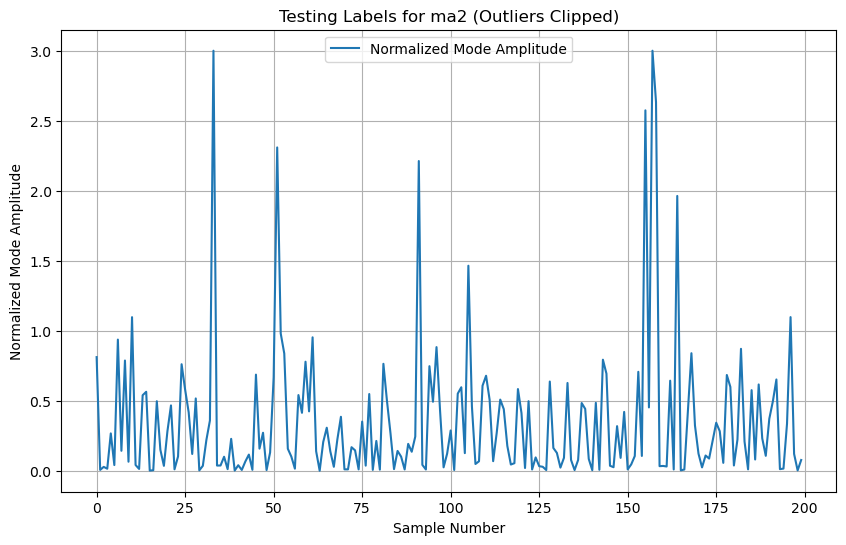

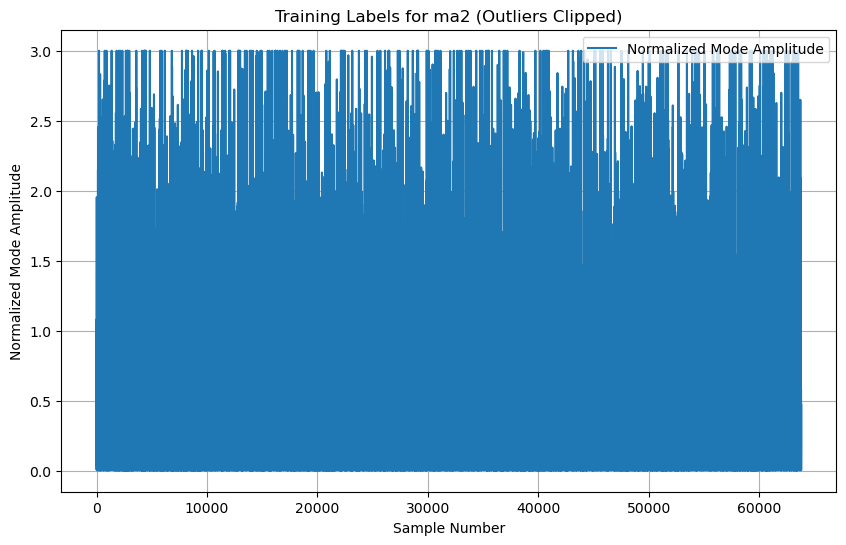

In [8]:
# Prepare data for HBT prediction model
target_data = hbt_dataType  # Using mode 2 amplitude as target
training_data = cut_training_data_2D

# Normalization factors
camera_norm = 1  # Camera data already normalized by max_pixel_value
# Compute ma_norm using 90th percentile to handle outliers
raw_target_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        raw_target_vector.append(target_data[i][j])

raw_target_vector = np.asarray(raw_target_vector, dtype=np.float32)[:, 0]
percentile_cutoff = np.percentile(np.abs(raw_target_vector), OUTLIER_CUTOFF) #99%
ma_norm = percentile_cutoff if percentile_cutoff > 0 else 1.0  # Use 99th percentile for normalization
outlier_threshold = 3 * ma_norm  # Define outliers as values > 3 * normalization factor
outliers = np.abs(raw_target_vector) > outlier_threshold
print(f"Normalization factor ({OUTLIER_CUTOFF} percentile): {ma_norm:.2f}")
print(f"Number of outliers (|value| > {outlier_threshold:.2f}): {np.sum(outliers)}")

# Clip outliers for normalization
raw_target_vector = np.clip(raw_target_vector, -outlier_threshold, outlier_threshold)

# Reshape the training data and labels, excluding RESERVED_SHOT
target_vector = []
training_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        target_vector.append(target_data[i][j])
        training_vector.append(training_data[i][j])

# Shuffle the data
random.seed(123)
zip_list = list(zip(target_vector, training_vector))
random.shuffle(zip_list)
target_vector, training_vector = zip(*zip_list)

# Convert to numpy arrays and normalize with clipping
target_vector = np.asarray(target_vector, dtype=np.float32)[:, 0]
target_vector = np.clip(target_vector, -outlier_threshold, outlier_threshold) / ma_norm
training_vector = np.asarray(training_vector, dtype=np.float32).reshape(-1, 32, 32, 1)

# Split into training and testing sets
test_size = 200
testing_inputs = training_vector[-test_size:]
testing_labels = target_vector[-test_size:]
training_vector = training_vector[:-test_size]
target_vector = target_vector[:-test_size]

# Save normalization info to a per-run file
normalization_filename = f"normalization_{notebook_type}_state_{state}.npz"
np.savez(normalization_filename,
         ma_norm=ma_norm,
         outlier_threshold=outlier_threshold,
         selected_data_type=selected_data_type)
print(f"Saved normalization info to {normalization_filename}")

print('Training shape:', training_vector.shape, 'Target shape:', target_vector.shape)
print('Testing shape:', testing_inputs.shape, 'Testing label shape:', testing_labels.shape)

# Plot testing labels
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Testing Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

# Plot training labels
plt.figure(figsize=(10, 6))
plt.plot(target_vector, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Training Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

In [9]:
import ast

# Define model architecture
num_conv2d_layers = NUM_CONV2D_LAYERS #2
num_dense_layers = NUM_DENSE_LAYERS #1

conv2d_neurons = CONV2D_NEURONS #[16, 16]
conv2d_size = CONV2D_SIZE #[(8, 8), (8, 8)]
dense_layer_neurons = DENSE_LAYER_NEURONS #[10]
max_pooling_size = MAX_POOLING_SIZE #(4, 4)
activation_func = ACTIVATION_FUNC # 'relu'
loss_func = LOSS_FUNC #'mean_squared_error'
optimizer_func = OPTIMIZER_FUNC #'adam'

# Reinterpret conv2d_size to handle various input formats
conv2d_size = [
    tuple(int(x) for x in ast.literal_eval(size) if isinstance(x, (int, float)))
    if isinstance(size, str) else tuple(int(x) for x in size)
    for size in conv2d_size
]
# Reinterpret max_pooling_size to handle various input formats
max_pooling_size = (
    tuple(int(x) for x in ast.literal_eval(max_pooling_size) if isinstance(x, (int, float)))
    if isinstance(max_pooling_size, str) else tuple(int(x) for x in max_pooling_size)
)
# Create the model
william_model = tf.keras.models.Sequential()

# Add input layer
william_model.add(tf.keras.layers.InputLayer(shape=(32, 32, 1)))

# Add Conv2D layers
for i in range(num_conv2d_layers):
    william_model.add(tf.keras.layers.Conv2D(conv2d_neurons[i], conv2d_size[i], 1, activation=activation_func))
    william_model.add(tf.keras.layers.MaxPooling2D(max_pooling_size, 1))

# Flatten the output
william_model.add(tf.keras.layers.Flatten())

# Add dense layers
for i in range(num_dense_layers):
    william_model.add(tf.keras.layers.Dense(dense_layer_neurons[i], activation=activation_func))

# Output layer
william_model.add(tf.keras.layers.Dense(1))

# Compile the model
william_model.compile(optimizer=optimizer_func, loss=loss_func)

# Display model summary
william_model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 26, 26, 64)     │         3,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 20, 20, 64)     │        65,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 18496)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │       591,904 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 660,737 (2.52 MB)

 Trainable params: 660,737 (2.52 MB)

 Non-trainable params: 0 (0.00 B)

In [10]:
# Train the model
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20)
Model = william_model
history = Model.fit(training_vector, target_vector,
                       epochs=EPOCH_NUM,
                       validation_split=VALIDATION_SPLIT,
                       verbose=1,
                       callbacks=[early_stop])

Epoch 1/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 2:53 97ms/step - loss: 0.4130

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3793 

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3523

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3316

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3151

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3028

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.2966

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.2905

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.2867

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.2829

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2797

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2763

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.2732

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.2707

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.2688

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.2674

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2662

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2651

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2638

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.2624

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2609

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2593

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2576

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2560

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2544

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2527

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2510

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2496

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2481

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2467

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2455

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2443

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.2434

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2424

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2415

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2406

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2398

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2389

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2381

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2373

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2365

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2357

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.2350

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2342

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2335

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2328

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2322

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2316

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2310

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2304

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2298

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2292

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2289

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2283

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2278

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2274

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2269

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2264

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2260

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2255

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2251

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2247

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2243

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2239

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2236

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.2232

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2228

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2224

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2221

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2217

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2214

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2210

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2207

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2205

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2202

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2199

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2196

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2193

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2190

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2186

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2183

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2180

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2177

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2174

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2171

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2168

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2165

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2162

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2159

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2156

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2153

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2151

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2148

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2145

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2143

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2140

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2138

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2135

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2133

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2130

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2128

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2125

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2123

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2120

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2118

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2115

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2112

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2110

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2107

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2105

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2102

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2100

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2098

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2095

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2093

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2091

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2088

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2086

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2084

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2082

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2080

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2078

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2076

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2074

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2073

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2071

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2069

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2067

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2065

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2063

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2061

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2059

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2058

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2056

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2054

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2052

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2051

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2049

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2047

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2045

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2044

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2042

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2040

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2039

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2037

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2036

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2034

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2032

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2031

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2029

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2028

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2026

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2025

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2023

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2022

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2020

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2019

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2017

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2016

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2014

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2013

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2012

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2010

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2009

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2008

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2006

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2005

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2004

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2003

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2002

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2001

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2000

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1998

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1997

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1996

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1995

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1994

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1993

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1991

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1990

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1989

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1988

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1987

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1986

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1985

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1984

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1983

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1981

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1980

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1979

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1978

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1977

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1976

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1975

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1975

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1974

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1973

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1972

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1971

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1970

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1969

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1968

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1967

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1966

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1965

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1964

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1963

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1962

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1961

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1961

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1960

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1959

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1958

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1957

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1956

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1956

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1955

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1954

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1953

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1952

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1952

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1951

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1950

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1950

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1949

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1948

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1948

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1947

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1946

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1945

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1945

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1944

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1943

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1943

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1942

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1941

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1941

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1940

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1939

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1939

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1938

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1938

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1937

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1936

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1936

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1935

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1934

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1934

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1933

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1933

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1932

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1931

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1931

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1930

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1930

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1929

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1928

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1928

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1927

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1927

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1926

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1925

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1925

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1924

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1924

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1923

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1922

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1922

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1921

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1921

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1920

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1920

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1919

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1919

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1918

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1918

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1917

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1917

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1916

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1916

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1915

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1915

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1914

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1914

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1913

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1913

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1912

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1911

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1911

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1911

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1910

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1910

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1909

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1909

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1908

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1908

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1908

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1907

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1907

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1906

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1906

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1905

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1905

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1904

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1904

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1903

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1903

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1902

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1901

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1901

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1900

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1900

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1899

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1899

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1898

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1898

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1897

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1897

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1896

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1896

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1895

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1895

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1894

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1894

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1893

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1893

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1892

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1892

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1892

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1891

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1891

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1890

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1890

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1889

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1889

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1888

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1888

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1887

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1887

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1886

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1886

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1885

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1885

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1884

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1884

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1883

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1883

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1882

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1882

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1881

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1881

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1881

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1880

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1880

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1879

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1879

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1878

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1878

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1877

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1877

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1876

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1876

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1876

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1875

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1875

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1874

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1874

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1873

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1873

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1872

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1872

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1871

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1871

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1871

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1870

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1870

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1869

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1869

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1868

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1868

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1867

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1867

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1867

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1866

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1866

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1865

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1865

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1864

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1864

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1863

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1863

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1863

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1862

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1862

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1861

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1861

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1860

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1860

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1860

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1859

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1859

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1858

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1858

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1857

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1857

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1857

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1856

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1856

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1855

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1855

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1855

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1854

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1854

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1853

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1853

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1852

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1852

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1852

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1851

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1851

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1850

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1850

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1849

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1849

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1849

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1848

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1848

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1847

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1847

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1847

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1846

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1846

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1845

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1845

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1844

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1844

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1844

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1843

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1843

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1842

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1842

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1842

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1841

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1841

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1840

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1840

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1840

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1839

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1839

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1838

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1838

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1838

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1837

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1837

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1836

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1836

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1836 

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1835

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1835

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1834

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1834

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1834

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1833

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1833

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1832

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1832

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1832

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1831

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1831

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1830

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1830

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1830

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1829

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1829

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1828

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1828

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1828

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1827

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1827

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1826

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1826

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1826

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1825

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1825

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1824

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1824

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1824

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1823

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1823

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1823

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1822

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1822

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1821

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1821

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1821

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1820

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1820

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1820

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1819

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1819

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1819

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1818

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1818

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1817

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1817

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1817

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1816

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1816

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1816

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1815

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1815

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1814

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1814

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1814

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1813

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1813

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1813

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1812

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1812

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1812

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1811

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1811

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1811

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1810

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1810

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1810

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1809

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1809

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1809

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1809

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1808

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1808

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1808

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1808

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1807

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1807

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1807

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1807

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1806

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1806

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1806

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1805

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1805

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1805

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1804

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1804

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1803

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1803

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1803

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1802

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1802

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1802

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1801

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1801

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1801

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1800

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1800

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1800

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1800

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1799

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1799

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1799

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1798

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1798

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1798

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1797

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1797

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1797

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1796

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1796

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1796

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1795

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1795

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1795

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1794

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1794

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1794

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1793

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1793

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1793

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1792

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1792

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1792

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1792

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1791

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1791

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1791

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1790

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1790

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1790

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1789

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1789

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1789

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1788

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1788

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1788

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1788

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1787

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1787

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1787

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1786

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1786

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1786

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1785

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1785

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1785

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1784

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.1784 - val_loss: 0.1468


Epoch 2/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.3113

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2234

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.2021

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1855

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1779

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1724

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1685

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1676

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1670

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1666

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1666

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1663

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1658

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1651

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1642

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1633

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1627

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1624

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1620

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1618

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1614

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1611

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1607

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1604

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1602

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1599

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1595

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1591

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1588

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1586

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1584

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1583

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1583

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1582

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1582

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1582

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1583

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1584

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1585

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1586

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1586

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1586

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1586

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1586

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1585

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1585

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1584

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1584

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1583

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1583

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1582

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1581

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1580

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1579

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1579

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1578

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1577

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1576

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1575

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1573

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1573

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1571

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1570

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1569

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1568

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1567

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1566

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1564

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1563

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1562

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1561

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1560

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1558

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1557

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1555

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1554

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1552

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1550

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1549

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1547

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1546

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1545

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1543

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1542

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1541

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1540

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1539

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1538

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1537

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1536

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1535

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1534

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1533

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1532

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1531

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1530

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1529

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1528

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1527

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1526

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1525

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1524

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1523

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1523

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1522

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1521

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1520

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1519

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1519

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1518

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1517

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1516

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1516

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1515

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1514

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1513

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1513

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1512

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1511

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1511

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1510

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1509

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1509

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1508

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1508

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1507

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1507

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1507

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1506

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1506

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1506

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1505

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1505

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1505

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1505

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1504

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1504

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1504

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1504

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1503

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1503

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1503

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1502

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1502

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1502

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1502

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1501

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1501

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1501

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1500

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1500

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1500

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1500

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1499

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1499

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1499

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1499

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1498

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1498

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1498

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1498

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1497

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1497

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1497

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1497

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1497

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1496

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1496

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1496

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1496

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1496

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1496

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1495

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1495

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1495

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1495

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1495

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1494

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1494

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1494

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1494

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1494

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1494

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1494

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1493

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1493

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1493

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1493

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1493

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1493

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1493

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1493

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1493

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1493

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1493

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1493

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1493

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1493

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1493

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1493

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1492

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1492

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1492

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1492

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1492

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1492

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1492

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1492

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1492

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1492

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1492

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1492

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1492

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1492

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1492

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1492

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1492

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1492

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1492

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1492

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1492

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1492

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1492

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1492

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1492

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1492

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1492

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1492

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1492

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1492

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1492

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1492

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1492

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1492

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1492

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1492

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1492

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1492

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1491

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1491

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1491

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1491

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1491

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1491

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1491

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1491

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1491

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1491

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1491

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1491

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1491

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1490

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1490

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1490

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1490

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1490

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1490

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1490

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1490

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1490

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1490

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1490

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1490

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1490

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1490

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1490

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1490

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1490

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1489

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1489

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1489

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1489

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1489

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1489

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1489

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1489

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1489

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1489

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1489

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1489

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1489

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1488

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1488

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1488

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1488

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1488

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1488

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1488

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1488

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1488

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1488

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1488

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1488

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1488

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1488

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1488

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1488

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1488

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1488

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1488

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1488

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1488

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1488

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1488

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1488

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1488

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1488

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1487

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1487

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1487

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1487

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1487

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1487

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1487

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1487

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1487

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1487

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1487

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1487

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1487

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1487

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1487

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1487

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1487

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1487

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1487

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1487

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1487

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1487

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1487

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1487

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1487

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1487

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1487

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1487

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1486

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1486

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1486

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1486

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1486

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1486

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1486

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1486

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1486

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1486

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1486

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1486

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1486

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1486

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1486

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1486

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1486

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1486

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1486

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1486

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1486

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1486

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1485

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1485

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1485

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1485

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1485

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1485

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1485

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1485

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1485

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1485

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1485

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1485

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1485

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1485

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1485

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1485

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1484

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1484

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1484

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1484

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1484

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1484

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1484

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1484

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1484

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1484

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1484

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1483

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1483

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1483

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1483

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1483

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1483

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1483

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1483

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1483

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1482

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1482

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1482

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1482

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1482

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1482

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1482

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1482

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1482

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1481

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1481

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1481

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1481

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1481

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1481

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1481

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1481

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1481

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1481

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1480

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1480

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1480

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1480

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1480

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1480

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1480

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1480

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1480

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1480

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1479

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1479

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1479

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1479

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1479

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1479

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1479

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1479

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1479

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1479

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1479

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1479

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1478

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1478

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1478

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1478

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1478

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1478

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1478

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1478

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1478

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1478

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1478

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1478

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1477

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1477

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1477

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1477

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1477

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1477

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1477

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1477

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1477

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1477

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1476

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1476

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1476

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1476

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1476

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1476

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1476

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1476

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1476

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1476

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1475

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1475

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1475 

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1475

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1475

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1475

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1475

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1475

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1475

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1475

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1475

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1475

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1475

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1474

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1474

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1474

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1474

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1474

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1474

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1474

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1474

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1474

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1474

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1474

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1473

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1473

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1473

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1473

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1473

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1473

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1473

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1473

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1473

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1473

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1472

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1472

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1472

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1472

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1472

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1472

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1472

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1472

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1472

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1471

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1471

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1471

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1471

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1471

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1471

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1471

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1471

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1471

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1470

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1470

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1470

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1470

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1470

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1470

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1470

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1470

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1469

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1469

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1469

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1469

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1469

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1469

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1469

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1469

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1469

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1468

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1468

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1468

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1468

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1468

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1468

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1468

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1468

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1468

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1467

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1467

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1467

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1467

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1467

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1467

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1467

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1467

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1467

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1466

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1466

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1466

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1466

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1466

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1466

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1466

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1466

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1466

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1465

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1465

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1465

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1465

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1465

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1465

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1465

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1465

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1464

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1464

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1464

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1464

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1464

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1464

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1464

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1464

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1463

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1463

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1463

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1463

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1463

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1463

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1463

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1463

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1463

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1462

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1462

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1462

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1462

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1462

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1462

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1462

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1462

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1461

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1461

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1461

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1461

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1461

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1461

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1461

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1461

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1460

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1460

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1460

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1460

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1460

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1460

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1460

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1460

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1460

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1459

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1459 - val_loss: 0.1338


Epoch 3/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0602

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0600

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0740

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0818

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0884

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0959

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1031

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1083

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1124

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1159

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1174

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1189

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1205

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1217

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1229

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1236

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1242

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1246

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1250

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1254

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1257

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1259

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1261

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1263

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1264

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1265

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1266

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1266

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1267

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1267

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1268

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1269

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1271

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1271

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1272

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1272

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1273

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1273

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1273

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1273

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1272

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1272

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1272

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1272

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1273

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1273

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1274

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1275

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1276

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1276

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1277

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1279

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1279

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1280

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1280

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1281

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1281

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1282

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1284

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1285

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1287

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1288

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1290

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1292

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1294

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1295

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1297

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1298

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1299

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1300

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1301

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1301

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1302

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1303

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1303

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1304

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1304

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1305

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1305

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1306

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1306

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1306

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1307

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1307

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1308

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1308

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1309

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1309

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1310

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1310

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1310

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1311

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1312

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1312

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1313

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1313

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1313

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1314

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1314

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1314

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1315

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1315

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1315

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1315

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1315

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1315

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1315

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1315

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1315

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1315

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1315

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1315

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1315

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1315

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1315

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1315

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1315

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1315

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1315

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1315

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1315

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1315

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1315

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1315

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1315

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1315

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1315

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1315

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1315

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1315

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1315

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1314

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1314

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1314

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1314

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1314

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1314

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1313

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1313

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1313

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1313

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1313

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1313

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1313

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1312

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1312

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1312

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1312

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1312

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1312

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1312

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1312

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1311

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1311

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1311

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1311

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1311

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1311

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1311

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1311

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1311

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1311

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1311

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1311

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1311

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1311

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1311

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1311

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1311

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1311

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1311

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1311

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1311

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1311

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1311

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1311

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1310

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1310

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1310

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1310

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1310

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1310

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1310

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1310

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1310

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1310

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1310

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1310

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1310

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1310

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1310

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1310

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1310

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1310

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1309

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1309

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1309

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1309

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1309

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1309

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1309

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1309

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1309

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1309

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1309

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1308

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1308

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1308

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1308

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1308

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1308

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1308

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1308

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1308

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1308

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1308

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1308

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1307

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1307

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1307

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1307

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1307

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1307

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1307

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1307

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1307

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1307

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1307

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1307

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1307

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1307

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1307

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1307

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1307

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1307

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1306

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1306

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1306

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1306

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1306

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1306

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1306

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1306

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1306

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1306

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1306

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1306

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1306

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1306

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1306

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1306

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1306

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1306

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1306

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1306

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1306

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1305

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1305

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1305

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1305

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1305

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1305

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1305

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1305

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1305

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1305

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1305

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1305

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1305

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1305

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1305

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1305

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1305

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1305

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1305

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1305

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1305

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1305

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1305

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1305

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1305

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1305

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1305

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1305

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1305

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1305

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1305

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1305

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1305

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1305

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1305

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1305

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1305

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1305

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1305

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1305

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1305

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1305

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1305

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1305

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1305

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1304

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1304

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1304

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1304

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1304

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1304

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1304

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1304

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1304

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1304

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1304

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1304

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1304

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1304

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1304

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1304

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1304

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1304

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1304

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1304

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1304

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1304

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1304

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1304

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1304

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1304

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1304

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1304

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1304

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1304

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1304

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1304

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1304

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1304

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1304

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1304

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1304

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1304

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1303

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1303

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1303

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1303

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1303

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1303

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1303

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1303

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1303

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1303

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1303

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1303

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1303

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1303

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1303

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1303

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1303

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1303

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1303

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1303

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1303

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1303

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1303

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1303

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1303

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1303

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1303

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1303

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1303

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1303

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1303

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1303

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1303

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1303

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1303

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1303

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1303

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1303

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1303

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1303

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1303

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1303

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1303

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1303

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1303

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1303

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1303

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1303

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1303

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1303

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1303

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1303

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1303

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1303

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1303

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1303

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1303

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1303

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1303

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1303

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1303

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1303

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1303

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1303

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1303

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1303

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1303

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1303

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1303

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1303

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1303

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1303

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1303

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1303

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1303

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1303

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1303

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1303

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1303

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1304

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1304

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1304

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1304

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1304

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1304

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1304

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1304

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1304

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1304

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1304

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1304

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1304

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1304

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1304

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1304

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1304

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1304

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1304

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1304

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1304

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1304

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1304

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1304

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1304

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1304

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1304

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1304

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1304

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1304

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1304

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1304

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1304

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1304

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1304

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1304

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1304

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1304

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1304

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1304

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1304

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1304

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1304

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1304

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1305

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1305

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1305

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1305

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1305

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1305

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1305

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1305

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1305

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1305

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1305

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1305

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1305

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1305

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1305 

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1305

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1305

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1305

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1305

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1305

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1305

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1305

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1305

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1305

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1305

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1305

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1305

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1305

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1305

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1305

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1305

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1305

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1305

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1305

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1305

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1305

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1305

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1305

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1306

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1306

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1306

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1306

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1306

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1306

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1306

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1306

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1306

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1306

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1306

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1306

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1306

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1306

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1306

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1306

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1306

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1306

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1306

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1306

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1306

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1306

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1306

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1306

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1307

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1307

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1307

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1307

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1307

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1307

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1307

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1307

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1307

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1307

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1307

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1307

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1307

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1307

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1307

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1307

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1307

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1307

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1307

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1307

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1307

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1307

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1307

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1307

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1308

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1308

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1308

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1308

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1308

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1308

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1308

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1308

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1308

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1308

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1308

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1308

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1308

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1308

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1308

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1308

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1308

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1308

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1308

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1308

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1308

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1308

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1308

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1308

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1308

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1308

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1308

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1308

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1308

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1308

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1308

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1308

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1308

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1308

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1308

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1308

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1308

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1308

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1308

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1308

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1308

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1308

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1309

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1309

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1309

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1309

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1309

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1309

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1309

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1309

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1309

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1309

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1309

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1309

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1309

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1309

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1309

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1309

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1309

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1309

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1309

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1309

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1309

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1309

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1309

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1309

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1309

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1309

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1309

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1309

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1309

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1309

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1309

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1309

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1309

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1309 - val_loss: 0.1279


Epoch 4/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1372

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1295

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1215

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1178

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1167

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1155

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1156

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1163

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1174

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1197

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1218

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1233

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1247

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1255

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1262

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1270

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1276

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1281

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1286

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1289

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1290

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1293

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1297

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1301

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1304

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1306

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1309

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1313

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1315

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1317

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1319

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1321

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1323

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1325

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1326

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1328

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1329

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1330

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1330

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1331

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1332

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1332

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1332

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1332

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1332

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1331

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1331

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1331

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1331

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1331

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1331

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1331

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1332

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1332

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1332

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1332

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1332

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1332

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1332

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1332

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1331

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1330

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1330

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1329

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1329

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1328

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1327

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1326

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1325

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1324

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1323

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1322

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1321

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1320

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1319

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1318

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1317

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1316

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1315

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1314

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1314

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1313

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1313

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1312

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1312

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1311

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1311

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1310

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1310

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1310

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1309

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1309

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1308

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1308

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1308

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1307

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1307

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1307

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1306

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1306

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1305

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1305

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1304

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1304

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1303

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1303

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1302

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1302

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1301

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1301

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1301

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1300

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1300

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1299

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1299

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1299

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1298

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1298

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1298

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1297

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1297

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1296

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1296

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1296

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1295

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1295

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1294

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1294

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1294

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1294

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1293

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1293

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1293

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1293

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1292

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1292

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1292

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1292

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1292

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1292

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1291

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1291

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1291

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1291

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1291

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1291

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1291

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1290

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1290

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1290

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1290

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1290

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1290

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1290

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1290

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1290

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1289

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1289

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1289

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1289

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1289

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1289

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1289

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1289

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1289

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1289

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1289

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1289

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1289

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1289

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1289

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1289

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1289

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1289

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1289

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1289

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1289

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1289

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1289

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1289

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1289

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1289

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1288

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1288

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1288

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1288

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1288

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1288

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1288

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1288

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1288

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1288

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1288

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1288

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1288

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1289

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1289

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1289

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1289

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1289

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1289

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1289

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1289

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1289

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1289

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1289

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1289

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1289

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1289

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1289

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1289

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1289

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1289

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1289

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1289

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1289

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1289

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1289

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1289

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1289

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1289

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1289

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1289

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1289

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1289

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1289

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1289

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1289

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1289

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1289

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1289

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1289

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1289

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1289

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1289

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1289

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1289

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1289

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1289

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1289

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1289

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1289

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1290

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1290

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1290

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1290

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1290

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1290

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1290

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1290

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1290

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1290

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1290

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1290

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1290

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1290

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1290

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1290

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1290

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1290

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1290

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1290

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1290

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1290

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1290

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1290

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1290

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1290

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1290

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1290

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1290

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1290

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1291

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1291

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1291

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1291

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1291

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1291

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1291

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1291

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1291

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1291

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1291

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1291

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1291

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1291

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1291

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1291

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1291

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1291

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1291

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1291

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1291

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1291

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1291

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1291

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1291

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1291

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1291

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1291

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1291

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1291

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1291

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1290

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1290

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1290

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1290

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1290

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1290

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1290

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1290

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1290

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1290

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1290

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1290

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1290

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1290

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1290

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1290

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1290

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1290

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1290

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1290

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1290

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1290

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1290

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1290

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1290

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1290

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1290

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1290

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1290

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1290

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1290

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1290

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1289

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1289

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1289

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1289

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1289

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1289

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1289

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1289

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1289

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1289

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1289

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1289

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1289

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1289

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1289

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1289

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1289

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1289

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1289

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1289

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1289

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1289

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1289

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1289

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1289

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1288

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1288

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1288

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1288

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1288

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1288

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1288

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1288

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1288

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1288

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1288

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1288

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1288

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1288

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1288

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1288

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1288

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1288

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1288

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1288

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1288

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1288

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1288

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1288

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1288

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1288

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1288

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1288

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1288

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1288

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1288

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1288

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1288

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1288

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1288

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1288

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1288

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1288

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1287

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1287

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1287

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1287

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1287

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1287

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1287

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1287

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1287

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1287

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1287

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1287

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1287

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1287

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1287

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1287

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1287

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1287

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1287

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1287

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1287

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1287

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1287

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1287

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1287

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1287

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1287

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1287

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1287

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1287

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1286

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1286

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1286

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1286

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1286

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1286

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1286

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1286

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1286

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1286

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1286

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1286

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1286

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1286

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1286

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1286

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1286

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1286

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1286

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1286

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1286

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1286

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1286

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1286

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1286

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1286

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1286

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1286

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1286

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1286

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1286

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1286

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1285

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1285

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1285

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1285

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1285

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1285 

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1285

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1285

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1285

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1285

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1285

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1285

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1285

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1285

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1285

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1285

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1285

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1285

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1285

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1285

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1285

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1285

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1285

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1285

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1285

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1285

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1285

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1285

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1285

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1285

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1285

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1285

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1285

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1285

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1285

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1285

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1285

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1285

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1285

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1285

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1285

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1285

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1285

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1285

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1285

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1285

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1285

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1285

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1285

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1284

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1284

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1284

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1284

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1284

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1284

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1284

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1284

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1284

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1284

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1284

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1284

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1284

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1283

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1283

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1283

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1283

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1283

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1283

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1283

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1283

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1283

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1283

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1283

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1283

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1283

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1283

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1283

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1283

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1283

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1283

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1283

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1283

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1283

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1283

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1283

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1283

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1283

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1283

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1283

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1283

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1283

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1283

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1283

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1283

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1283

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1283

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1283

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1283

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1283

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1283

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1283

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1283

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1283

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1283

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1283

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1283

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1283

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1283

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1283

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1283

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1283

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1283

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1283

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1283

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1283

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1282

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1282

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1282

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1282

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1282

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1282

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1282

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1282

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1282

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1282

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1282

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1282

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1282

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1282

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1282

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1282

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1282

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1282

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.1282 - val_loss: 0.1232


Epoch 5/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.3388

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.2177

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1769

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1601

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1506

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1452

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1419

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1387

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1368

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1349

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1340

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1329

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1320

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1312

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1305

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1297

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1292

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1291

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1291

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1291

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1290

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1288

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1286

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1285

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1283

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1283

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1284

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1285

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1286

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1287

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1288

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1288

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1288

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1288

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1288

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1287

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1286

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1286

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1285

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1284

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1282

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1281

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1280

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1279

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1278

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1277

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1277

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1277

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1276

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1276

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1276

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1275

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1274

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1274

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1273

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1272

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1272

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1271

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1271

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1270

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1270

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1269

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1269

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1269

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1269

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1268

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1268

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1268

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1267

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1267

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1267

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1266

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1266

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1265

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1265

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1264

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1264

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1264

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1263

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1263

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1263

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1263

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1263

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1263

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1262

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1262

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1262

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1262

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1261

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1261

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1261

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1260

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1260

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1260

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1260

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1259

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1259

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1258

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1258

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1257

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1257

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1257

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1256

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1256

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1255

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1255

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1254

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1254

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1253

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1252

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1252

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1251

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1250

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1250

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1249

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1249

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1248

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1248

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1247

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1246

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1246

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1245

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1245

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1244

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1244

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1243

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1242

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1242

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1241

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1241

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1240

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1240

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1240

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1239

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1239

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1238

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1238

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1238

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1237

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1237

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1236

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1236

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1236

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1236

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1235

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1235

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1235

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1235

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1234

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1234

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1234

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1234

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1234

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1233

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1233

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1233

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1233

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1233

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1233

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1233

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1233

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1232

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1232

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1232

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1232

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1232

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1232

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1232

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1231

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1231

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1231

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1231

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1231

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1231

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1231

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1231

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1231

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1230

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1230

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1230

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1230

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1230

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1230

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1230

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1230

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1229

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1229

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1229

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1229

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1229

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1229

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1229

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1229

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1229

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1229

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1228

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1228

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1228

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1228

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1228

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1228

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1228

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1228

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1227

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1227

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1227

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1227

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1227

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1227

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1227

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1227

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1226

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1226

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1226

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1226

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1226

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1226

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1226

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1226

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1226

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1226

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1226

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1225

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1225

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1225

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1225

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1225

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1225

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1225

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1225

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1225

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1225

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1225

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1225

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1225

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1225

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1225

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1224

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1224

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1224

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1224

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1224

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1224

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1224

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1224

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1224

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1224

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1224

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1224

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1224

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1224

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1224

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1224

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1224

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1224

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1224

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1224

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1224

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1224

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1224

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1224

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1224

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1224

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1224

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1224

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1224

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1224

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1224

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1224

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1224

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1224

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1224

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1224

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1224

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1224

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1224

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1224

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1224

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1224

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1224

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1224

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1224

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1224

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1224

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1224

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1224

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1224

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1224

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1224

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1224

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1224

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1224

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1224

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1224

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1224

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1224

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1224

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1224

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1224

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1224

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1224

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1224

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1224

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1224

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1224

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1224

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1224

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1224

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1224

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1224

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1224

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1224

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1224

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1224

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1225

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1225

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1225

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1225

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1225

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1225

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1225

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1225

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1225

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1225

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1225

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1225

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1225

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1225

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1225

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1225

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1225

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1225

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1225

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1225

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1225

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1225

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1225

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1225

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1225

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1225

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1225

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1225

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1225

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1225

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1225

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1225

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1225

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1225

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1225

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1225

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1225

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1225

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1225

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1225

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1225

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1225

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1225

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1225

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1225

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1225

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1225

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1225

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1225

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1225

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1225

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1225

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1225

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1225

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1225

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1225

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1225

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1225

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1225

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1225

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1225

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1225

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1225

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1225

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1225

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1225

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1225

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1225

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1225

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1225

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1225

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1225

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1225

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1225

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1225

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1226

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1226

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1226

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1226

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1226

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1226

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1226

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1226

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1226

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1226

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1226

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1226

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1226

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1226

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1226

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1226

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1226

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1226

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1226

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1226

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1226

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1226

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1226

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1226

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1226

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1226

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1226

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1226

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1226

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1226

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1226

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1226

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1226

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1226

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1226

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1226

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1226

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1226

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1226

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1226

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1226

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1226

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1226

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1225

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1225

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1225

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1225

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1225

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1225

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1225

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1225

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1225

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1225

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1225

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1225

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1225

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1225

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1225

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1225

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1225

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1225

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1225

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1225

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1225

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1225

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1225

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1225

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1225

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1225

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1225

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1225

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1225

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1225

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1225

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1225

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1225 

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1225

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1225

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1225

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1225

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1225

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1225

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1225

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1225

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1225

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1225

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1225

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1225

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1225

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1225

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1225

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1225

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1225

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1225

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1225

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1225

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1225

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1225

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1225

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1225

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1225

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1226

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1226

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1226

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1226

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1226

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1226

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1226

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1226

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1226

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1226

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1226

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1226

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1226

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1226

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1226

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1226

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1226

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1226

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1226

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1226

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1226

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1226

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1226

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1226

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1226

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1226

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1226

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1226

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1226

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1226

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1226

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1226

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1226

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1226

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1226

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1226

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1226

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1226

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1226

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1226

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1226

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1226

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1226

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1226

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1226

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1226

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1226

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1226

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1226

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1226

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1226

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1226

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1226

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1226

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1226

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1226

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1226

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1226

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1226

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1226

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1226

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1226

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1226

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1226

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1226

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1226

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1226

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1226

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1226

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1226

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1226

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1226

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1226

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1226

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1226

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1226

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1226

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1226

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1226

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1226

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1226

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1226

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1226

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1226

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1226

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1226

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1226

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1226

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1226

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1227

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1227

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1227

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1227

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1227

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1227

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1227

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1227

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1227

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1227

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1227

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1227

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1227

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1227

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1227

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1227

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1227

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1227

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1227

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1227

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1227

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1227

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1227

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1227

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.1227 - val_loss: 0.1208


Epoch 6/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 28ms/step - loss: 0.0662

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0839

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0908

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0898

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0912

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0930

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0942

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0951

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0975

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0993

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1005

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1015

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1028

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1045

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1057

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1065

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1071

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1076

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1080

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1083

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1086

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1089

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1092

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1095

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1098

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1102

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1106

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1109

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1112

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1116

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1120

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1123

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1125

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1129

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1131

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1133

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1135

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1138

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1141

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1144

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1146

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1149

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1153

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1157

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1161

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1164

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1168

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1171

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1175

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1178

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1181

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1184

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1186

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1189

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1191

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1192

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1194

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1196

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1197

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1198

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1199

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1200

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1201

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1202

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1203

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1203

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1204

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1205

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1205

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1206

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1206

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1206

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1207

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1207

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1208

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1209

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1209

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1210

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1211

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1211

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1212

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1213

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1213

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1214

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1214

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1215

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1215

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1216

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1216

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1217

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1217

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1218

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1218

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1218

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1219

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1219

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1219

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1219

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1219

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1219

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1220

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1220

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1220

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1220

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1220

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1220

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1221

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1221

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1221

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1221

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1222

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1222

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1222

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1222

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1223

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1223

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1223

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1224

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1224

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1224

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1224

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1225

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1225

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1225

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1225

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1225

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1225

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1225

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1225

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1225

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1225

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1225

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1225

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1225

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1225

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1225

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1225

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1226

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1226

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1226

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1226

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1226

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1226

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1226

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1226

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1226

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1226

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1226

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1226

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1226

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1226

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1226

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1226

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1226

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1226

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1227

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1227

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1227

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1227

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1227

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1227

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1227

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1228

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1228

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1228

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1228

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1228

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1228

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1229

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1229

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1229

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1229

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1229

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1229

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1229

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1229

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1230

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1230

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1230

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1230

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1230

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1230

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1230

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1230

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1230

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1230

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1230

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1231

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1231

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1231

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1231

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1231

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1231

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1231

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1231

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1231

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1231

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1231

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1231

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1232

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1232

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1232

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1232

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1232

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1232

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1232

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1232

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1232

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1232

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1232

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1232

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1232

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1232

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1232

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1232

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1232

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1232

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1232

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1232

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1232

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1232

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1232

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1232

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1232

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1232

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1232

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1232

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1232

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1232

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1232

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1232

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1232

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1232

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1232

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1232

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1232

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1232

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1232

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1232

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1232

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1231

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1231

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1231

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1231

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1231

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1231

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1231

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1231

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1231

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1231

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1231

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1231

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1231

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1231

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1231

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1231

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1231

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1231

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1231

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1230

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1230

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1230

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1230

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1230

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1230

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1230

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1230

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1230

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1230

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1230

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1230

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1230

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1230

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1230

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1230

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1230

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1230

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1230

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1230

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1230

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1230

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1230

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1230

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1230

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1230

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1230

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1230

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1230

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1230

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1230

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1230

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1230

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1230

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1230

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1230

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1230

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1230

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1230

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1230

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1230

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1230

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1230

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1230

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1230

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1230

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1230

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1230

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1230

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1230

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1230

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1230

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1230

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1230

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1229

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1229

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1229

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1229

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1229

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1229

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1229

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1229

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1229

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1229

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1229

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1229

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1229

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1229

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1229

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1229

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1229

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1229

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1229

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1229

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1229

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1229

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1229

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1229

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1229

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1229

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1229

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1229

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1229

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1229

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1229

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1229

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1229

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1229

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1229

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1229

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1229

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1229

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1229

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1228

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1228

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1228

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1228

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1228

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1228

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1228

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1228

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1228

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1228

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1228

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1228

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1228

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1228

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1228

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1228

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1228

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1228

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1228

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1228

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1228

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1228

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1228

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1228

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1228

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1228

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1228

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1228

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1228

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1228

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1227

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1227

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1227

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1227

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1227

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1227

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1227

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1227

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1227

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1227

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1227

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1227

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1227

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1227

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1227

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1227

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1227

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1227

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1227

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1227

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1227

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1227

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1227

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1227

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1227

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1227

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1227

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1226

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1226

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1226

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1226

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1226

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1226

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1226

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1226

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1226

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1226

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1226

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1226

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1226

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1226

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1226

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1226

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1226

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1226

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1226

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1226

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1225

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1225

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1225

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1225

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1225

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1225

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1225

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1225

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1225

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1225

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1225

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1225

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1225

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1225

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1225

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1225

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1225

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1225

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1225

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1225

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1225

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1225

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1225

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1224

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1224

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1224

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1224

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1224

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1224

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1224

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1224

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1224

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1224

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1224

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1224

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1224

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1224

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1224

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1224

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1224

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1224

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1224

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1224

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1224

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1224

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1224

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1223

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1223

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1223

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1223

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1223

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1223

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1223

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1223

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1223

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1223

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1223

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1223

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1223

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1223

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1223

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1223

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1223

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1223

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1222

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1222

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1222

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1222

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1222

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1222

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1222

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1222 

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1222

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1222

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1222

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1222

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1222

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1222

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1222

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1222

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1222

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1222

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1222

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1222

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1221

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1221

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1221

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1221

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1221

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1221

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1221

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1221

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1221

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1221

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1221

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1221

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1221

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1221

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1221

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1221

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1221

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1221

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1221

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1220

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1220

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1220

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1220

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1220

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1220

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1220

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1220

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1220

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1220

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1220

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1220

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1220

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1220

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1220

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1220

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1220

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1220

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1220

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1220

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1219

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1219

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1219

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1219

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1219

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1219

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1219

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1219

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1219

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1219

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1219

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1219

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1219

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1219

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1219

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1219

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1219

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1219

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1219

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1219

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1219

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1219

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1219

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1219

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1218

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1218

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1218

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1218

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1218

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1218

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1218

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1218

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1218

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1218

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1218

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1218

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1218

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1218

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1218

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1218

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1218

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1218

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1218

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1218

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1218

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1218

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1218

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1218

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1217

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1217

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1217

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1217

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1217

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1217

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1217

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1217

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1217

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1217

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1217

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1217

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1217

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1217

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1217

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1217

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1217

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1217

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1217

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1217

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1217

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1217

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1217

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1217

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1217

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1217

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1217

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1216

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1216

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1216

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1216

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1216

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1216

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1216

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1216

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1216

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1216

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1216

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1216

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1216

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1216

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1216

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1216

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1216 - val_loss: 0.1212


Epoch 7/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0961

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0897

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0973

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1045

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1065

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1105

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1127

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1135

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1143

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1147

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1155

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1161

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1167

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1171

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1172

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1174

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1175

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1176

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1176

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1178

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1179

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1179

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1181

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1186

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1189

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1191

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1193

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1195

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1196

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1197

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1197

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1197

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1197

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1196

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1196

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1195

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1194

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1193

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1193

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1193

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1193

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1193

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1194

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1194

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1194

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1195

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1195

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1196

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1197

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1197

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1198

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1199

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1200

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1201

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1202

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1203

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1203

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1204

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1204

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1205

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1205

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1206

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1206

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1206

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1207

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1207

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1207

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1208

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1208

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1208

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1208

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1208

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1209

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1209

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1209

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1210

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1210

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1210

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1210

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1210

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1211

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1211

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1211

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1211

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1210

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1210

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1210

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1210

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1210

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1210

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1210

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1210

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1210

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1210

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1210

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1210

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1210

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1210

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1210

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1210

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1210

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1210

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1210

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1210

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1210

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1210

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1210

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1210

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1210

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1210

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1210

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1210

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1210

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1210

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1210

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1210

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1210

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1210

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1210

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1210

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1210

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1210

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1210

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1210

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1210

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1210

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1210

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1210

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1210

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1210

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1210

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1210

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1210

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1210

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1211

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1211

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1211

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1211

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1211

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1211

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1211

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1211

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1211

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1211

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1211

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1211

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1211

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1211

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1211

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1211

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1211

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1211

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1211

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1211

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1211

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1211

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1211

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1211

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1211

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1211

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1212

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1212

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1212

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1212

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1212

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1212

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1212

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1212

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1212

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1212

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1212

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1212

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1212

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1212

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1212

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1212

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1212

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1212

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1212

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1213

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1213

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1213

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1213

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1213

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1213

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1213

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1213

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1213

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1213

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1213

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1213

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1213

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1213

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1213

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1213

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1213

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1213

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1213

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1213

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1213

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1213

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1213

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1213

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1213

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1213

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1213

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1213

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1213

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1212

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1212

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1212

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1212

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1212

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1212

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1212

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1212

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1212

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1212

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1212

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1212

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1212

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1212

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1212

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1212

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1211

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1211

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1211

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1211

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1211

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1211

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1211

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1211

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1211

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1211

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1211

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1211

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1211

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1211

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1211

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1211

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1210

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1210

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1210

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1210

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1210

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1210

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1210

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1210

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1210

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1210

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1210

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1210

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1210

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1210

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1209

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1209

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1209

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1209

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1209

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1209

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1209

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1209

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1209

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1209

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1209

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1208

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1208

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1208

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1208

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1208

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1208

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1208

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1208

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1208

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1208

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1208

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1207

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1207

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1207

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1207

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1207

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1207

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1207

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1207

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1207

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1206

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1206

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1206

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1206

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1206

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1206

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1206

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1206

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1206

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1206

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1205

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1205

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1205

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1205

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1205

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1205

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1205

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1205

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1205

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1205

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1205

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1205

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1205

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1204

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1204

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1204

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1204

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1204

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1204

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1204

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1204

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1203

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1203

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1203

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1203

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1203

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1203

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1203

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1203

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1202

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1202

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1202

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1202

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1202

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1202

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1202

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1202

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1202

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1201

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1201

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1201

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1201

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1201

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1201

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1201

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1201

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1201

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1201

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1201

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1200

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1200

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1200

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1200

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1200

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1200

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1200

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1200

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1200

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1200

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1200

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1200

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1199

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1199

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1199

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1199

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1199

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1199

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1199

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1199

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1199

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1199

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1199

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1198

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1198

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1198

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1198

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1198

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1198

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1198

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1198

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1198

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1198

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1197

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1197

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1197

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1197

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1197

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1197

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1197

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1197

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1197

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1197

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1197

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1197

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1196

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1196

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1196

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1196

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1196

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1196

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1196

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1196

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1196

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1196

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1196

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1196

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1195

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1195

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1195

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1195

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1195

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1195

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1195

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1195

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1195

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1195

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1195

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1195

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1194

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1194

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1194

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1194

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1194

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1194

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1194

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1194

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1194

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1194

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1194

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1194

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1194

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1194

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1194

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1193

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1193

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1193

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1193

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1193

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1193

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1193

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1193

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1193

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1193

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1193

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1193

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1193

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1193

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1192

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1192

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1192

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1192

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1192

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1192

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1192

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1192

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1192

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1192

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1192

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1192

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1192

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1192

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1192

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1192

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1192

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1192

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1191

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1191

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1191

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1191

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1191

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1191

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1191

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1191

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1191

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1191

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1191

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1191 

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1191

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1191

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1191

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1191

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1191

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1191

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1191

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1191

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1191

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1190

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1190

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1190

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1190

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1190

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1190

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1190

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1190

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1190

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1190

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1190

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1190

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1190

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1190

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1190

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1190

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1190

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1190

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1190

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1190

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1190

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1190

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1189

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1189

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1189

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1189

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1189

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1189

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1189

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1189

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1189

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1189

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1189

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1189

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1189

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1189

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1189

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1189

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1189

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1189

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1189

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1188

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1188

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1188

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1188

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1188

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1188

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1188

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1188

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1188

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1188

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1188

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1188

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1188

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1188

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1188

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1188

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1188

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1188

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1188

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1188

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1188

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1188

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1187

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1187

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1187

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1187

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1187

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1187

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1187

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1187

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1187

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1187

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1187

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1187

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1187

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1187

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1187

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1187

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1187

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1187

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1187

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1187

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1187

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1187

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1187

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1187

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1187

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1187

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1187

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1187

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1187

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1187

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1187

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1187

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1187

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1186

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1186

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1186

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1186

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1186

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1186

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1186

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1186

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1186

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1186

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1186

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1186

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1186

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1186

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1186

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1186

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1186

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1186

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1186

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1186

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1186

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1186

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1186

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1186

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1186

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1186

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1186

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1186

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1186

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1186

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1186

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1186

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1186

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1186

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1186

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1186

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1186

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1186

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1186

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1186

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1186

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1186

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1186

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1186

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1186

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1186

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.1186 - val_loss: 0.1156


Epoch 8/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2390

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2852

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.2896

   8/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.2766

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.2685

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.2582

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.2440

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.2351

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.2298

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.2250

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.2200

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.2154

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.2114

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.2077

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.2027

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1982

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1944

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1910

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1879

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1852

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1829

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1806

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1785

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1767

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1749

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1733

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1717

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1702

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1691

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1679

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1668

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1657

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1647

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1641

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1634

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1631

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1625

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1618

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1609

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1600

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1591

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1582

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1574

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1565

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1557

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1548

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1540

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1533

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1525

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1518

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1511

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1504

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1498

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1492

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1486

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1480

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1474

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1469

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1464

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1460

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1456

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1453

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1449

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1446

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1443

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1440

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1437

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1433

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1428

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1425

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1421

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1416

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1412

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1408

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1405

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1402

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1398

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1395

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1392

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1389

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1387

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1385

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1383

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1380

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1377

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1375

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1372

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1369

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1367

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1364

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1362

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1360

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1357

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1355

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1353

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1351

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1349

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1347

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1345

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1342

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1340

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1338

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1337

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1335

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1333

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1331

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1330

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1328

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1326

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1325

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1323

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1321

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1320

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1319

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1317

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1316

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1315

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1313

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1312

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1311

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1309

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1308

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1307

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1305

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1304

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1303

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1302

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1301

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1300

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1298

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1297

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1296

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1295

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1294

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1293

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1293

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1292

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1291

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1290

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1289

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1289

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1288

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1287

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1286

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1286

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1285

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1284

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1283

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1283

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1282

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1281

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1281

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1280

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1279

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1279

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1278

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1278

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1277

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1276

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1276

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1275

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1274

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1274

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1273

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1272

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1272

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1271

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1271

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1270

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1269

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1269

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1268

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1267

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1267

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1266

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1266

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1265

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1265

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1264

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1263

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1263

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1262

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1262

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1261

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1261

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1261

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1260

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1260

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1259

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1259

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1258

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1258

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1257

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1257

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1257

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1256

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1256

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1255

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1255

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1254

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1254

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1254

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1253

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1253

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1252

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1252

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1251

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1251

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1250

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1250

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1250

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1249

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1249

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1248

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1248

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1247

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1247

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1246

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1246

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1246

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1245

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1245

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1244

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1244

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1243

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1243

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1243

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1242

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1242

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1241

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1241

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1241

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1240

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1240

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1240

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1239

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1239

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1239

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1238

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1238

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1238

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1238

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1237

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1237

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1237

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1236

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1236

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1236

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1235

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1235

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1235

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1235

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1234

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1234

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1234

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1234

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1233

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1233

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1233

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1233

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1233

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1232

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1232

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1232

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1232

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1231

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1231

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1231

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1231

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1231

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1230

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1230

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1230

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1230

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1230

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1230

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1229

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1229

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1229

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1229

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1229

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1228

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1228

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1228

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1228

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1228

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1228

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1228

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1227

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1227

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1227

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1227

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1227

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1227

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1227

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1226

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1226

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1226

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1226

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1226

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1226

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1225

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1225

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1225

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1225

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1225

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1225

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1224

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1224

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1224

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1224

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1224

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1224

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1223

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1223

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1223

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1223

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1223

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1223

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1223

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1223

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1222

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1222

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1222

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1222

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1222

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1222

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1221

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1221

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1221

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1221

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1221

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1221

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1221

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1220

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1220

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1220

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1220

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1220

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1220

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1220

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1219

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1219

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1219

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1219

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1219

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1219

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1218

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1218

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1218

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1218

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1218

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1218

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1218

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1218

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1218

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1217

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1217

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1217

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1217

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1217

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1217

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1217

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1216

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1216

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1216

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1216

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1216

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1216

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1216

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1216

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1216

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1216

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1216

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1216

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1215

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1215

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1215

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1215

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1215

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1215

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1215

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1215

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1215

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1215

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1215

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1214

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1214

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1214

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1214

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1214

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1214

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1214

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1214

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1213

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1213

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1213

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1213

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1213

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1213

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1213

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1213

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1213

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1212

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1212

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1212

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1212

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1212

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1212

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1212

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1212

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1212

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1211

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1211

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1211

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1211

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1211

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1211

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1211

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1211

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1211

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1211

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1211

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1210

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1210

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1210

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1210

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1210

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1210

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1210

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1210

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1210

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1210

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1210

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1210

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1210

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1210

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1209

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1209

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1209

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1209

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1209

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1209

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1209

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1209

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1209

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1209

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1209

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1209

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1208

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1208

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1208

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1208

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1208

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1208

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1208

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1208

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1208

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1208

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1208

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1207

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1207

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1207

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1207

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1207

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1207

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1207

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1207

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1207

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1207

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1206

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1206

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1206

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1206

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1206

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1206

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1206

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1206

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1206

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1206

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1206

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1205 

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1205

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1205

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1205

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1205

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1205

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1205

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1205

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1205

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1205

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1205

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1204

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1204

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1204

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1204

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1204

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1204

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1204

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1204

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1204

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1203

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1203

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1203

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1203

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1203

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1203

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1203

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1203

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1203

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1203

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1203

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1202

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1202

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1202

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1202

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1202

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1202

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1202

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1202

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1202

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1202

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1201

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1201

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1201

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1201

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1201

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1201

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1201

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1201

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1201

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1201

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1201

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1200

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1200

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1200

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1200

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1200

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1200

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1200

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1200

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1200

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1200

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1200

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1200

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1199

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1199

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1199

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1199

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1199

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1199

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1199

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1199

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1199

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1199

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1199

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1198

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1198

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1198

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1198

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1198

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1198

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1198

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1198

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1198

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1198

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1198

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1198

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1197

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1197

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1197

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1197

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1197

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1197

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1197

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1197

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1197

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1197

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1197

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1197

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1197

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1196

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1196

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1196

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1196

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1196

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1196

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1196

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1196

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1196

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1196

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1196

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1196

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1196

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1196

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1196

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1195

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1195

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1195

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1195

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1195

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1195

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1195

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1195

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1195

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1195

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1195

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1195

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1195

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1195

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1195

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1194

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1194

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1194

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1194

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1194

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1194

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1194

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1194

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1194

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1194

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1194

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1194

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1194

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1194

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1194

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1194

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1194

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.1194 - val_loss: 0.1131


Epoch 9/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1021

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1293

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1240

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1183

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1171

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1154

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1130

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1111

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1092

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1076

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1064

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1044

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1032

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1028

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1021

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1016

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1012

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1009

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1007

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1004

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1002

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1000

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0999

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0999

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0998

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0997

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0997

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0996

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0995

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0995

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0995

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0994

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0994

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0994

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0994

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0994

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0994

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0994

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0994

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0995

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0995

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0996

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0997

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0998

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0999

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1000

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1001

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1002

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1003

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1003

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1004

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1005

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1006

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1007

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1008

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1008

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1009

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1010

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1011

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1012

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1013

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1015

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1016

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1017

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1018

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1020

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1021

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1022

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1024

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1025

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1026

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1027

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1028

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1029

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1030

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1032

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1033

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1034

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1035

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1036

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1038

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1039

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1040

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1041

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1041

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1042

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1043

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1044

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1045

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1046

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1047

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1048

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1049

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1050

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1051

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1051

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1052

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1053

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1054

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1054

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1055

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1056

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1057

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1057

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1058

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1059

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1059

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1060

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1060

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1061

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1062

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1062

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1063

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1063

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1063

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1064

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1064

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1065

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1065

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1066

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1066

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1067

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1067

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1068

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1069

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1069

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1070

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1070

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1071

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1072

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1072

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1073

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1073

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1074

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1075

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1075

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1076

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1077

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1077

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1078

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1079

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1079

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1080

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1081

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1081

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1082

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1082

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1083

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1084

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1084

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1085

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1085

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1086

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1086

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1087

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1087

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1088

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1088

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1089

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1089

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1090

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1090

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1091

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1091

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1092

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1092

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1093

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1093

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1094

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1094

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1095

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1096

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1096

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1097

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1097

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1098

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1098

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1099

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1099

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1099

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1100

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1100

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1101

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1101

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1101

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1102

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1102

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1102

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1103

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1103

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1103

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1104

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1104

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1104

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1105

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1105

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1105

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1106

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1106

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1106

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1107

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1107

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1107

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1108

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1108

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1108

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1109

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1109

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1109

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1110

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1110

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1110

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1111

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1111

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1111

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1112

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1112

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1112

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1113

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1113

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1113

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1114

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1114

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1114

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1114

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1114

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1115

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1115

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1115

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1115

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1115

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1116

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1116

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1116

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1116

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1116

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1117

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1117

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1117

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1118

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1118

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1118

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1118

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1119

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1119

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1119

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1120

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1120

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1120

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1120

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1121

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1121

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1121

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1121

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1121

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1122

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1122

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1122

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1122

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1122

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1123

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1123

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1123

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1123

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1123

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1123

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1124

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1124

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1124

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1124

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1124

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1124

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1124

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1124

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1125

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1125

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1125

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1125

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1125

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1125

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1125

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1126

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1126

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1126

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1126

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1126

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1126

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1126

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1127

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1127

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1127

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1127

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1127

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1127

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1127

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1127

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1127

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1128

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1128

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1128

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1128

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1128

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1128

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1128

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1128

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1129

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1129

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1129

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1129

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1129

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1129

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1129

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1129

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1130

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1130

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1130

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1130

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1130

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1130

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1130

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1130

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1131

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1131

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1131

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1131

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1131

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1131

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1131

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1131

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1131

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1131

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1131

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1132

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1132

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1132

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1132

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1132

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1132

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1132

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1132

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1132

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1132

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1132

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1133

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1133

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1133

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1133

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1133

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1133

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1133

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1133

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1133

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1133

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1133

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1133

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1133

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1134

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1134

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1134

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1134

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1134

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1134

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1134

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1134

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1134

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1134

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1134

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1134

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1134

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1135

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1135

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1135

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1135

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1135

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1135

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1135

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1135

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1135

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1135

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1135

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1135

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1135

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1135

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1135

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1136

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1136

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1136

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1136

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1136

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1136

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1136

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1136

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1136

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1136

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1136

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1136

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1137

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1137

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1137

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1137

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1137

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1137

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1137

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1137

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1137

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1137

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1137

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1137

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1137

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1137

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1138

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1138

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1138

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1138

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1138

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1138

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1138

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1138

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1138

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1138

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1138

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1138

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1138

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1138

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1139

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1139

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1139

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1139

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1139

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1139

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1139

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1139

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1139

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1139

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1139

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1139

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1139

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1139

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1140

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1140

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1140

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1140

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1140

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1140

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1140

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1140

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1140

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1140

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1140

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1140

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1140

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1140

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1140

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1140

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1140

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1140

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1141

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1141

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1141

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1141

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1141

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1141

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1141 

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1141

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1141

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1141

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1141

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1141

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1141

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1141

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1141

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1141

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1141

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1141

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1141

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1141

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1141

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1141

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1141

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1141

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1142

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1142

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1142

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1142

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1142

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1142

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1142

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1142

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1142

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1142

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1142

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1142

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1142

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1142

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1142

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1142

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1142

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1142

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1142

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1142

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1142

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1142

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1142

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1142

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1142

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1142

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1142

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1142

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1142

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1142

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1142

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1142

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1142

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1142

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1142

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1143

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1143

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1143

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1143

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1143

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1143

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1143

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1143

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1143

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1143

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1143

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1143

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1143

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1143

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1143

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1143

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1143

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1143

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1143

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1143

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1143

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1143

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1143

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1143

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1143

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1143

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1143

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1143

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1143

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1143

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1143

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1143

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1143

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1143

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1143

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1143

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1143

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1143

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1143

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1143

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1143

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1143

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1143

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1143

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1143

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1144

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1144

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1144

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1144

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1144

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1144

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1144

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1144

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1144

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1144

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1144

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1144

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1144

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1144

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1144

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1144

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1144

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1144

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1144

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1144

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1144

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1144

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1144

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1144

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1144

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1144

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1144

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1144

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1144

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1144

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1144

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1144

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1144

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1144

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1144

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1144

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1144

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1144

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1144

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1144

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1144

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1144

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1144

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1144

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1144

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1144

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1144

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1144

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1144

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1144

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1144

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1144

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1144

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1144

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1144

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1144

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1144

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1144

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1144 - val_loss: 0.1177


Epoch 10/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0544

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0431

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0521

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0585

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0641

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0670

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0703

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0726

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0741

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0761

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0778

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0791

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0803

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0815

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0826

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0831

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0837

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0841

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0844

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0849

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0855

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0861

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0867

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0872

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0875

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0879

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0883

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0888

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0891

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0895

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0898

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0901

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0904

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0907

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0910

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0913

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0916

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0918

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0920

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0922

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0923

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0926

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0928

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0930

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0932

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0934

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0936

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0938

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0941

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0944

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0947

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0950

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0952

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0955

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0957

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0960

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0962

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0964

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0966

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0968

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0970

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0972

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0974

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0976

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0978

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0979

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0981

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0983

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0984

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0986

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0987

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0989

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0990

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0992

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0993

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0994

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0995

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0996

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0997

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0998

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1000

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1001

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1001

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1003

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1003

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1004

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1005

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1006

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1007

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1008

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1010

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1011

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1012

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1013

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1014

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1015

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1016

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1017

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1018

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1019

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1020

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1021

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1022

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1023

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1023

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1024

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1025

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1026

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1026

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1027

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1027

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1028

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1028

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1029

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1030

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1030

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1031

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1032

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1032

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1033

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1033

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1034

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1034

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1035

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1035

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1036

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1037

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1037

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1038

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1038

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1039

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1039

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1040

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1040

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1041

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1041

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1042

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1043

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1043

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1043

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1044

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1044

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1045

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1045

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1045

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1046

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1046

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1046

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1047

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1047

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1047

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1048

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1048

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1049

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1050

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1050

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1050

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1051

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1051

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1051

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1051

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1052

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1052

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1052

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1053

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1053

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1053

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1053

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1054

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1054

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1054

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1054

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1055

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1055

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1055

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1055

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1056

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1056

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1056

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1056

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1057

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1057

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1057

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1057

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1058

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1058

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1058

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1058

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1059

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1059

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1059

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1059

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1060

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1060

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1060

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1060

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1060

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1060

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1061

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1061

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1061

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1061

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1061

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1061

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1061

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1062

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1062

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1062

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1062

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1062

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1062

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1062

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1062

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1063

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1063

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1063

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1063

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1063

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1063

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1063

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1063

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1063

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1063

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1063

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1064

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1064

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1064

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1064

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1064

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1064

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1064

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1064

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1064

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1064

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1064

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1064

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1064

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1065

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1065

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1065

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1065

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1065

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1065

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1065

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1065

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1065

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1065

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1065

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1065

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1065

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1065

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1066

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1066

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1066

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1066

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1066

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1066

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1067

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1067

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1067

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1067

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1067

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1067

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1067

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1068

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1069

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1069

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1069

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1069

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1069

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1069

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1069

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1069

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1070

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1070

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1070

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1070

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1070

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1070

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1070

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1070

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1071

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1071

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1071

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1071

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1071

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1071

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1071

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1071

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1072

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1072

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1072

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1072

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1072

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1072

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1072

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1072

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1072

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1072

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1073

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1073

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1073

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1073

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1073

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1073

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1073

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1073

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1073

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1074

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1074

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1074

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1074

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1075

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1075

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1075

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1075

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1075

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1075

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1075

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1075

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1075

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1076

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1076

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1076

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1076

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1076

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1076

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1076

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1076

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1076

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1077

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1077

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1077

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1077

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1077

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1077

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1077

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1077

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1078

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1078

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1078

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1078

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1078

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1078

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1078

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1079

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1079

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1079

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1079

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1079

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1079

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1079

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1080

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1080

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1080

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1080

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1080

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1080

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1080

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1081

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1081

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1081

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1081

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1081

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1081

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1081

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1082

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1082

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1082

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1082

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1082

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1082

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1082

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1083

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1083

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1083

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1083

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1083

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1083

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1083

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1083

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1083

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1083

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1084

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1084

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1084

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1084

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1084

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1084

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1084

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1084

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1085

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1085

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1085

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1085

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1085

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1085

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1086

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1086

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1086

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1086

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1086

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1086

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1086

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1086

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1087

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1087

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1087

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1087

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1087

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1087

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1087

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1088

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1088

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1088

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1088

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1088

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1088

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1088

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1088

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1089

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1089

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1089

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1089

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1089

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1089

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1089

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1089

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1090

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1090

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1090

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1090

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1090

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1090

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1090

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1090

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1091

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1091

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1091

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1091

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1091

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1091

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1091

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1091

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1092

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1092

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1092

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1092 

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1092

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1092

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1092

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1092

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1094

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1094

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1094

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1094

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1094

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1094

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1094

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1094

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1095

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1095

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1095

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1095

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1095

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1095

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1095

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1095

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1096

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1096

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1096

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1096

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1096

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1096

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1096

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1096

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1096

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1097

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1097

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1097

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1097

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1097

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1097

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1097

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1097

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1097

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1097

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1098

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1098

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1098

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1098

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1098

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1098

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1098

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1098

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1098

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1098

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1098

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1099

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1099

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1099

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1099

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1099

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1099

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1099

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1099

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1099

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1099

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1099

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1099

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1100

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1100

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1100

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1100

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1100

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1100

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1100

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1100

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1100

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1100

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1100

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1100

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1100

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1101

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1101

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1101

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1101

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1101

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1101

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1101

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1101

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1101

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1101

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1101

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1101

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1101

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1102

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1102

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1102

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1102

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1102

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1102

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1102

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1102

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1102

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1102

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1102

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1102

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1102

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1102

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1103

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1103

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1103

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1103

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1103

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1103

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1103

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1103

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1103

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1103

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1103

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1103

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1103

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1103

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1103

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1103

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1104

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1104

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1104

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1104

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1104

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1104

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1104

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1104

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1104

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1104

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1104

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1104

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1104

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1104

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1104

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1104

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1104

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1105

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1105

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1105

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1105

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1105

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1105

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1105

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1105

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1105 - val_loss: 0.1120


Epoch 11/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0601

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0822

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0969

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0973

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0985

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0985

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0971

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0953

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0935

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0923

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0912

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0900

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0891

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0882

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0875

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0868

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0862

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0858

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0858

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0863

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0868

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0874

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0880

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0888

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0896

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0902

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0908

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0913

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0918

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0923

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0927

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0930

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0934

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0938

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0941

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0944

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0946

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0948

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0950

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0952

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0953

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0955

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0957

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0960

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0962

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0964

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0967

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0969

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0970

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0971

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0972

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0973

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0975

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0976

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0977

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0979

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0981

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0982

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0984

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0986

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0987

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0989

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0990

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0991

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0992

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0993

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0994

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0995

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0997

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0998

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0999

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1000

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1001

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1002

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1003

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1005

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1006

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1007

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1008

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1009

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1009

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1010

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1011

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1012

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1013

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1013

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1014

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1015

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1015

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1016

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1016

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1017

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1018

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1018

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1019

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1019

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1020

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1020

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1021

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1021

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1022

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1023

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1023

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1024

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1024

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1025

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1025

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1026

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1027

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1027

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1027

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1028

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1028

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1029

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1029

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1030

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1030

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1031

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1031

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1032

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1032

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1032

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1033

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1033

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1034

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1034

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1034

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1035

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1035

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1035

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1036

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1036

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1037

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1037

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1037

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1038

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1038

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1039

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1039

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1039

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1040

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1040

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1041

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1041

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1042

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1042

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1043

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1044

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1044

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1045

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1045

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1046

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1046

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1047

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1047

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1048

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1048

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1050

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1050

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1050

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1051

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1051

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1052

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1052

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1052

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1053

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1053

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1053

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1054

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1054

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1054

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1055

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1055

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1056

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1056

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1056

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1057

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1057

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1057

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1058

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1058

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1058

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1058

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1059

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1059

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1059

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1060

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1060

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1060

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1060

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1061

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1061

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1061

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1062

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1062

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1062

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1062

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1063

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1063

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1063

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1063

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1064

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1064

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1064

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1066

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1066

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1066

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1066

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1067

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1067

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1067

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1067

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1068

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1068

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1068

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1068

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1069

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1069

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1069

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1069

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1070

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1070

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1070

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1070

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1071

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1071

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1071

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1072

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1072

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1072

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1072

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1073

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1073

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1073

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1073

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1074

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1074

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1074

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1075

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1075

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1075

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1075

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1076

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1076

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1076

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1076

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1076

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1077

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1077

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1077

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1077

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1078

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1078

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1078

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1078

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1078

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1079

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1079

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1079

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1079

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1080

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1080

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1080

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1080

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1080

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1080

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1081

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1081

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1081

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1081

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1081

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1081

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1082

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1082

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1082

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1082

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1082

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1082

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1083

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1083

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1083

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1083

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1083

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1083

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1083

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1084

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1084

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1084

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1084

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1084

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1084

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1084

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1084

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1084

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1085

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1085

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1085

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1085

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1085

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1085

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1085

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1085

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1085

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1085

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1085

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1085

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1085

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1086

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1086

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1086

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1086

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1086

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1086

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1086

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1086

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1086

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1086

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1086

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1086

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1086

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1086

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1086

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1086

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1086

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1086

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1086

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1086

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1086

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1087

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1087

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1087

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1087

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1087

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1087

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1087

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1087

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1087

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1087

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1087

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1087

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1087

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1087

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1087

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1087

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1087

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1087

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1087

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1087

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1087

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1087

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1087

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1087

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1088

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1088

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1088

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1089

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1089

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1089

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1089

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1089

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1089

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1089

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1089

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1089

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1089

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1089

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1089

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1089

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1089

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1089

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1089

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1089

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1089

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1091

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1091

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1091

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1091

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1091

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1091

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1091

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1091

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1091

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1091

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1091

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1091

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1091

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1091

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1091

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1091

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1091

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1091

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1091

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1091

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1091

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1092

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1092

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1092

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1092

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1092

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1092

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1092

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1092

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1092

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1092

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1092

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1092

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1092

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1092

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1092

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1092 

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1092

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1093

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1093

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1093

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1093

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1093

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1093

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1094

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1094

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1094

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1094

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1094

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1094

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1094

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1094

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1094

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1094

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1094

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1094

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1094

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1094

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1094

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1094

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1094

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1094

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1095

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1095

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1095

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1095

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1095

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1095

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1095

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1095

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1095

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1095

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1095

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1095

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1095

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1095

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1095

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1095

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1095

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1096

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1096

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1096

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1096

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1096

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1096

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1096

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1096

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1096

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1096

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1096

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1096

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1096

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1096

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1096

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1096

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1096

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1096

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1096

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1096

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1097

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1097

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1097

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1097

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1097

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1097

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1097

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1097

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1097

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1097

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1097

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1097

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1097

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1097

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1097

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1097

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1097

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1097

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1097

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1097

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1097

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1097

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1098

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1098

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1098

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1098

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1098

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1098

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1098

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1098

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1098

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1098

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1098

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1098

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1098

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1098

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1098

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1098

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1098

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1098

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1098

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1098

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1098

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1098

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1098

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1098

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1098

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1098

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1099

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1099

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1099

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1099

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1099

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1099

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1099

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1099

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1099

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1099

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1099

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1099

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1100

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1100

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1100

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1100

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1100 - val_loss: 0.1102


Epoch 12/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:36 54ms/step - loss: 0.0984

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1227 

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1314

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1324

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1341

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1324

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1308

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1309

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1305

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1294

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1282

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1268

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1261

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1254

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1244

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1235

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1226

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1218

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1213

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1207

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1206

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1205

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1203

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1202

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1200

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1200

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1199

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1199

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1198

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1197

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1196

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1195

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1194

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1192

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1190

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1188

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1187

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1186

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1185

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1184

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1184

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1184

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1184

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1183

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1183

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1183

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1182

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1182

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1182

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1181

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1181

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1180

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1180

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1179

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1179

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1178

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1178

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1177

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1177

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1177

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1177

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1177

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1177

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1177

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1177

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1177

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1177

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1177

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1177

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1177

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1177

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1177

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1177

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1177

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1177

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1177

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1177

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1177

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1177

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1177

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1177

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1177

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1177

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1177

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1177

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1176

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1176

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1176

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1176

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1176

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1176

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1176

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1176

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1176

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1176

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1176

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1176

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1176

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1176

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1176

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1175

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1175

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1175

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1175

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1175

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1175

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1175

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1175

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1175

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1175

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1175

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1175

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1175

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1175

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1174

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1174

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1174

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1174

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1174

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1174

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1174

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1174

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1174

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1174

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1174

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1173

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1173

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1173

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1173

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1173

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1172

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1172

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1172

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1172

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1171

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1171

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1171

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1171

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1170

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1170

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1170

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1169

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1169

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1169

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1168

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1168

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1168

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1167

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1167

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1167

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1166

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1166

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1166

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1165

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1165

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1165

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1164

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1164

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1164

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1163

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1163

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1163

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1162

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1162

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1162

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1161

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1161

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1161

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1160

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1160

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1160

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1160

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1159

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1159

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1159

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1158

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1158

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1158

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1158

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1157

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1157

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1157

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1156

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1156

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1156

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1156

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1155

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1155

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1155

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1154

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1154

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1154

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1153

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1153

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1153

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1152

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1152

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1152

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1151

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1151

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1151

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1150

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1150

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1150

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1150

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1149

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1149

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1149

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1148

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1148

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1148

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1147

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1147

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1147

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1147

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1146

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1146

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1146

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1146

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1145

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1145

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1145

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1145

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1145

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1144

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1144

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1144

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1144

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1144

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1143

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1143

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1143

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1143

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1143

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1142

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1142

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1142

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1142

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1142

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1142

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1141

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1141

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1141

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1141

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1141

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1141

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1141

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1140

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1140

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1140

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1140

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1140

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1140

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1140

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1140

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1140

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1139

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1139

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1139

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1139

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1139

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1139

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1139

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1139

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1139

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1139

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1138

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1138

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1138

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1138

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1138

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1138

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1138

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1138

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1138

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1138

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1138

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1138

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1138

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1138

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1137

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1137

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1137

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1137

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1137

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1137

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1137

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1137

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1137

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1137

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1137

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1137

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1137

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1137

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1136

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1136

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1136

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1136

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1136

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1136

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1136

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1136

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1136

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1136

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1136

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1136

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1136

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1136

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1136

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1136

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1136

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1136

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1136

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1135

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1135

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1135

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1135

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1135

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1135

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1135

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1135

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1135

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1135

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1135

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1135

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1135

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1135

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1135

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1135

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1135

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1135

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1135

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1135

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1135

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1134

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1134

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1134

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1134

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1134

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1134

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1134

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1134

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1134

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1134

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1134

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1134

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1134

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1134

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1134

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1134

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1134

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1134

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1134

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1134

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1134

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1133

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1133

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1133

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1133

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1133

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1133

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1133

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1133

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1133

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1133

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1133

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1133

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1133

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1133

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1133

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1133

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1133

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1133

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1133

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1133

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1133

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1133

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1133

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1133

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1133

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1133

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1133

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1133

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1133

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1133

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1133

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1133

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1133

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1133

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1133

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1133

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1133

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1133

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1133

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1133

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1133

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1133

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1133

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1133

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1133

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1133

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1133

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1133

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1133

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1133

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1133

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1133

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1133

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1133

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1133

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1133

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1133

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1133

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1133

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1133

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1133

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1132

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1132

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1132

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1132

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1132

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1132

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1132

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1132

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1132

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1132

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1132

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1132

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1132

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1132

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1132

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1132

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1132

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1132

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1132

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1132

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1132

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1132

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1132

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1132

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1132

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1132

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1132

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1132

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1132

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1132

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1132

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1132

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1132

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1132

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1132

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1132

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1132

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1132

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1132

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1132

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1132

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1132 

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1132

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1132

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1132

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1132

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1132

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1132

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1132

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1132

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1132

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1132

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1132

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1132

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1132

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1132

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1132

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1132

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1132

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1132

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1132

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1132

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1132

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1132

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1132

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1132

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1132

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1132

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1132

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1132

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1132

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1132

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1132

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1132

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1132

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1132

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1132

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1132

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1132

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1132

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1132

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1132

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1132

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1132

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1132

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1132

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1132

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1132

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1132

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1132

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1132

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1132

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1132

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1132

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1132

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1132

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1132

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1132

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1132

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1132

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1132

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1132

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1132

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1132

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1132

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1132

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1132

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1132

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1132

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1132

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1132

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1132

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1132

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1132

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1132

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1132

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1132

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1132

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1132

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1132

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1132

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1132

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1132

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1132

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1132

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1132

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1132

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1132

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1132

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1132

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1132

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1132

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1132

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1132

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1132

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1132

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1132

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1132

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1132

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1132

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1131

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1131

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1131

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1131

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1131

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1131

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1131

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1131

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1131

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1131

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1131

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1131

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1131

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1131

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1131

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1131

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1131

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1131

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1131

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1131

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1131

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1131

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1131

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1131

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1131

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1131

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1131

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1131

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1131

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1131

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1131

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1131

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1131

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1131

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1131

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1131

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1131

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1131

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1131

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1131

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1131

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1131

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1131

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1131

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.1130 - val_loss: 0.1125


Epoch 13/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.2863

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1980

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1666

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1477

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1352

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1273

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1228

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1197

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1171

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1150

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1130

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1115

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1101

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1089

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1078

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1067

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1060

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1058

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1056

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1054

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1052

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1050

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1050

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1050

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1049

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1049

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1049

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1048

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1047

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1047

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1046

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1046

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1045

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1045

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1044

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1043

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1041

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1040

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1039

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1039

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1039

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1039

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1039

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1040

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1040

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1041

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1041

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1041

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1041

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1041

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1041

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1041

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1041

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1042

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1042

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1042

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1043

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1043

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1044

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1044

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1044

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1045

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1045

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1045

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1045

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1046

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1046

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1046

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1046

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1047

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1047

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1048

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1048

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1049

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1050

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1050

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1051

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1052

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1053

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1053

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1054

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1055

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1055

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1056

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1056

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1057

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1057

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1058

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1058

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1058

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1059

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1059

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1059

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1060

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1060

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1060

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1060

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1061

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1061

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1061

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1062

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1062

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1062

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1063

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1063

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1063

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1064

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1064

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1064

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1065

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1065

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1065

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1066

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1066

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1066

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1066

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1066

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1067

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1067

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1067

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1067

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1068

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1068

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1068

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1068

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1068

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1068

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1068

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1068

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1068

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1069

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1069

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1069

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1069

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1069

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1069

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1069

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1069

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1069

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1069

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1069

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1069

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1069

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1069

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1069

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1069

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1069

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1069

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1069

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1069

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1069

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1069

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1069

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1069

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1069

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1069

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1069

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1069

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1069

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1069

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1068

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1068

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1068

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1068

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1068

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1068

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1068

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1068

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1068

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1068

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1068

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1068

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1068

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1068

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1068

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1068

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1067

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1067

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1067

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1067

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1067

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1067

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1067

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1067

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1067

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1066

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1066

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1066

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1066

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1066

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1066

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1066

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1066

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1066

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1066

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1066

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1066

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1066

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1065

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1065

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1065

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1064

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1064

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1064

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1064

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1064

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1064

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1063

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1063

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1063

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1063

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1063

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1063

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1063

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1063

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1063

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1063

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1063

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1063

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1063

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1063

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1063

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1063

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1063

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1063

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1063

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1063

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1063

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1063

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1063

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1063

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1063

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1063

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1063

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1063

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1063

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1063

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1063

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1063

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1063

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1063

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1063

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1063

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1063

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1063

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1063

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1063

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1063

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1063

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1063

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1063

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1063

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1063

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1063

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1063

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1063

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1063

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1063

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1063

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1063

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1063

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1063

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1063

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1063

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1063

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1063

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1063

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1063

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1063

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1063

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1063

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1063

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1063

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1063

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1063

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1063

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1063

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1063

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1063

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1064

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1064

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1064

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1064

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1064

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1064

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1064

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1064

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1064

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1064

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1064

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1064

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1064

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1065

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1065

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1065

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1065

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1065

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1065

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1065

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1065

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1065

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1065

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1065

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1065

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1067

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1067

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1067

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1067

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1067

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1067

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1067

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1067

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1067

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1067

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1067

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1067

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1068

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1068

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1068

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1068

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1068

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1068

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1068

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1068

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1068

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1068

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1068

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1069

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1069

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1069

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1069

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1069

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1069

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1069

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1069

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1069

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1069

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1069

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1069

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1069

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1070

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1070

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1070

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1070

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1070

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1070

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1070

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1070

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1070

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1070

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1070

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1070

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1070

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1071

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1071

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1071

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1071

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1071

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1071

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1071

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1071

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1071

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1071

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1071

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1071

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1071

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1071

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1072

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1072

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1072

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1072

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1072

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1072

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1072

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1072

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1072

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1072

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1072

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1072

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1072

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1072

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1072

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1073

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1073

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1073

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1073

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1073

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1073

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1073

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1073

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1073

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1073

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1073

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1073

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1073

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1074

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1074

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1074

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1074

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1075

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1075

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1075

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1075

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1075

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1075

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1075

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1075

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1075

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1075

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1075

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1075 

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1075

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1076

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1076

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1076

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1076

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1076

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1076

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1076

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1076

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1076

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1076

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1076

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1076

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1076

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1076

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1077

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1077

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1077

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1078

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1078

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1078

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1078

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1078

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1078

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1078

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1078

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1078

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1078

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1078

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1078

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1078

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1078

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1078

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1078

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1078

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1078

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1078

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1079

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1079

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1079

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1079

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1079

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1079

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1079

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1079

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1079

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1079

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1079

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1079

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1079

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1079

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1079

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1079

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1079

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1079

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1079

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1079

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1079

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1079

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1079

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1079

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1079

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1079

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1079

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1080

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1080

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1080

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1080

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1080

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1080

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1080

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1080

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1080

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1080

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1080

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1080

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1080

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1080

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1080

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1080

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1080

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1081

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1082

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1082 - val_loss: 0.1083


Epoch 14/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0213

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0796

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0808

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0888

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0971

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1030

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1075

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1103

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1119

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1128

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1133

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1135

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1138

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1143

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1150

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1154

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1156

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1159

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1162

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1164

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1165

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1166

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1166

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1166

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1166

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1164

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1163

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1162

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1162

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1160

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1159

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1158

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1157

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1156

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1155

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1154

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1153

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1151

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1149

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1148

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1146

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1145

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1144

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1144

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1144

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1144

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1144

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1143

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1143

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1142

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1142

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1141

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1141

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1141

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1140

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1140

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1139

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1138

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1138

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1137

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1136

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1136

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1135

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1135

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1134

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1133

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1133

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1132

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1132

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1131

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1131

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1130

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1129

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1129

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1128

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1128

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1127

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1126

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1126

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1125

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1125

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1124

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1124

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1123

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1123

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1122

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1122

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1121

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1121

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1121

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1121

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1120

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1120

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1120

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1119

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1119

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1119

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1118

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1118

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1118

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1117

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1117

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1117

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1116

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1116

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1116

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1115

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1115

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1115

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1115

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1115

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1115

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1115

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1115

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1114

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1114

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1114

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1114

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1114

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1114

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1114

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1114

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1113

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1113

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1113

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1113

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1113

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1113

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1113

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1113

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1113

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1112

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1112

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1112

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1112

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1112

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1112

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1112

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1112

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1112

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1112

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1112

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1112

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1112

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1112

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1112

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1112

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1112

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1112

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1112

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1112

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1112

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1112

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1112

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1111

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1111

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1111

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1111

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1111

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1111

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1111

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1111

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1111

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1111

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1111

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1111

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1111

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1111

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1111

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1111

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1111

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1111

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1112

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1112

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1112

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1112

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1112

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1112

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1112

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1112

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1112

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1112

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1112

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1112

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1112

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1111

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1111

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1111

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1111

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1111

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1111

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1112

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1112

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1112

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1112

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1112

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1112

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1112

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1112

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1112

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1112

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1112

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1112

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1112

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1112

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1112

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1112

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1112

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1112

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1112

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1112

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1112

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1112

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1112

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1112

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1112

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1113

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1113

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1113

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1113

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1113

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1113

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1113

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1113

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1113

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1113

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1113

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1113

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1113

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1113

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1113

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1113

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1113

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1113

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1113

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1113

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1114

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1114

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1114

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1114

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1114

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1114

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1114

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1113

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1113

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1113

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1113

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1113

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1113

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1113

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1113

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1113

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1113

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1114

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1114

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1114

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1114

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1114

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1114

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1114

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1114

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1114

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1114

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1114

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1114

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1114

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1114

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1114

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1114

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1114

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1114

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1114

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1114

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1114

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1114

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1114

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1114

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1114

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1114

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1114

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1114

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1114

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1114

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1114

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1114

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1114

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1114

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1114

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1114

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1114

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1114

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1114

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1114

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1114

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1114

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1114

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1114

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1114

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1114

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1114

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1114

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1113

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1113

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1113

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1113

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1113

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1113

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1113

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1113

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1113

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1113

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1113

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1113

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1113

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1113

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1113

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1113

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1113

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1113

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1113

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1113

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1113

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1113

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1113

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1113

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1113

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1113

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1113

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1113

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1113

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1113

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1113

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1113

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1113

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1112

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1112

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1112

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1112

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1112

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1112

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1112

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1112

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1112

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1112

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1112

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1112

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1112

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1112

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1112

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1112

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1112

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1112

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1112

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1112

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1112

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1112

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1112

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1112

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1112

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1111

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1111

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1111

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1111

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1111

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1111

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1111

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1111

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1111

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1111

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1111

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1111

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1111

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1111

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1111

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1111

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1111

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1111

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1111

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1111

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1111

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1111

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1111

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1111

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1111

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1111

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1111

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1111

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1111

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1111

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1111

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1110

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1110

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1110

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1110

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1110

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1110

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1110

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1110

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1110

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1110

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1110

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1110

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1110

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1110

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1110

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1110

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1110

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1110

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1110

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1110

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1110

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1110

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1110

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1110

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1110

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1110

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1110

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1110

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1110

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1110

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1110

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1110

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1110

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1110

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1110 

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1110

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1110

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1110

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1110

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1110

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1110

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1110

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1110

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1110

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1110

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1110

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1110

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1110

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1110

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1110

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1110

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1110

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1110

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1110

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1110

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1110

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1110

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1110

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1110

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1110

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1110

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1110

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1110

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1110

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1110

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1110

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1110

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1110

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1110

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1110

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1110

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1110

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1110

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1110

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1110

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1110

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1110

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1110

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1110

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1110

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1110

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1110

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1110

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1110

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1110

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1110

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1110

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1110

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1110

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1110

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1110

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1110

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1110

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1110

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1110

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1110

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1110

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1110

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1110

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1110

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1109

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1109

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1109

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1109

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1109

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1109

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1109

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1109

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1109

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1109

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1109

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1109

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1109

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1109

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1109

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1109

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1109

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1109

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1109

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1109

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1109

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1109

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1109

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1109

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1109

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1109

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1109

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1109

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1109

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1109

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1109

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1109

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1109

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1109

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1109

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1109

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1109

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1109

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1109

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1109

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1109

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1109

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1109

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1109

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1109

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1109

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1109

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1109

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1109

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1109

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1109

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1109

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1109

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1109

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1109

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1108

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1108

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1108

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1108

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1108

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1108

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1108

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1108

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1108

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1108

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1108

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1108

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1108

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1108

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1108

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1108

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1108

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1108

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1108

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1108

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1108

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1108

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1108

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1108

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1108

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1108

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1108

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1108

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1108

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1108

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1108

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1108

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1108

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1108 - val_loss: 0.1099


Epoch 15/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2201

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1550

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1281

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1127

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1037

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0984

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0962

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0959

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0959

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0958

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0960

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0962

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0962

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0964

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0965

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0970

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0975

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0980

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0987

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0993

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0997

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1000

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1003

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1007

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1009

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1011

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1012

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1014

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1016

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1017

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1019

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1020

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1022

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1023

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1024

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1025

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1026

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1027

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1028

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1028

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1029

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1029

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1030

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1030

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1031

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1031

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1031

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1032

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1032

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1033

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1033

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1033

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1034

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1034

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1034

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1034

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1035

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1035

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1035

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1035

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1036

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1036

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1036

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1037

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1037

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1037

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1038

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1038

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1039

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1039

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1040

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1040

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1040

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1040

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1040

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1040

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1041

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1041

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1041

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1041

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1042

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1042

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1042

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1042

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1042

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1042

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1042

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1042

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1042

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1042

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1042

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1042

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1042

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1043

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1043

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1043

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1043

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1043

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1044

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1044

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1044

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1044

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1044

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1045

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1045

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1045

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1045

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1045

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1046

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1046

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1046

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1046

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1046

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1046

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1046

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1047

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1047

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1047

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1047

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1047

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1047

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1047

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1047

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1047

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1047

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1047

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1047

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1047

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1047

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1047

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1047

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1048

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1048

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1048

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1048

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1048

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1048

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1048

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1048

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1048

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1048

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1048

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1048

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1048

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1048

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1048

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1048

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1048

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1048

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1048

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1048

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1048

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1048

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1048

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1048

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1048

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1048

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1048

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1048

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1048

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1048

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1048

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1048

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1048

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1049

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1049

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1049

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1049

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1049

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1049

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1049

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1049

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1049

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1049

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1049

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1049

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1049

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1049

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1049

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1049

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1049

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1049

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1049

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1049

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1049

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1049

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1049

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1049

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1049

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1049

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1049

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1049

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1049

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1051

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1051

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1051

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1051

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1051

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1051

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1051

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1051

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1051

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1051

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1051

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1051

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1051

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1051

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1051

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1051

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1051

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1051

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1051

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1051

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1051

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1051

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1051

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1051

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1051

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1051

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1051

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1051

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1051

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1051

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1051

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1051

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1051

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1051

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1051

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1051

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1051

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1051

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1051

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1051

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1051

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1051

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1051

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1051

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1051

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1051

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1051

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1051

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1051

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1051

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1052

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1052

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1052

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1052

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1052

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1052

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1052

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1052

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1052

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1052

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1052

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1052

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1052

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1052

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1052

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1052

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1052

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1052

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1052

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1052

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1052

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1052

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1052

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1052

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1052

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1052

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1052

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1052

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1052

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1052

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1052

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1052

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1052

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1052

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1052

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1052

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1052

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1052

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1052

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1052

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1052

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1052

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1052

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1052

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1052

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1052

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1052

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1052

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1052

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1052

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1052

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1052

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1052

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1052

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1052

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1052

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1052

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1052

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1052

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1052

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1052

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1052

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1052

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1052

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1052

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1052

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1051

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1051

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1051

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1051

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1051

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1051

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1051

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1051

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1051

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1051

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1052

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1052

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1052

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1052

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1052

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1052

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1052

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1052

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1052

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1052

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1052

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1052

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1052

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1052

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1052

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1052

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1052

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1052

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1052

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1052

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1052

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1052

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1052

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1052

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1052

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1052

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1052

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1052

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1052

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1052

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1052

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1052

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1052

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1052

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1052

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1052

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1052

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1052

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1052

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1052

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1052

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1052

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1052

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1052

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1052

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1052

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1052

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1053

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1053

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1053

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1053

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1053

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1053

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1053

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1053

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1053

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1053

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1053

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1053

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1053

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1053

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1053

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1053

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1053

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1053

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1053

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1053

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1053

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1053

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1053

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1054

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1054

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1054

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1054

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1054

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1054

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1054

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1054

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1055

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1055

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1055

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1055

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1056 

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1056

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1056

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1056

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1056

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1057

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1057

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1057

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1057

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1057

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1057

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1057

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1057

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1057

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1057

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1057

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1057

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1058

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1058

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1058

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1058

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1058

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1058

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1058

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1058

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1058

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1058

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1058

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1058

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1058

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1058

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1058

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1058

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1058

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1058

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1058

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1058

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1058

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1058

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1059

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1059

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1059

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1059

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1059

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1059

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1059

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1059

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1059

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1059

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1059

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1059

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1059

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1059

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1059

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1059

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1059

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1059

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1059

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1059

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1059

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1059

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1059

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1059

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1059

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1059

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1059

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1060

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1060

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1060

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1060

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1060

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1060

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1060

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1060

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1060

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1060

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1060

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1060

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1060

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1060

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1060

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1060

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1060

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1060

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1060

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1060

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1060

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1060

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1060

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1060

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1061

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1061

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1061

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1061

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1061

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1061

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1061

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1061

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1061

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1061

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1061

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1061

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1061

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1061

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1061

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1061

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1061

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1061

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1061

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1061

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1061

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1061

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1062

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1062

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1062

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1062

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1062

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1062

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1062

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1062

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1062

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1062

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1062

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1062

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1062

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1062

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1062

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1062

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1062

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1062

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1062

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1062

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1062

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1062

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1062

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1062

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1062

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1062

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1063

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1063

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1063

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1063

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.1063 - val_loss: 0.1250


Epoch 16/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1883

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1500

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1297

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1222

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1193

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1169

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1164

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1166

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1174

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1186

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1196

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1206

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1208

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1207

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1205

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1203

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1204

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1203

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1202

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1202

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1203

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1203

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1202

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1201

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1199

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1198

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1197

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1196

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1195

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1195

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1194

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1193

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1191

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1189

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1186

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1184

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1181

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1178

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1176

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1175

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1174

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1173

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1172

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1171

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1170

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1170

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1169

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1169

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1168

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1168

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1167

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1166

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1166

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1165

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1165

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1164

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1164

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1163

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1163

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1163

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1163

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1162

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1162

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1162

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1162

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1162

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1162

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1162

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1162

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1162

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1162

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1162

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1162

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1162

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1162

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1162

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1162

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1162

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1161

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1161

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1160

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1160

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1159

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1159

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1158

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1158

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1157

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1157

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1156

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1156

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1155

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1155

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1154

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1154

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1153

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1153

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1152

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1151

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1151

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1150

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1150

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1149

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1149

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1148

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1148

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1147

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1147

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1146

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1146

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1145

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1144

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1144

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1143

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1143

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1143

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1142

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1142

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1141

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1141

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1141

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1140

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1140

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1140

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1139

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1139

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1139

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1138

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1138

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1138

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1138

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1137

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1137

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1137

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1137

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1136

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1136

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1136

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1136

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1135

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1135

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1135

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1135

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1134

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1134

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1134

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1134

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1133

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1133

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1133

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1133

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1132

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1132

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1132

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1132

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1131

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1131

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1131

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1131

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1130

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1130

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1130

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1130

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1129

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1129

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1129

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1128

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1128

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1128

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1128

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1127

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1127

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1127

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1127

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1126

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1126

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1126

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1126

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1125

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1125

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1125

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1125

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1125

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1124

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1124

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1124

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1124

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1124

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1123

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1123

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1123

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1123

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1123

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1123

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1123

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1123

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1122

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1122

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1122

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1122

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1122

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1122

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1122

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1122

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1121

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1121

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1121

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1121

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1121

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1121

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1121

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1120

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1120

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1120

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1120

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1120

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1120

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1120

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1120

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1119

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1119

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1119

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1119

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1119

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1119

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1119

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1119

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1118

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1118

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1118

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1118

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1118

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1118

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1118

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1117

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1117

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1117

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1117

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1117

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1117

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1117

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1117

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1116

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1116

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1116

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1116

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1116

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1116

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1116

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1116

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1116

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1116

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1116

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1116

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1115

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1115

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1115

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1115

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1115

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1115

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1115

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1115

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1115

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1115

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1115

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1115

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1114

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1114

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1114

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1113

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1113

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1113

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1113

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1113

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1113

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1113

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1113

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1113

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1113

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1113

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1113

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1113

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1113

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1113

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1113

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1113

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1112

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1112

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1112

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1112

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1112

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1112

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1112

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1112

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1112

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1112

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1112

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1112

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1112

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1111

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1111

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1111

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1111

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1111

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1111

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1111

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1111

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1111

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1111

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1111

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1111

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1111

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1111

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1111

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1111

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1111

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1111

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1111

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1111

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1111

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1111

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1110

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1110

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1110

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1110

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1110

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1110

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1110

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1110

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1110

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1110

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1110

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1110

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1110

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1110

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1110

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1110

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1110

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1110

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1110

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1110

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1110

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1109

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1109

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1109

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1109

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1109

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1109

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1109

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1109

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1109

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1109

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1109

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1109

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1109

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1109

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1109

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1109

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1109

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1109

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1109

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1109

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1109

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1109

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1109

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1108

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1108

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1108

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1108

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1108

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1108

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1108

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1108

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1108

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1108

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1108

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1108

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1108

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1108

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1108

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1108

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1108

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1108

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1108

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1108

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1107

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1107

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1107

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1107

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1107

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1107

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1107

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1107

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1107

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1107

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1107

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1107

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1107

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1107

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1107

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1107

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1107

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1107

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1107

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1106

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1106

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1106

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1106

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1106

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1106

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1106

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1106

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1106

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1106

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1106

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1106

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1106

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1106

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1106

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1106

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1106

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1106

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1106

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1106

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1106

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1106

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1106

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1106

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1105

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1105

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1105

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1105

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1105

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1105

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1105

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1105

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1105

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1105

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1105

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1105

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1105 

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1105

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1105

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1105

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1105

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1105

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1105

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1105

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1105

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1104

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1104

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1104

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1104

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1104

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1104

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1104

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1104

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1104

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1104

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1104

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1104

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1104

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1104

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1104

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1104

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1104

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1104

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1104

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1104

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1104

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1104

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1104

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1104

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1104

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1104

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1104

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1104

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1103

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1103

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1103

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1103

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1103

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1103

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1103

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1103

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1103

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1103

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1103

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1103

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1103

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1103

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1103

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1103

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1103

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1103

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1103

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1103

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1103

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1103

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1103

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1103

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1102

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1102

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1102

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1102

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1102

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1102

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1102

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1102

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1102

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1102

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1102

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1102

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1102

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1102

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1102

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1102

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1102

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1102

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1102

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1102

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1102

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1102

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1102

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1102

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1101

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1101

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1101

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1101

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1101

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1101

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1101

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1101

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1101

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1101

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1101

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1101

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1101

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1101

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1101

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1101

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1101

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1101

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1101

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1100

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1100

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1100

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1100

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1100

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1100

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1100

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1100

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1100

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1100

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1100

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1100

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1100

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1100

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1100

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1100

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1100

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1100

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1100

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1100

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1099

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1099

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1099

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1099

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1099

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1099

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1099

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1099

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1098

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1098

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1098

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1098

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1098

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1098

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1098

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1098

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1098

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1098

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1098 - val_loss: 0.1175


Epoch 17/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1160

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1215

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1283

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1234

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1199

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1151

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1131

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1122

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1119

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1120

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1119

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1118

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1118

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1118

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1121

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1124

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1125

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1126

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1124

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1123

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1123

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1123

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1122

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1121

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1119

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1117

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1115

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1114

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1114

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1113

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1114

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1114

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1115

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1117

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1118

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1118

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1119

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1120

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1121

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1123

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1124

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1125

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1126

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1127

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1128

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1128

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1128

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1129

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1129

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1130

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1131

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1132

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1133

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1134

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1135

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1136

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1137

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1138

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1139

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1141

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1142

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1142

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1143

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1144

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1145

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1145

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1146

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1147

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1148

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1148

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1149

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1150

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1150

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1151

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1151

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1152

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1152

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1153

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1153

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1153

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1153

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1153

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1154

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1154

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1154

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1154

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1154

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1153

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1153

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1153

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1153

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1153

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1153

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1153

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1152

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1152

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1152

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1152

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1151

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1151

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1151

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1150

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1150

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1150

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1149

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1149

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1148

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1148

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1147

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1147

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1147

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1146

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1146

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1145

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1145

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1145

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1144

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1144

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1144

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1143

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1143

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1143

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1143

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1142

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1142

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1142

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1142

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1142

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1142

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1142

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1141

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1141

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1141

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1141

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1141

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1141

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1141

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1141

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1141

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1141

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1141

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1141

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1141

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1141

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1140

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1140

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1140

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1140

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1140

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1140

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1140

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1139

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1139

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1139

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1139

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1138

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1138

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1138

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1138

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1137

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1137

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1137

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1137

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1136

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1136

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1136

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1136

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1135

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1135

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1135

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1134

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1134

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1134

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1134

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1134

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1133

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1133

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1133

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1133

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1133

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1132

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1132

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1132

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1132

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1131

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1131

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1131

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1131

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1131

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1130

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1130

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1130

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1130

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1130

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1129

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1129

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1129

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1129

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1128

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1128

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1128

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1128

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1127

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1127

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1127

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1127

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1126

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1126

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1126

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1126

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1125

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1125

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1125

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1125

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1124

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1124

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1124

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1124

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1123

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1123

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1123

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1123

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1122

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1122

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1122

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1122

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1121

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1121

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1121

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1121

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1120

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1120

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1120

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1120

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1119

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1119

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1119

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1119

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1118

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1118

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1118

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1118

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1117

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1117

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1117

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1117

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1116

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1116

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1116

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1116

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1115

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1115

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1115

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1115

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1114

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1114

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1114

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1114

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1114

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1113

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1113

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1113

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1112

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1112

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1112

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1112

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1111

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1111

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1111

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1111

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1110

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1110

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1110

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1109

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1109

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1109

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1109

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1109

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1108

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1108

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1108

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1108

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1107

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1107

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1107

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1107

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1107

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1106

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1106

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1106

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1106

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1105

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1105

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1105

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1105

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1105

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1104

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1104

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1104

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1104

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1104

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1103

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1103

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1103

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1103

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1103

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1102

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1102

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1102

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1102

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1102

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1101

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1101

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1101

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1101

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1101

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1100

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1100

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1100

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1100

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1100

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1100

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1099

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1099

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1099

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1099

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1099

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1099

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1099

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1098

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1098

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1098

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1098

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1098

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1098

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1098

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1097

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1097

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1097

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1097

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1097

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1097

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1097

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1097

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1096

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1096

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1096

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1096

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1096

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1096

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1096

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1095

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1095

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1095

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1095

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1095

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1095

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1095

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1095

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1095

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1095

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1094

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1094

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1094

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1094

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1094

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1094

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1094

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1094

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1094

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1094

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1093

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1093

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1093

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1093

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1093

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1093

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1093

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1093

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1093

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1093

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1093

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1092

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1092

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1092

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1092

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1092

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1092

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1092

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1092

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1092

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1092

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1091

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1091

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1091

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1091

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1091

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1091

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1091

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1091

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1091

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1091

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1091

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1089

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1089

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1089

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1089

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1089

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1089

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1089

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1089

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1089

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1089

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1089

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1089

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1089

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1089

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1088

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1088

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1088

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1088

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1088

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1088

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1088

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1088

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1088

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1088

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1088

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1088

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1088

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1087

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1087

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1087

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1087

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1087

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1087

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1087

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1087

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1087

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1087 

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1087

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1087

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1087

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1087

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1086

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1086

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1086

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1086

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1086

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1086

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1085

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1085

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1085

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1085

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1085

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1085

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1085

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1085

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1085

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1085

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1084

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1084

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1084

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1084

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1084

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1084

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1084

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1082

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1082

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1082

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1082

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1082

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1082

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1082

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1081

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1081

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1081

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1081

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1081

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1081

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1081

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1081

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1081

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1080

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1080

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1080

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1080

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1080

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1080

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1080 - val_loss: 0.1050


Epoch 18/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0749

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0756

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0801

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0822

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0851

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0892

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0907

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0912

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0932

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0947

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0961

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0968

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0973

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0978

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0985

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0994

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1002

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1006

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1010

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1012

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1014

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1016

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1019

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1022

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1026

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1030

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1034

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1038

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1041

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1045

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1049

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1052

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1055

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1059

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1062

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1065

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1068

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1070

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1072

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1074

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1076

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1078

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1079

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1081

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1082

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1084

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1086

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1087

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1089

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1090

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1090

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1091

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1092

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1093

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1094

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1095

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1096

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1097

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1097

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1097

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1097

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1097

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1097

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1097

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1097

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1097

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1097

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1097

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1097

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1097

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1097

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1097

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1097

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1097

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1097

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1097

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1096

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1096

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1096

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1096

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1096

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1096

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1096

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1095

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1095

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1095

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1095

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1094

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1094

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1094

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1093

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1093

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1093

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1092

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1092

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1092

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1091

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1091

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1091

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1090

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1090

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1090

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1090

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1089

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1089

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1089

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1089

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1088

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1088

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1088

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1088

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1088

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1088

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1087

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1087

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1087

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1086

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1086

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1086

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1086

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1086

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1086

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1086

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1086

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1086

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1086

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1086

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1086

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1086

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1086

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1086

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1086

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1086

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1085

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1085

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1085

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1085

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1085

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1085

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1085

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1085

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1085

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1085

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1085

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1085

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1085

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1085

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1085

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1085

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1085

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1085

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1085

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1085

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1085

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1085

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1085

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1085

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1085

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1085

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1085

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1085

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1085

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1085

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1085

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1085

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1085

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1084

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1084

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1084

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1084

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1084

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1084

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1084

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1084

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1084

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1084

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1084

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1084

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1083

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1083

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1083

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1083

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1083

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1083

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1083

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1083

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1083

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1083

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1083

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1083

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1083

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1082

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1082

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1082

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1082

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1082

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1082

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1082

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1082

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1082

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1082

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1082

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1082

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1081

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1081

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1081

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1081

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1081

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1081

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1081

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1081

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1081

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1081

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1081

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1081

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1080

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1080

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1080

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1080

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1080

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1080

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1080

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1080

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1080

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1080

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1080

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1080

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1080

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1080

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1079

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1079

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1079

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1079

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1079

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1079

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1079

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1079

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1079

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1078

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1078

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1078

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1078

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1078

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1078

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1078

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1078

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1078

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1077

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1077

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1077

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1077

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1077

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1077

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1077

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1077

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1077

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1076

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1076

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1076

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1076

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1076

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1076

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1076

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1076

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1076

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1076

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1076

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1075

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1075

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1075

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1075

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1075

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1075

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1075

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1075

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1075

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1075

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1075

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1075

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1075

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1075

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1075

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1075

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1075

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1075

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1075

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1075

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1075

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1075

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1075

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1075

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1075

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1074

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1074

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1074

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1074

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1074

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1074

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1074

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1074

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1074

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1074

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1074

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1074

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1074

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1074

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1074

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1074

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1074

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1074

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1074

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1074

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1074

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1074

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1074

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1074

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1074

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1074

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1074

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1074

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1074

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1074

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1074

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1074

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1074

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1074

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1074

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1074

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1074

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1074

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1074

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1074

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1074

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1074

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1074

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1074

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1074

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1074

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1074

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1074

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1074

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1074

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1074

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1074

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1074

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1074

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1074

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1074

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1074

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1074

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1074

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1074

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1074

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1074

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1074

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1074

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1074

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1074

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1074

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1074

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1074

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1074

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1074

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1074

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1074

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1074

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1074

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1074

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1074

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1074

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1074

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1074

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1074

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1074

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1074

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1074

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1074

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1074

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1074

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1074

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1074

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1074

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1074

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1074

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1074

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1074

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1074

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1074

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1074

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1074

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1074

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1074

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1074

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1074

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1074

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1074

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1074

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1074

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1074

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1074

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1074

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1074

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1074

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1074

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1074

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1074

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1074

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1074

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1074 

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1074

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1074

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1073

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1073

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1073

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1073

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1073

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1073

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1073

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1073

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1073

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1073

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1073

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1073

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1073

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1073

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1073

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1073

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1073

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1073

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1073

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1073

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1073

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1073

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1073

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1073

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1073

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1073

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1073

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1073

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1073

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1073

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1073

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1073

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1073

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1073

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1073

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1073

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1073

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1073

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1072

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1072

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1072

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1072

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1072

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1072

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1072

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1072

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1072

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1072

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1072

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1072

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1072

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1072

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1072

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1072

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1072

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1072

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1072

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1072

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1072

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1072

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1072

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1072

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1072

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1072

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1072

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1072

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1072

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1072

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1072

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1072

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1072

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1072

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1072

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1072

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1071

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1071

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1071

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1071

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1071

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1071

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1071

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1071

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1071

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1071

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1071

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1071

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1071

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1071

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1071

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1071

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1071

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1071

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1071

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1071

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1071

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1071

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1071

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1071

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1071

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1071

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1071

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1071

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1071

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1071

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1071

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1071

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1071

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1071

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1071

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1071

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1071

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1071

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1071

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1071

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1071

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1071

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1071

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1071

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1071

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1071

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1070

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1070

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1070

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1070

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1070

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1070

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1070

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1070

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1070

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1070

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1070

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1070

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1070

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1070

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1070

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1070

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1070

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1070

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1070

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1070

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1070

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1070

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1070

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1070

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1070

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1070

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1070

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1070

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1070

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1070 - val_loss: 0.1118


Epoch 19/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.0551

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0607

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0669

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0737

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0761

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0805

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0865

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0904

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0935

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0968

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0993

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1011

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1024

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1033

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1037

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1040

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1042

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1043

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1043

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1043

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1042

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1043

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1042

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1043

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1043

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1044

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1044

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1044

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1045

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1045

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1044

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1044

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1044

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1044

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1044

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1045

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1046

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1047

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1047

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1048

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1048

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1049

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1049

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1050

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1050

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1050

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1050

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1049

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1049

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1048

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1048

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1048

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1048

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1048

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1047

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1047

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1047

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1047

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1047

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1048

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1048

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1048

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1048

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1048

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1048

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1048

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1048

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1048

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1047

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1047

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1047

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1047

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1047

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1047

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1048

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1048

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1048

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1048

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1048

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1049

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1049

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1049

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1049

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1049

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1049

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1049

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1049

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1049

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1049

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1049

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1049

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1049

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1049

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1049

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1049

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1049

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1049

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1049

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1049

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1049

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1049

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1049

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1049

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1049

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1049

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1049

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1049

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1049

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1049

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1049

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1049

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1049

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1049

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1049

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1049

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1048

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1048

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1048

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1048

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1048

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1048

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1048

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1047

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1047

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1047

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1047

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1047

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1047

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1047

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1047

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1046

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1046

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1046

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1046

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1046

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1046

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1046

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1046

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1046

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1046

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1046

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1046

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1045

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1045

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1045

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1045

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1045

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1046

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1046

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1046

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1046

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1046

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1046

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1046

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1046

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1046

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1046

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1046

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1046

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1046

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1046

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1046

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1046

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1046

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1046

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1046

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1046

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1046

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1046

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1046

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1046

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1046

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1046

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1045

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1045

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1045

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1045

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1045

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1045

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1045

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1045

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1045

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1045

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1045

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1045

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1045

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1045

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1045

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1045

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1045

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1044

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1044

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1044

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1044

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1044

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1044

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1044

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1044

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1044

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1045

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1045

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1045

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1045

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1045

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1045

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1045

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1045

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1045

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1045

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1044

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1044

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1044

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1044

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1044

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1044

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1044

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1044

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1044

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1044

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1045

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1045

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1045

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1045

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1045

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1045

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1045

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1045

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1045

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1045

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1045

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1045

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1045

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1045

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1045

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1045

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1045

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1045

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1045

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1045

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1045

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1045

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1045

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1045

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1045

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1045

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1045

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1045

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1045

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1045

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1045

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1045

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1045

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1045

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1045

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1045

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1045

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1045

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1046

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1046

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1046

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1046

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1046

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1046

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1046

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1046

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1046

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1046

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1046

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1046

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1046

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1046

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1046

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1046

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1046

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1046

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1046

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1046

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1046

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1046

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1046

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1046

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1046

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1046

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1046

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1046

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1046

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1046

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1046

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1046

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1046

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1046

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1046

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1046

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1046

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1046

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1046

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1046

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1046

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1046

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1046

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1046

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1046

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1046

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1046

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1046

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1046

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1046

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1046

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1046

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1045

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1045

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1045

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1045

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1045

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1045

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1045

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1045

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1045

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1045

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1045

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1045

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1045

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1045

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1045

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1045

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1045

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1045

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1045

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1045

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1045

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1045

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1045

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1045

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1045

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1045

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1045

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1045

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1045

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1044

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1044

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1044

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1044

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1044

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1044

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1044

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1044

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1044

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1044

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1044

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1044

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1044

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1044

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1044

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1044

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1044

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1044

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1044

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1043

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1043

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1043

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1043

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1043

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1043

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1043

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1043

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1043

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1043

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1043

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1043

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1043

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1043

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1043

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1043

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1043

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1043

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1043

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1043

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1043

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1043

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1042

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1042

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1042

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1042

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1042

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1042

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1042

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1042

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1042

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1042

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1042

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1042

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1042

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1042

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1042

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1042

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1042

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1041

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1041

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1041

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1041

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1041

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1041

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1041

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1041

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1041

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1041

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1041

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1041

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1041

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1041

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1040

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1040

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1040

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1040

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1040 

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1040

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1040

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1040

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1040

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1040

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1040

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1040

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1040

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1040

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1040

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1040

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1040

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1040

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1040

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1040

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1040

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1040

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1040

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1040

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1040

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1040

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1040

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1040

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1040

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1040

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1040

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1040

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1040

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1040

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1040

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1040

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1040

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1040

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1040

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1040

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1040

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1040

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1040

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1040

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1040

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1040

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1040

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1040

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1040

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1040

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1040

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1040

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1040

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1040

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1040

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1040

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1040

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1040

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1040

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1040

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1039

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1039

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1039

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1039

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1039

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1039

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1039

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1039

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1039

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1039

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1039

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1039

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1039

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1039

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1039

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1039

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1039

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1039

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1039

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1039

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1039

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1039

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1039

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1039

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1039

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1039

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1039

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1039

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1039

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1039

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1039

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1039

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1039

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1039

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1039

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1039

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1039

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1039

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1039

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1039

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1039

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1039

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1039

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1039

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1039

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1039

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1039

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1039

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1039

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1039

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1039

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1039

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1039

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1039

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1039

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1039

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1039

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1039

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1039

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1039

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1039

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1039

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1039

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1039

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1039

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1039

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1039

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1039

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1039

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1039

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1039

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1039

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1039

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1039

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1039

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1039

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1039

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1039

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1039

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1039

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1039

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1039

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1039

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1039

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1039

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1039

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1039

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1039

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1039

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1039

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1039

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1039

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1039

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1039

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1039

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1039

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1039

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1039

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1039

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1039 - val_loss: 0.1062


Epoch 20/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.1686

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1841

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1712

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1648

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1599

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1540

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1483

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1430

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1384

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1345

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1309

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1280

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1257

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1239

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1224

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1213

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1206

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1198

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1190

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1182

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1176

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1170

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1164

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1161

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1157

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1154

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1151

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1147

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1144

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1141

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1139

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1137

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1136

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1135

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1134

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1133

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1133

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1132

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1131

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1130

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1129

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1128

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1127

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1126

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1125

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1124

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1123

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1122

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1120

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1119

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1117

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1116

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1114

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1113

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1111

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1110

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1108

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1107

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1105

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1104

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1102

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1101

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1099

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1098

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1097

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1096

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1094

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1093

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1092

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1091

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1091

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1090

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1089

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1088

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1087

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1086

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1086

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1085

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1084

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1084

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1083

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1082

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1082

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1081

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1081

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1080

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1080

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1079

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1079

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1079

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1078

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1078

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1077

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1077

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1077

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1076

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1076

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1076

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1075

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1075

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1075

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1075

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1074

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1074

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1074

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1074

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1074

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1074

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1074

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1074

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1074

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1074

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1073

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1073

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1073

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1073

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1073

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1073

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1073

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1073

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1073

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1073

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1073

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1073

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1072

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1072

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1072

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1072

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1072

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1072

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1072

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1072

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1072

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1072

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1072

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1072

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1072

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1071

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1071

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1071

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1071

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1071

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1071

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1071

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1071

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1071

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1071

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1071

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1071

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1071

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1071

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1071

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1070

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1070

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1070

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1070

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1070

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1070

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1070

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1070

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1070

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1071

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1071

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1071

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1071

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1071

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1071

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1071

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1071

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1071

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1071

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1071

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1070

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1070

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1070

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1070

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1070

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1070

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1070

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1070

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1070

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1070

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1070

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1070

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1070

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1070

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1069

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1069

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1069

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1069

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1069

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1069

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1069

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1069

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1069

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1069

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1069

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1069

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1069

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1069

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1069

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1069

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1069

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1069

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1069

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1069

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1069

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1069

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1069

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1069

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1069

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1070

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1070

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1070

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1070

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1070

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1070

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1070

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1070

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1070

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1069

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1069

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1069

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1069

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1069

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1069

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1069

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1069

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1069

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1069

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1069

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1069

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1069

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1069

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1069

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1069

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1069

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1069

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1069

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1069

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1069

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1069

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1069

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1069

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1069

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1068

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1068

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1068

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1068

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1068

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1068

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1068

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1068

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1068

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1068

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1068

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1068

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1068

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1068

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1068

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1068

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1068

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1068

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1068

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1068

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1068

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1068

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1068

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1068

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1068

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1068

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1067

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1067

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1067

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1067

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1067

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1067

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1067

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1067

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1067

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1067

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1067

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1067

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1067

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1067

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1067

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1067

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1067

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1067

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1067

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1067

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1067

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1067

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1067

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1067

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1067

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1067

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1067

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1067

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1067

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1067

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1067

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1067

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1066

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1066

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1066

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1066

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1066

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1066

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1066

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1066

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1066

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1066

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1066

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1066

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1066

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1065

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1065

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1065

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1065

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1065

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1065

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1065

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1065

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1065

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1065

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1065

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1065

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1065

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1065

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1065

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1065

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1065

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1065

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1065

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1065

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1065

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1065

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1065

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1065

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1065

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1065

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1065

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1065

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1065

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1065

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1065

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1065

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1065

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1065

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1065

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1065

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1065

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1065

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1065

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1065

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1065

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1065

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1065

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1065

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1065

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1065

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1065

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1065

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1065

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1064

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1064

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1064

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1064

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1064

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1064

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1064

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1064

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1064

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1064

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1064

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1064

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1064

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1064

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1064

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1064

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1064

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1064

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1064

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1064

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1064

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1064

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1064

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1064

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1064

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1064

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1064

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1064

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1064

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1064

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1064

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1064

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1064

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1064

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1064

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1064

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1064

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1064

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1064

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1064

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1064

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1064

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1064

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1064

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1064

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1064

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1064

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1064

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1064

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1064

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1064

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1064

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1064

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1064 

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1064

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1064

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1064

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1064

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1064

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1064

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1064

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1064

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1064

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1064

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1064

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1064

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1064

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1064

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1064

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1064

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1064

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1064

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1064

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1063

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1063

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1063

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1063

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1063

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1063

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1063

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1063

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1063

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1063

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1063

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1063

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1063

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1063

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1063

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1063

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1063

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1063

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1063

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1063

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1063

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1063

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1063

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1063

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1063

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1063

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1063

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1063

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1063

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1063

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1063

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1063

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1062

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1062

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1062

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1062

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1062

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1062

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1062

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1062

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1062

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1062

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1062

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1061

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1061

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1061

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1061

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1061

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1061

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1061

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1061

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1061

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1061

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1061

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1061

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1061

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1061

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1061

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1061

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1061

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1061

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1061

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1061

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1061

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1060

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1060

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1060

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1060

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1060

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1060

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1060

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1060

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1060

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1060

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1060

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1060

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1060

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1060

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1060

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1060

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1060

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1060

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1060

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1060

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1060

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1060

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1060

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1060

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1060

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1060

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1060

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1060

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1060

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1060

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1060

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1060

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1060

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1060

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1060

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1060

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1060

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1060

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1060

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1060

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1060

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1060 - val_loss: 0.1032


Epoch 21/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.0564

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0719

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0719

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0724

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0722

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0721

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0728

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0732

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0731

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0730

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0738

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0745

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0748

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0754

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0763

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0769

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0777

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0786

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0796

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0805

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0812

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0818

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0824

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0830

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0835

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0841

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0846

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0851

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0857

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0862

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0866

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0870

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0874

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0877

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0879

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0882

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0884

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0887

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0890

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0892

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0894

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0897

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0899

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0901

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0904

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0906

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0908

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0909

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0911

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0912

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0914

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0915

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0916

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0917

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0918

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0919

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0921

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0922

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0924

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0926

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0928

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0930

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0931

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0933

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0934

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0936

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0937

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0939

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0940

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0941

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0942

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0943

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0944

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0945

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0946

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0947

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0948

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0949

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0950

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0950

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0951

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0952

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0953

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0955

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0956

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0956

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0957

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0958

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0959

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0960

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0960

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0961

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0962

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0963

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0964

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0964

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0965

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0966

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0967

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0967

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0968

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0969

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0969

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0970

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0970

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0971

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0972

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0972

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0973

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0973

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0973

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0974

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0974

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0975

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0975

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0976

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0977

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0977

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0978

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0978

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0979

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0979

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0980

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0980

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0980

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0981

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0981

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0982

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0982

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0983

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0983

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0983

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0984

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0984

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0985

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0985

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0985

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0986

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0986

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0986

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0986

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0986

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0987

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0987

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0987

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0987

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0988

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0988

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0988

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0988

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0989

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0989

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0989

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0989

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0990

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0990

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0990

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0990

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0991

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0991

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0991

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0991

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0992

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0992

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0992

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0992

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0992

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0992

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0993

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0993

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0993

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0993

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0993

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0993

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0993

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0993

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0993

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0993

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0994

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0994

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0994

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0995

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0995

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0995

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0995

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0995

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0995

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0995

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0995

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0995

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0995

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0995

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0995

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0995

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0995

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0995

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0995

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0996

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0996

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0996

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0996

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0996

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0996

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0996

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0995

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0995

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0995

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0995

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0995

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0995

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0995

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0995

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0995

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0995

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0995

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0995

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0995

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0996

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0996

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0996

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0996

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0996

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0996

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0996

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0996

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0996

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0996

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0996

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0996

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0996

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0996

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0996

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0996

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0996

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0996

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0996

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0996

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0996

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0996

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0996

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0996

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0996

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0996

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0996

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0996

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0996

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0996

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0996

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0996

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0997

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0997

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0997

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0997

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0997

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0997

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0997

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0997

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0997

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0997

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0997

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0997

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0997

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0997

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0997

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0997

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0998

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0998

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0998

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0998

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0998

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0998

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0998

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0998

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0998

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0998

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0998

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0998

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0999

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0999

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0999

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0999

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0999

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0999

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0999

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0999

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0999

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0999

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0999

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1000

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1000

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1000

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1000

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1000

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1000

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1000

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1000

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1000

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1000

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1002

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1002

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1002

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1002

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1002

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1002

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1003

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1003

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1003

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1003

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1003

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1003

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1003

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1003

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1003

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1004

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1004

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1004

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1004

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1004

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1004

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1004

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1004

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1004

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1005

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1005

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1005

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1005

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1005

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1005

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1005

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1005

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1006

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1006

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1006

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1006

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1006

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1006

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1006

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1006

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1007

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1007

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1007

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1007

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1007

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1007

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1007

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1007

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1008

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1008

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1008

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1008

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1008

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1008

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1008

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1008

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1010

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1010

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1010

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1010

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1010

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1010

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1010

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1010

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1010

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1011

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1011

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1011

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1011

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1011

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1011

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1011

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1011

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1011

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1011

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1012

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1012

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1012

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1012

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1012

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1012

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1012

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1012

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1012

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1012

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1012

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1013

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1013

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1013

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1013

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1013

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1013

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1013

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1013

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1013

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1013

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1013

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1013

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1014

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1014

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1014

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1014

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1014

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1014

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1014

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1014

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1014

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1014

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1014

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1014

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1015

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1015

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1015

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1015

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1015

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1015

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1015

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1015

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1015

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1015

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1015

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1015

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1015

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1016

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1016

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1016

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1016

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1016

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1016

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1016

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1016

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1016

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1016

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1016

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1016

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1016

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1016 

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1016

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1016

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1016

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1017

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1017

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1017

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1017

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1017

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1017

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1017

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1017

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1017

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1017

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1017

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1017

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1017

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1017

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1017

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1017

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1017

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1017

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1017

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1017

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1017

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1017

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1017

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1018

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1018

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1018

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1018

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1018

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1018

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1018

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1018

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1018

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1018

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1018

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1018

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1018

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1018

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1018

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1018

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1018

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1018

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1018

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1018

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1018

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1018

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1018

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1018

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1018

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1018

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1018

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1018

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1018

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1018

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1018

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1018

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1018

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1018

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1018

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1018

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1018

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1018

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1018

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1018

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1018

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1019

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1019

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1019

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1019

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1019

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1019

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1019

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1019

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1019

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1019

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1019

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1019

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1019

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1019

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1019

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1019

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1019

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1019

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1019

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1019

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1019

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1019

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1019

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1019

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1019

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1019

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1019

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1019

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1019

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1019

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1019

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1019

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1019

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1019

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1019

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1019

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1019

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1019

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1019

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1019

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1019

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1019

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1019

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1019

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1019

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1019

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1019

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1019

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1019

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1019

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1019

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1019

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1019

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1019

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1019

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1019

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1019

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1019

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1019

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1020

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1020

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1020

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1020

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1020

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1020

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1020

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1020

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1020

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1020

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1020

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1020

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1020

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1020

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1020

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1020

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1020

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1020

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1020

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1020

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1020

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1020

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1020

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1020

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1020

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1020 - val_loss: 0.1025


Epoch 22/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0872

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0710

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0904

   8/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1003

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1049

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1062

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1067

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1068

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1068

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1075

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1086

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1094

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1105

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1113

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1118

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1122

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1124

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1126

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1126

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1126

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1128

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1129

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1130

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1130

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1129

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1129

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1128

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1127

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1127

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1127

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1127

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1127

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1126

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1125

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1124

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1124

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1123

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1123

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1122

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1121

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1121

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1120

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1118

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1117

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1115

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1113

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1112

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1110

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1108

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1106

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1104

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1102

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1100

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1098

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1097

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1095

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1094

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1092

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1091

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1089

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1088

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1086

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1085

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1084

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1083

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1082

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1081

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1080

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1079

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1078

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1077

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1076

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1075

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1074

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1073

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1072

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1071

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1070

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1069

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1069

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1068

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1068

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1067

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1067

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1066

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1066

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1066

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1065

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1065

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1065

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1064

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1064

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1064

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1064

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1064

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1064

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1064

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1064

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1064

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1064

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1064

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1064

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1064

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1063

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1063

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1063

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1063

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1063

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1063

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1063

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1063

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1063

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1063

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1063

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1063

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1062

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1062

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1062

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1062

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1062

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1062

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1062

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1062

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1061

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1061

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1061

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1061

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1061

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1061

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1061

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1061

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1061

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1061

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1060

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1060

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1060

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1060

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1060

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1060

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1060

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1060

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1060

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1060

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1059

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1059

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1059

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1059

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1059

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1059

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1059

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1059

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1059

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1058

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1058

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1058

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1058

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1058

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1058

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1058

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1058

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1058

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1058

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1057

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1057

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1057

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1057

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1057

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1057

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1057

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1057

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1056

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1056

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1056

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1056

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1056

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1055

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1055

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1055

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1055

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1055

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1054

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1054

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1054

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1054

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1053

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1053

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1053

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1053

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1053

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1052

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1052

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1052

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1052

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1051

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1051

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1051

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1051

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1050

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1049

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1049

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1049

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1049

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1049

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1048

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1048

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1048

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1048

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1048

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1048

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1047

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1047

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1047

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1047

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1047

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1047

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1046

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1046

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1046

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1046

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1046

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1046

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1045

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1045

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1045

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1045

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1045

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1044

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1044

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1044

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1044

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1044

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1044

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1043

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1043

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1043

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1043

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1043

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1042

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1042

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1042

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1042

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1042

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1041

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1041

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1041

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1041

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1041

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1040

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1040

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1040

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1040

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1040

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1039

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1039

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1039

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1039

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1039

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1039

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1039

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1038

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1038

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1038

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1038

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1038

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1038

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1038

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1037

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1037

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1037

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1037

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1037

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1037

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1037

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1037

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1036

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1036

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1036

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1036

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1036

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1036

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1036

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1036

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1036

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1035

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1035

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1035

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1035

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1035

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1035

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1035

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1035

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1035

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1035

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1035

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1034

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1034

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1034

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1034

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1034

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1034

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1034

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1034

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1034

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1034

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1034

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1033

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1033

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1033

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1033

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1033

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1033

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1033

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1033

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1033

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1033

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1032

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1032

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1032

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1032

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1032

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1032

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1032

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1032

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1032

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1032

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1031

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1031

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1031

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1031

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1031

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1031

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1031

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1031

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1031

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1031

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1031

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1030

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1030

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1030

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1030

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1030

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1030

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1030

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1030

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1030

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1030

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1030

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1030

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1029

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1029

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1029

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1029

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1029

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1029

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1029

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1029

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1029

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1029

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1029

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1029

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1029

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1029

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1029

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1029

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1029

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1028

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1028

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1028

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1028

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1028

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1028

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1028

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1028

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1028

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1028

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1028

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1028

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1028

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1028

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1027

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1027

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1027

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1027

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1027

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1027

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1027

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1027

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1027

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1027

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1027

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1027

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1027

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1027

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1027

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1026

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1026

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1026

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1026

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1026

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1026

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1026

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1026

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1026

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1026

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1026

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1026

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1026

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1026

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1026

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1025

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1025

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1025

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1025

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1025

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1025

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1025

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1025

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1025

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1025

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1025

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1025

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1025

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1025

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1025

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1025

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1025

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1025

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1025

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1025

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1025

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1025

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1024

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1024

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1024

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1024

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1024

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1024

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1024

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1024

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1024

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1024

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1024

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1024

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1024

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1024

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1024

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1024

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1024

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1024

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1024

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1024

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1024

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1024

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1024

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1024

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1024

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1024

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1024

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1024

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1024 

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1024

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1024

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1024

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1024

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1024

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1023

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1023

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1023

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1023

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1023

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1023

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1023

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1023

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1023

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1023

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1023

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1023

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1023

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1023

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1023

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1023

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1023

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1023

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1023

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1023

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1023

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1023

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1023

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1023

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1023

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1023

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1023

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1023

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1023

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1023

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1023

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1023

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1023

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1023

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1023

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1023

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1023

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1023

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1023

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1023

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1023

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1023

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1023

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1022

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1022

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1022

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1022

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1022

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1022

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1022

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1022

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1022

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1022

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1022

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1022

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1022

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1022

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1022

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1022

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1022

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1022

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1022

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1022

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1022

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1022

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1022

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1022

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1022

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1022

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1022

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1022

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1022

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1022

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1022

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1022

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1022

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1022

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1022

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1022

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1022

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1022

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1022

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1022

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1022

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1022

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1022

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1022

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1022

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1022

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1022

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1022

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1022

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1022

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1022

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1022

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1022

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1022

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1022

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1022

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1022

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1022

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1022

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1022

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1022

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1022

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1022

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1022

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1022

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1022

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1022

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1022

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1022

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1022

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1022

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1022

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1022

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1022

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1022

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1022

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1022

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1022

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1022

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1022

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1022

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1022

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1022

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1022

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1022

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1022

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1022

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1022

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1022

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1022

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1022

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1022

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1022

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1022

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1022

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1022

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1022

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1022

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1022

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1022

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1023

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1023

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1023

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1023

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1023

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1023

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1023 - val_loss: 0.1089


Epoch 23/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1916

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1370

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1263

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1205

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1165

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1170

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1182

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1193

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1205

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1212

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1212

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1210

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1206

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1202

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1196

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1190

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1184

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1174

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1165

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1160

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1156

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1152

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1149

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1144

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1139

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1135

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1132

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1128

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1126

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1124

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1122

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1119

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1116

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1113

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1111

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1110

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1109

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1108

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1107

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1105

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1103

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1101

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1098

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1095

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1092

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1090

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1088

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1086

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1084

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1082

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1080

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1079

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1078

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1077

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1076

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1074

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1073

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1072

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1070

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1069

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1068

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1067

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1066

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1066

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1065

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1065

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1065

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1065

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1065

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1065

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1065

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1065

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1065

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1065

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1065

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1065

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1065

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1065

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1065

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1065

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1064

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1064

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1064

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1064

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1064

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1064

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1064

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1064

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1064

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1063

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1063

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1063

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1062

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1062

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1062

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1061

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1061

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1060

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1060

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1059

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1059

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1058

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1058

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1058

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1057

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1057

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1057

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1057

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1056

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1056

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1056

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1056

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1055

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1055

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1055

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1054

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1054

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1053

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1053

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1052

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1052

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1052

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1051

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1051

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1050

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1050

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1049

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1049

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1048

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1048

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1048

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1047

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1047

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1046

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1046

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1046

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1045

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1045

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1045

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1044

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1044

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1044

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1043

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1043

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1043

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1043

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1042

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1042

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1042

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1041

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1041

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1041

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1041

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1040

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1040

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1040

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1039

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1039

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1039

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1039

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1038

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1038

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1038

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1038

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1038

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1038

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1037

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1037

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1037

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1037

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1037

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1037

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1036

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1036

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1036

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1036

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1036

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1036

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1036

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1035

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1035

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1035

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1035

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1035

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1035

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1034

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1034

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1034

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1034

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1034

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1034

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1034

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1033

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1033

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1033

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1033

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1033

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1032

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1032

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1032

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1032

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1032

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1031

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1031

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1031

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1031

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1031

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1031

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1031

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1030

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1030

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1030

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1030

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1030

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1030

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1030

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1030

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1029

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1029

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1029

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1029

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1029

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1029

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1029

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1029

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1029

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1029

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1028

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1028

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1028

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1028

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1028

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1028

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1028

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1028

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1028

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1028

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1027

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1027

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1027

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1027

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1027

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1027

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1027

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1027

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1027

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1027

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1027

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1027

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1027

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1027

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1027

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1026

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1026

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1026

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1026

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1026

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1026

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1026

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1026

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1026

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1026

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1026

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1026

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1026

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1026

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1026

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1026

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1026

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1026

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1026

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1026

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1026

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1026

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1026

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1026

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1026

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1026

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1026

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1026

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1026

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1026

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1026

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1026

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1026

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1026

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1026

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1026

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1026

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1026

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1026

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1026

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1026

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1026

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1026

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1026

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1026

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1026

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1026

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1026

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1026

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1026

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1026

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1026

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1026

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1026

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1027

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1027

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1027

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1027

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1027

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1027

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1027

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1027

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1027

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1027

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1028

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1028

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1028

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1028

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1028

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1028

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1028

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1028

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1028

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1028

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1028

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1028

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1028

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1028

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1028

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1028

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1028

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1028

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1028

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1028

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1028

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1028

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1028

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1028

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1028

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1028

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1028

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1028

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1028

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1028

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1028

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1028

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1028

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1028

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1028

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1028

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1028

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1028

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1028

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1028

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1028

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1028

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1028

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1028

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1028

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1028

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1028

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1028

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1028

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1028

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1028

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1028

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1028

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1028

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1028

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1028

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1028

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1028

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1028

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1028

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1028

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1028

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1028

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1028

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1028

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1028

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1028

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1028

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1028

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1028

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1028

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1028

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1028

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1028

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1028

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1028

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1028

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1028

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1028

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1028

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1028

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1028

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1028

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1028

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1028

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1028

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1028

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1028

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1028

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1028

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1028

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1028

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1028

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1028

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1028

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1028

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1028

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1028

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1027

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1027

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1027

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1027

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1027

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1027

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1027

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1027

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1027

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1027

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1027

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1027

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1027

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1027

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1027

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1027

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1027

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1027

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1027

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1027

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1027

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1027

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1027

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1027

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1027

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1027

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1027

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1027

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1027

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1027

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1027

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1027

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1027

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1027

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1027

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1027

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1027

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1027

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1027

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1027

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1027

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1027

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1027

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1027

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1027

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1027

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1027

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1027

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1027

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1027

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1027

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1027

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1027 

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1027

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1027

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1027

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1027

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1027

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1027

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1027

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1027

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1027

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1027

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1027

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1027

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1027

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1027

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1027

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1027

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1026

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1026

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1026

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1026

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1026

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1026

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1026

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1026

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1026

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1026

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1026

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1026

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1026

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1026

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1026

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1026

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1026

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1026

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1026

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1026

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1026

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1026

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1026

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1026

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1026

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1026

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1026

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1026

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1026

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1026

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1026

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1026

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1026

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1026

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1026

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1026

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1026

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1026

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1026

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1026

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1026

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1026

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1026

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1026

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1026

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1026

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1026

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1026

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1026

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1026

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1026

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1026

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1026

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1026

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1026

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1026

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1026

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1026

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1026

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1026

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1026

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1026

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1026

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1026

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1026

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1026

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1026

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1026

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1026

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1026

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1026

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1026

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1026

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1026

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1026

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1026

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1026

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1026

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1026

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1026

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1026

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1026

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1026

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1026

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1026

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1026

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1026

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1026

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1026

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1026

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1026

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1026

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1026

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1026

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1026

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1026

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1026

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1026

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1026

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1026

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1026

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1026

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1026

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1026

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1026

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1026

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1026

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1026

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1026

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1026

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1026

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1026

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1025

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1025

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1025

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1025

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1025

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1025

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1025

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1025

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1025

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1025

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1025

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1025

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1025

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1025

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1025

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1025

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1025

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1025

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1025

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1025

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1025

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1025

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.1025 - val_loss: 0.1004


Epoch 24/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.0589

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0821

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0807

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0804

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0831

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0847

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0853

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0859

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0866

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0873

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0886

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0896

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0908

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0919

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0927

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0932

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0937

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0939

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0940

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0941

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0941

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0942

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0944

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0948

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0952

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0955

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0957

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0958

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0961

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0963

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0966

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0969

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0973

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0977

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0981

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0984

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0986

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0988

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0989

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0991

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0993

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0996

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0999

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1000

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1003

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1005

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1007

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1009

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1011

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1013

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1014

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1015

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1016

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1017

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1018

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1019

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1019

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1020

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1020

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1021

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1021

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1022

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1022

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1023

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1023

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1024

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1024

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1025

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1025

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1026

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1026

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1027

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1027

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1028

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1028

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1029

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1029

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1029

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1030

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1030

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1030

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1030

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1030

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1030

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1030

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1030

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1030

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1030

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1030

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1030

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1029

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1029

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1029

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1029

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1029

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1028

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1028

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1028

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1028

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1027

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1027

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1027

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1027

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1027

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1027

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1027

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1027

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1027

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1027

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1026

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1026

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1026

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1026

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1026

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1026

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1026

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1026

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1026

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1026

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1026

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1026

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1026

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1026

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1026

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1026

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1026

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1026

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1026

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1026

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1026

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1026

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1026

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1026

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1026

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1026

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1026

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1026

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1026

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1026

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1026

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1026

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1026

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1025

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1025

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1025

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1025

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1025

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1025

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1025

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1025

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1025

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1025

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1025

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1025

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1025

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1025

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1025

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1025

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1025

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1025

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1025

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1025

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1025

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1025

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1025

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1025

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1025

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1025

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1025

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1025

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1025

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1025

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1025

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1025

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1025

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1025

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1025

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1025

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1025

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1026

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1026

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1026

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1026

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1026

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1026

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1026

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1026

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1026

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1026

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1026

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1025

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1025

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1025

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1025

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1025

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1025

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1025

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1025

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1025

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1025

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1025

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1025

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1025

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1025

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1025

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1024

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1024

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1024

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1024

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1024

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1024

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1024

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1024

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1024

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1024

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1024

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1023

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1023

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1023

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1023

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1023

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1023

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1023

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1023

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1023

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1023

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1022

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1022

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1022

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1022

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1022

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1022

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1022

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1022

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1022

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1022

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1021

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1021

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1021

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1021

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1021

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1021

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1021

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1021

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1021

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1021

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1021

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1021

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1021

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1021

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1021

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1021

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1021

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1021

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1021

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1020

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1020

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1020

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1020

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1020

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1020

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1020

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1020

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1020

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1020

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1020

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1020

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1020

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1019

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1019

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1019

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1019

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1019

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1019

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1019

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1019

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1019

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1019

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1018

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1018

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1018

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1018

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1018

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1018

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1018

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1018

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1018

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1018

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1018

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1017

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1017

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1017

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1017

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1017

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1017

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1017

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1017

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1017

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1017

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1017

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1017

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1016

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1016

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1016

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1016

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1016

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1016

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1016

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1016

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1016

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1016

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1016

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1015

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1015

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1015

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1015

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1015

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1015

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1015

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1015

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1015

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1015

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1015

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1014

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1014

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1014

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1014

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1014

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1014

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1014

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1014

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1014

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1014

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1014

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1014

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1014

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1014

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1014

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1014

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1014

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1014

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1013

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1013

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1013

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1013

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1013

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1013

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1013

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1013

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1013

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1013

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1013

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1013

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1013

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1013

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1012

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1012

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1012

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1012

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1012

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1012

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1012

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1012

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1012

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1012

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1012

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1012

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1011

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1011

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1011

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1011

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1011

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1011

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1011

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1011

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1011

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1011

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1011

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1011

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1010

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1010

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1010

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1010

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1010

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1010

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1010

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1010

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1010

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1010

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1010

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1010

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1010

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1010

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1010

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1010

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1010

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1010

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1010

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1010

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1010

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1010

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1010

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1010

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1010

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1010

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1010

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1010

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1010

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1010

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1010

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1010

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1009

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1009

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1009

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1009

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1009

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1009

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1009

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1009

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1009

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1009

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1009

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1009

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1009

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1009

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1008

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1008

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008 

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1008

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1008

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1008

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1008

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1008

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1008

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1008

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1008

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1008

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1008

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1008

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1008

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1008

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1008

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1008

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1008

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1008

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1008

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1008

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1008

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1008

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1008

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1008

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1008

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1008

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1008

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1008

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1008

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1008

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1008

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1008

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1008

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1008

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1008

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1008

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1008

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1008

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1008

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1008

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1008

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1008

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1008

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1008

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1008

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1008

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1008

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1008

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1008

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1008

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1008

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1008

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1008

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1008

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1008

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1008

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1008

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1008

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1008

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1008

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1008

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1008

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1008

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1008

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1008

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1008

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1008

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1008

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1008

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1008

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1008

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1008

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1008

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1008

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1008

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.1008 - val_loss: 0.1023


Epoch 25/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0301

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0569

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0814

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0862

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0883

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0893

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0903

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0902

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0912

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0925

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0936

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0942

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0944

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0947

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0951

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0954

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0957

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0958

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0959

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0962

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0965

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0967

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0970

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0972

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0973

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0974

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0975

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0976

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0977

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0979

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0979

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0980

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0980

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0979

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0979

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0979

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0978

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0977

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0977

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0978

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0978

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0979

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0980

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0980

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0981

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0981

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0981

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0982

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0982

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0982

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0982

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0983

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0984

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0984

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0985

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0986

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0986

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0987

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0987

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0988

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0988

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0988

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0988

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0989

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0989

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0989

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0989

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0989

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0990

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0990

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0990

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0990

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0990

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0990

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0990

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0990

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0990

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0991

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0991

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0991

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0991

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0991

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0991

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0991

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0991

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0991

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0991

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0991

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0991

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0991

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0991

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0991

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0991

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0991

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0990

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0990

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0990

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0990

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0990

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0989

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0989

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0989

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0989

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0989

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0989

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0989

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0989

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0989

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0989

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0989

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0989

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0989

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0989

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0990

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0990

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0990

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0990

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0990

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0990

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0990

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0990

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0991

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0991

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0991

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0991

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0991

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0991

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0991

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0991

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0991

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0991

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0991

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0991

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0992

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0992

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0992

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0992

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0992

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0992

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0992

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0992

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0992

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0992

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0992

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0992

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0994

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0994

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0994

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0994

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0994

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0994

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0994

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0994

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0994

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0994

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0994

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0994

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0994

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0994

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0994

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0994

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0994

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0994

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0994

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0994

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0994

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0994

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0994

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0994

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0993

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0993

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0993

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0993

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0993

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0993

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0993

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0993

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0993

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0993

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0993

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0993

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0993

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0993

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0993

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0993

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0993

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0993

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0993

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0993

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0993

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0993

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0993

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0993

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0994

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0994

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0994

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0994

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0994

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0994

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0994

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0994

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0994

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0994

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0994

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0994

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0994

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0994

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0995

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0995

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0995

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0995

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0995

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0995

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0995

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0995

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0995

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0995

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0995

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0996

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0996

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0996

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0996

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0996

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0996

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0996

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0996

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0996

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0996

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0996

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0996

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0996

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0997

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0997

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0997

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0997

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0997

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0997

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0997

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0997

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0997

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0997

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0997

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0997

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0997

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0997

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0997

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0997

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0997

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0997

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0997

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0997

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0997

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0998

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0998

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0998

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0998

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0998

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0998

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0998

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0998

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0998

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0998

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0998

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0998

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0998

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0998

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0998

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0998

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0998

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0999

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0999

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0999

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0999

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0999

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0999

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0999

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0999

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0999

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0999

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0999

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0999

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0999

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0999

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0999

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0999

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0999

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0999

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1000

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1000

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1000

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1000

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1000

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1000

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1000

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1000

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1000

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1000

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1000

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1000

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1000

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1000

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1000

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1000

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1000

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1001

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1001

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1001

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1001

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1001

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1001

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1001

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1001

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1001

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1001

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1001

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1001

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1001

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1001

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1001

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1001

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1001

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1001

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1001

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1002

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1002

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1002

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1002

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1002

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1002

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1002

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1002

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1002

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1002

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1002

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1002

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1002

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1002

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1002

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1002

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1002

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1002

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1002

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1003

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1003

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1003

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1003

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1003

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1003

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1004

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1004

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1004

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1004

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1004

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1004

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1004

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1004

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1004

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1004

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1004

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1004

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1004

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1004

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1004

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1004

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1004

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1004

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1004

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1004

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1004

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1004

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1004

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1004

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1005

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1005

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1005

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1005

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1005

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1005

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1005

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1005

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1005

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1005

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1005

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1005

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1005

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1005

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1005

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1006

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1006

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1006

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1006

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1006

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1006

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1006

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1006

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1006 

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1006

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1006

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1006

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1006

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1006

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1006

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1006

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1006

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1006

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1006

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1006

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1006

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1006

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1006

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1006

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1006

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1006

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1006

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1006

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1006

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1006

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1006

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1006

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1006

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1006

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1006

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1006

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1006

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1006

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1006

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1006

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1006

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1006

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1006

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1006

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1006

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1006

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1006

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1006

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1006

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1006

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1006

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1006

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1006

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1006

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1006

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1006

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1006

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1006

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1006

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1006

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1006

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1006

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1006

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1006

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1006

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1006

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1006

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1006

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1006

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1006

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1006

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1006

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1006

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1006

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1006 - val_loss: 0.1142


Epoch 26/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.0925

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1027

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0988

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0952

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0919

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0904

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0907

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0922

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0929

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0936

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0949

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0963

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0973

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0979

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0981

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0981

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0988

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0993

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0996

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1000

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1004

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1005

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1006

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1007

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1007

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1008

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1009

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1010

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1010

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1009

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1010

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1010

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1010

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1009

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1009

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1009

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1008

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1008

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1008

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1008

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1009

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1010

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1010

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1010

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1011

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1012

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1012

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1013

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1013

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1014

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1014

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1014

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1015

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1015

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1015

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1015

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1015

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1015

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1015

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1015

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1015

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1015

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1015

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1016

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1017

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1017

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1017

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1018

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1018

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1018

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1018

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1019

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1019

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1019

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1019

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1019

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1019

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1020

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1020

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1020

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1021

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1021

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1021

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1022

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1022

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1022

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1023

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1023

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1023

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1024

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1024

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1024

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1025

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1025

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1025

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1026

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1026

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1026

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1026

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1027

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1027

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1027

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1028

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1028

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1028

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1028

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1029

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1029

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1029

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1029

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1030

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1030

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1030

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1030

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1030

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1031

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1031

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1031

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1031

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1031

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1032

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1032

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1032

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1032

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1033

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1033

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1033

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1033

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1034

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1034

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1034

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1034

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1035

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1035

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1035

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1035

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1036

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1036

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1036

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1036

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1036

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1037

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1037

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1037

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1037

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1037

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1037

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1037

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1037

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1037

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1037

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1037

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1037

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1038

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1038

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1038

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1038

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1038

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1038

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1038

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1038

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1038

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1038

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1038

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1038

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1038

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1039

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1039

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1039

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1039

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1039

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1039

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1039

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1039

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1039

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1039

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1039

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1039

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1039

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1039

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1039

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1039

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1039

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1039

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1039

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1039

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1039

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1039

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1039

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1039

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1039

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1039

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1039

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1038

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1038

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1038

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1038

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1038

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1038

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1038

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1038

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1038

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1038

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1038

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1038

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1038

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1038

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1038

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1038

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1038

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1038

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1038

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1038

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1038

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1038

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1038

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1038

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1038

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1038

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1038

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1038

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1038

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1038

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1038

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1038

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1038

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1038

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1038

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1038

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1038

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1038

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1038

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1038

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1038

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1038

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1038

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1038

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1038

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1038

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1038

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1038

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1038

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1038

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1038

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1038

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1038

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1039

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1039

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1039

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1039

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1039

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1039

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1039

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1039

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1038

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1038

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1038

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1038

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1038

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1038

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1038

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1038

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1038

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1038

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1038

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1038

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1038

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1038

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1038

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1038

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1038

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1038

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1038

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1038

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1038

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1038

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1038

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1038

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1038

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1038

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1038

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1038

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1038

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1038

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1037

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1037

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1037

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1037

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1037

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1037

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1037

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1037

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1037

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1037

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1037

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1037

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1037

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1037

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1037

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1037

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1037

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1037

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1037

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1037

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1037

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1037

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1037

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1037

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1037

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1037

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1037

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1037

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1037

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1037

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1036

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1036

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1036

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1036

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1036

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1036

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1036

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1036

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1036

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1036

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1036

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1036

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1036

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1036

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1036

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1036

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1036

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1036

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1036

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1036

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1036

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1036

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1036

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1036

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1036

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1036

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1036

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1036

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1036

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1036

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1036

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1036

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1036

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1036

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1036

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1036

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1036

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1036

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1036

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1036

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1036

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1036

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1036

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1036

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1036

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1036

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1036

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1036

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1036

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1035

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1035

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1035

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1035

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1035

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1035

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1035

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1035

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1035

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1035

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1035

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1035

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1035

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1035

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1035

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1035

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1035

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1035

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1035

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1035

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1035

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1035

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1035

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1035

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1035

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1035

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1035

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1034

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1034

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1034

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1034

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1034

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1034

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1034

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1034

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1034

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1034

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1034

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1034

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1034

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1034

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1034

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1034

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1034

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1034

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1034

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1034

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1034

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1034

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1034

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1034

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1034

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1034

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1034

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1034

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1034

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1034

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1034

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1034

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1034

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1034

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1034

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1034

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1034

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1034

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1034

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1034

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1034

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1034

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1034

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1034

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1034

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1034

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1034

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1034

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1034

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1034

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1034

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1034

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1034

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1034

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1034

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1034

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1034

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1034

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1034

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1034

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1034

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1034

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1034

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1033

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1033

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1033

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1033

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1033

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1033

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1033

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1033

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1033

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1033

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1033

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1033 

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1033

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1033

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1033

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1033

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1033

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1033

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1033

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1033

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1033

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1033

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1033

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1033

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1033

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1033

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1033

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1033

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1033

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1033

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1033

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1033

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1033

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1033

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1033

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1033

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1033

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1033

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1033

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1033

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1033

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1033

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1033

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1033

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1033

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1033

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1033

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1033

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1033

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1033

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1033

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1033

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1033

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1032

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1032

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1032

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1032

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1032

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1032

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1032

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1032

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1032

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1032

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1032

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1032

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1032

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1032

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1032

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1032

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1032

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1032

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1032

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1032

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1032

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1032

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1032

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1032

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1032

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1032

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1032

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1032

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1032

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1032

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1032

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1032

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1032

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1032

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1032

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1032

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1032

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1032

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1032

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1032

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1032

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1032

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1032

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1032

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1032

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1031

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1031

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1031

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1031

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1031

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1031

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1031

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1031

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1031

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1031

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1031

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1031

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1031

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1031

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1031

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1031

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1031

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1031

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1031

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1031

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1031

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1031

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1031

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1031

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1031

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1031

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1031

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1031

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1031

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1031

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1031

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1031

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1031

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1030

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1030

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1030

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1030

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1030

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1030

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1030

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1030

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1030

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1030

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1030

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1030

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1030

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1030

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1030

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1030

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1030

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1030

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1030

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1030

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1030

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1030

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1030

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1030

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1030

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1030

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1030

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1030

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1030

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1030

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1029

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1029

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1029

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1029

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1029

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1029

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1029

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1029

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1029

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.1029 - val_loss: 0.1190


Epoch 27/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.0266

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0533

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0607

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0662

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0680

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0698

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0711

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0719

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0738

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0761

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0778

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0799

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0818

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0832

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0841

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0848

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0856

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0864

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0873

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0880

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0885

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0890

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0896

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0900

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0905

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0909

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0912

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0915

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0918

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0919

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0921

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0924

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0926

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0928

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0929

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0931

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0932

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0933

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0934

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0935

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0936

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0937

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0937

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0938

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0939

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0940

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0941

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0942

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0943

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0944

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0944

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0945

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0946

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0947

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0948

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0949

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0950

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0951

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0952

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0952

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0953

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0953

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0954

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0954

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0955

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0955

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0956

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0956

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0957

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0958

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0958

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0959

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0960

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0961

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0962

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0962

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0963

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0964

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0964

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0965

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0966

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0966

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0967

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0968

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0969

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0970

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0970

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0971

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0972

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0972

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0973

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0973

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0974

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0974

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0975

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0975

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0976

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0976

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0977

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0977

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0978

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0979

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0979

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0980

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0980

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0981

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0982

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0982

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0983

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0984

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0984

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0984

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0985

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0985

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0986

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0986

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0987

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0987

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0987

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0988

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0988

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0988

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0989

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0989

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0989

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0989

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0990

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0990

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0990

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0990

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0990

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0991

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0991

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0991

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0991

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0991

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0991

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0992

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0992

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0992

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0992

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0992

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0992

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0992

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0992

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0992

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0993

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0994

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0994

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0994

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0994

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0994

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0994

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0994

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0994

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0994

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0995

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0995

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0995

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0995

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0995

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0995

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0995

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0995

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0995

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0995

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0995

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0995

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0995

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0995

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0995

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0995

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0995

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0995

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0996

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0996

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0996

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0996

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0996

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0996

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0996

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0996

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0996

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0996

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0996

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0996

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0996

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0997

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0997

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0997

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0997

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0997

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0997

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0997

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0997

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0997

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0997

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0997

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0998

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0998

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0998

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0998

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0998

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0998

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0998

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0998

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0999

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0999

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0999

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0999

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0999

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0999

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0999

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0999

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0999

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1000

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1000

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1000

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1000

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1000

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1000

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1000

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1001

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1001

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1001

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1001

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1001

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1001

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1002

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1002

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1002

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1002

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1002

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1002

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1003

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1003

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1003

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1003

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1003

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1003

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1003

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1004

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1004

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1004

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1004

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1004

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1004

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1004

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1004

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1005

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1005

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1005

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1005

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1005

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1005

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1005

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1005

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1005

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1005

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1006

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1006

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1006

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1006

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1006

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1006

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1006

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1006

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1006

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1006

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1006

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1006

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1006

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1007

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1007

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1007

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1007

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1007

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1007

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1007

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1007

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1007

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1007

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1007

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1007

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1007

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1007

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1007

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1007

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1007

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1008

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1008

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1008

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1008

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1008

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1008

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1008

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1008

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1008

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1008

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1008

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1008

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1008

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1008

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1008

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1008

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1008

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1008

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1008

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1008

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1008

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1008

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1008

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1008

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1008

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1008

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1008

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1008

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1008

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1008

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1008

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1008

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1008

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1009

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1009

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1009

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1009

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1009

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1009

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1009

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1009

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1009

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1009

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1009

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1009

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1009

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1009

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1009

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1009

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1009

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1009

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1009

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1010

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1010

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1010

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1010

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1010

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1010

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1010

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1010

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1010

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1010

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1010

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1010

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1010

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1010

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1010

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1010

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1010

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1010

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1010

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1010

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1010

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1010

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1010

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1010

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1010

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1010

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1010 

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1010

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1010

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1010

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1010

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1010

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1010

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1010

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1010

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1010

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1010

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1010

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1011

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1011

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1011

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1011

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1011

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1011

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1011

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1011

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1011

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1011

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1011

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1011

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1011

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1011

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1011

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1011

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1011

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1011

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1011

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1011

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1011

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1011

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1011

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1011

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1011

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1011

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1011

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1011

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1011

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1011

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1011

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1011

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1011

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1011

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1011

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1011

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1011

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1011

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1011

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1011

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1011

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1011

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1011

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1011

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1011

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1011

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1011

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1011

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1011

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1011

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1011

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1011

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1011

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1011

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1011

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1011

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1011

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1011

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1011

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1011

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1011

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1011

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1011

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1011

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1011

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1011

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1011

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1011

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1011

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1011

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1011

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1011

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1011

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1011

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1011

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1011

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1011

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1011

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1011

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1011

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1011

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1011

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1011

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1011

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1011

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1011

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1011

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1011

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1011

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1011

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1011

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1011

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1011

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1011

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1011

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1011

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1011

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1011

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1011

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1011

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1011

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1011

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1011

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1011

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1011

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1011

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1011

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1011

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1011

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1011

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1011

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1011

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1011

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1011

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1011

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1011

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1011

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1011

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1011

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1011

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1011

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1011

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1011

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1011

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1011

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1011

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1011

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1011

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1011

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1011

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1011

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1011

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1011

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1011

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1011

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1011

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1011

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1011

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1011

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1011

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1011

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1011

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.1011 - val_loss: 0.1043


Epoch 28/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1483

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1073

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0944

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0890

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0881

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0866

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0856

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0846

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0840

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0844

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0850

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0853

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0857

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0860

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0864

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0866

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0869

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0872

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0875

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0880

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0885

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0889

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0893

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0897

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0901

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0904

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0907

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0910

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0912

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0913

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0914

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0915

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0915

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0916

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0916

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0917

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0918

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0918

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0919

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0919

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0920

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0920

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0921

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0922

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0922

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0923

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0924

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0925

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0926

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0926

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0927

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0928

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0928

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0929

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0929

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0930

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0931

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0931

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0931

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0932

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0932

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0932

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0932

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0933

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0933

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0934

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0934

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0935

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0936

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0936

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0936

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0937

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0937

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0938

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0938

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0939

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0939

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0940

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0940

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0940

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0941

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0941

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0942

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0942

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0943

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0944

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0944

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0945

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0945

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0945

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0946

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0946

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0946

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0947

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0947

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0948

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0948

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0948

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0948

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0948

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0949

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0949

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0949

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0949

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0949

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0949

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0950

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0950

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0951

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0951

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0951

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0952

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0952

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0953

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0953

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0953

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0954

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0954

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0954

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0955

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0955

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0956

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0956

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0956

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0957

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0957

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0957

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0957

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0959

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0959

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0959

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0959

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0959

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0960

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0960

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0960

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0960

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0961

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0961

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0961

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0961

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0962

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0962

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0962

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0963

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0963

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0963

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0963

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0964

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0964

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0964

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0964

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0964

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0964

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0965

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0965

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0965

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0965

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0965

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0966

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0966

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0966

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0966

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0967

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0967

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0967

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0967

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0967

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0967

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0968

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0968

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0968

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0968

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0968

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0968

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0968

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0968

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0968

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0968

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0969

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0969

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0969

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0969

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0969

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0969

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0969

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0969

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0969

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0970

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0970

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0970

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0970

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0970

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0970

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0970

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0970

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0971

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0971

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0971

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0971

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0971

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0971

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0971

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0971

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0971

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0971

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0971

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0971

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0971

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0971

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0971

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0971

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0971

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0971

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0972

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0972

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0972

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0972

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0972

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0972

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0972

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0972

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0972

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0972

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0972

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0972

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0972

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0972

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0972

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0973

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0973

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0973

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0973

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0973

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0973

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0973

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0973

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0973

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0973

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0973

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0973

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0973

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0973

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0973

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0974

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0974

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0974

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0974

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0974

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0974

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0974

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0974

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0974

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0974

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0974

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0974

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0974

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0975

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0975

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0975

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0975

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0975

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0975

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0975

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0975

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0975

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0975

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0975

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0975

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0975

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0975

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0975

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0976

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0976

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0976

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0976

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0976

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0976

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0976

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0976

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0976

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0976

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0976

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0977

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0977

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0977

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0977

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0977

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0977

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0977

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0977

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0977

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0977

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0977

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0978

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0978

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0978

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0978

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0978

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0978

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0978

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0978

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0978

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0979

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0979

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0979

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0979

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0979

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0979

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0979

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0979

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0979

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0979

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0980

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0980

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0980

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0980

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0980

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0980

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0980

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0980

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0980

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0981

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0981

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0981

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0981

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0981

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0981

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0981

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0981

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0981

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0981

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0982

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0982

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0982

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0982

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0982

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0982

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0982

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0982

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0982

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0982

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0982

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0982

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0983

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0983

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0983

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0983

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0983

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0983

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0983

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0983

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0983

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0983

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0983

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0983

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0984

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0984

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0984

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0984

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0984

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0984

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0984

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0984

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0984

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0984

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0984

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0984

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0984

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0984

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0984

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0984

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0985

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0985

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0985

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0985

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0985

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0985

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0985

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0985

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0985

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0985

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0985

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0985

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0985

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0985

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0985

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0985

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0985

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0985

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0985

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0985

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0986

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0986

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0986

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0986

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0986

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0986

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0986

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0986

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0986

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0986

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0986

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0986

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0986

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0986

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0986

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0987

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0987

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0987

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0987

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0987

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0987

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0987

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0987

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0987

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0987

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0987

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0987

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0987

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0987

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0987

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0987

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0987

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0987

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0987

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0988

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0988

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0988

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0988

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0988

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0988

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0988

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0988

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0988

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0988

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0988

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0988

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0988

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0988

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0988

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0988

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0988

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0988

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0988

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0988

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0988

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0988

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0989

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0989

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0989

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0989

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0989

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0989

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0989

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0989

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0989

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990 

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0990

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0990

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0990

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0990

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0990

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0990

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0990

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0990

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0990

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0990

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0990

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0990

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0990

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0990

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0990

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0990

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0991

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0991

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0991

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0991

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0991

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0991

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0991

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0991

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0991

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0991

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0991

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0991

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0991

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0991

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0991

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0991

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0991

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0991

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0991

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0991

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0991

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0991

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0991

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0991

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0991

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0991

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0991

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0991

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0991

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0991

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0991

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0991

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0991

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0991

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0991

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0992

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0992

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0992

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0992

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0992

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0992

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0992

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0992

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0992

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0992

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0992

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0992

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0992

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0992

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0992

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0992

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0992

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0992

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0992

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0992

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0992

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0992

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0992

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0992

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0992

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0992

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0992

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0992

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0992

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0992

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0992

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0992

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0992

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0992

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0992

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0992

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0992

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0992

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0992

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0992

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0992

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0992

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0992

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0992

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0992

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0992

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0992

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0992

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0992

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0992

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0992

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0992

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0992

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0992

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0992

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0992

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0992

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0992

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0992

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0992

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0992

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0992

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0993

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0993

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0993

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0993

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0993

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0993

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0993

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0993

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0993

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0993

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0993

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0993

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0993

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0993

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0993

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0993

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0993

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0993

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0993

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0993

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0993

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0993

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0993

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0993

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0993

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0993 - val_loss: 0.1047


Epoch 29/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.0943

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0729

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0886

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0939

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0957

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0963

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0959

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0950

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0946

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0942

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0941

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0943

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0945

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0946

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0947

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0948

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0949

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0950

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0949

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0948

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0945

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0942

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0940

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0938

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0939

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0941

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0943

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0945

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0946

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0947

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0948

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0949

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0950

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0951

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0952

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0953

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0954

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0955

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0955

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0956

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0957

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0958

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0958

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0959

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0959

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0960

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0961

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0962

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0963

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0963

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0964

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0965

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0966

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0967

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0967

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0968

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0969

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0970

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0970

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0971

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0972

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0973

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0973

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0974

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0974

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0975

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0976

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0976

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0977

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0977

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0978

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0978

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0978

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0979

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0979

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0980

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0980

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0980

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0981

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0981

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0981

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0982

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0982

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0982

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0983

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0983

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0983

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0984

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0984

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0984

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0984

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0985

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0985

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0985

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0985

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0986

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0986

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0986

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0986

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0986

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0986

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0987

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0987

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0987

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0987

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0988

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0988

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0988

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0988

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0988

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0989

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0989

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0989

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0989

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0989

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0989

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0990

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0990

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0990

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0990

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0990

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0990

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0990

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0990

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0991

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0991

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0991

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0991

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0991

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0992

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0992

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0992

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0992

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0992

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0993

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0993

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0993

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0993

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0993

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0993

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0993

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0993

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0994

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0994

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0994

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0994

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0994

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0994

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0994

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0995

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0995

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0995

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0995

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0995

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0995

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0995

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0995

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0995

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0995

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0995

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0996

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0996

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0996

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0996

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0996

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0996

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0996

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0996

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0996

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0996

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0996

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0996

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0996

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0996

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0996

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0996

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0996

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0996

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0997

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0997

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0997

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0997

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0997

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0997

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0997

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0997

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0997

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0997

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0997

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0997

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0998

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0998

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0998

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0998

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0998

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0998

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0998

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0998

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0998

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0998

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0998

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0998

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0998

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0998

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0998

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0999

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0999

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0999

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0999

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0999

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0999

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0999

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0999

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0999

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0999

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0999

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0999

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0999

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0999

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0999

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0999

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0999

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0999

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0999

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0999

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0999

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0999

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1000

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1000

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1000

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1000

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1000

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1000

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1000

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1000

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1000

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1000

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1000

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1000

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1000

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1000

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1001

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1001

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1001

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1001

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1001

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1001

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1001

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1001

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1001

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1001

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1001

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1001

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1001

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1002

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1002

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1002

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1002

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1002

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1002

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1002

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1002

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1002

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1002

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1002

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1002

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1003

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1003

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1003

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1003

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1003

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1003

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1003

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1003

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1003

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1003

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1004

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1004

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1004

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1004

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1004

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1004

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1004

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1004

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1004

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1005

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1005

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1005

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1005

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1005

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1005

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1005

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1005

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1005

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1006

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1006

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1006

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1006

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1006

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1006

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1006

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1006

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1006

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1006

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1006

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1006

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1007

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1007

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1007

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1007

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1007

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1007

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1007

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1007

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1007

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1007

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1007

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1007

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1007

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1007

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1007

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1007

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1007

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1007

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1007

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1008

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1008

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1008

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1008

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1008

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1008

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1008

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1009

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1009

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1009

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1009

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1009

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1009

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1009

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1009

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1009

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1009

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1009

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1009

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1009

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1009

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1009

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1009

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1009

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1009

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1009

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1009

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1010

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1010

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1010

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1010

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1010

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1010

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1010

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1010

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1010

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1010

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1010

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1010

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1010

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1010

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1010

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1010

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1010

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1010

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1010

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1010

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1010

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1010

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1010

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1010

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1010

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1010

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1010

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1010

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1010

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1010

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1010

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1010

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1010

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1010

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1010

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1010

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1010

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1010

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1010

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1010

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1010

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1010

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1010

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1010

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1010

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1010

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1010

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1010

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1010

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1010

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1010

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1010

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1010

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1010

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1010

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1010

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1010

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1010

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1010

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1009

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1009

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1009 

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1009

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1009

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1009

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1009

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1009

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1009

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1009

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1009

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1009

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1009

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1009

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1009

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1009

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1009

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1009

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1009

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1009

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1009

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1009

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1009

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1009

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1009

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1009

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1009

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1009

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1009

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1009

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1009

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1009

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1009

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1009

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1008

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1008

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1008

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1008

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1008

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1008

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1008

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1008

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1008

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1008

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1008

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1008

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1008

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1008

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1008

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1008

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1008

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1008

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1008

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1008

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1008

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1008

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1008

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1008

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1008

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1008

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1008

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1008

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1008

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1008

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1008

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1008

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1008

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1008

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1008

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1008

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1008

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1008

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1008

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1008

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1008

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1008

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1008

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1008

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1008

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1008

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1008

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1008

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1007

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1007

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1007

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1007

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1007

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1007

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1007

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1007

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1007

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1007

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1006

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1006

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1006

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1006

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1006

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1006

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1006

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1006 - val_loss: 0.1007


Epoch 30/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0398

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0438

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0514

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0547

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0566

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0597

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0632

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0669

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0702

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0729

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0753

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0774

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0790

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0803

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0812

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0820

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0825

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0829

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0832

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0834

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0838

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0841

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0844

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0847

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0850

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0852

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0854

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0858

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0860

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0863

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0867

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0870

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0873

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0876

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0879

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0882

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0884

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0888

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0892

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0895

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0899

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0903

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0906

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0910

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0913

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0916

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0918

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0921

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0924

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0926

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0928

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0930

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0932

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0933

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0934

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0935

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0936

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0937

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0938

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0939

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0939

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0940

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0941

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0942

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0942

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0943

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0943

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0944

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0944

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0945

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0945

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0945

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0946

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0946

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0946

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0946

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0946

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0947

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0947

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0947

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0947

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0947

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0947

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0948

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0948

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0948

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0949

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0949

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0949

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0949

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0949

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0949

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0949

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0950

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0950

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0950

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0951

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0951

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0951

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0951

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0951

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0952

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0952

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0952

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0952

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0952

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0953

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0953

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0953

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0953

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0953

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0953

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0953

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0953

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0953

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0953

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0953

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0953

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0953

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0953

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0953

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0953

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0953

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0953

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0953

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0954

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0954

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0954

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0954

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0954

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0954

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0954

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0954

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0955

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0955

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0955

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0955

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0955

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0956

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0956

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0956

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0956

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0958

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0958

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0958

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0958

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0958

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0958

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0959

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0959

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0959

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0959

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0959

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0959

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0959

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0959

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0959

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0960

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0960

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0960

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0960

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0960

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0960

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0961

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0961

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0961

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0961

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0961

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0961

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0962

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0962

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0962

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0962

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0962

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0962

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0963

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0963

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0963

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0963

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0963

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0963

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0963

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0963

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0964

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0964

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0964

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0964

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0964

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0964

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0964

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0965

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0965

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0965

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0965

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0965

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0965

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0965

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0965

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0965

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0966

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0966

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0966

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0966

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0966

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0966

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0966

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0966

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0966

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0966

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0966

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0966

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0967

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0967

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0967

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0967

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0967

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0967

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0967

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0967

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0967

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0967

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0967

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0967

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0967

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0967

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0967

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0968

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0968

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0968

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0968

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0968

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0968

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0968

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0968

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0968

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0968

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0968

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0968

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0968

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0969

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0969

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0969

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0969

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0969

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0969

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0969

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0969

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0969

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0969

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0970

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0970

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0970

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0970

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0970

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0970

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0970

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0970

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0970

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0970

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0970

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0970

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0970

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0971

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0971

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0971

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0971

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0971

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0971

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0971

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0971

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0971

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0971

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0971

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0971

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0971

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0971

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0971

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0972

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0972

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0972

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0972

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0972

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0972

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0972

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0972

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0972

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0972

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0972

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0972

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0972

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0973

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0973

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0973

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0973

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0973

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0973

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0973

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0973

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0973

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0973

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0973

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0973

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0974

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0974

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0974

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0974

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0974

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0974

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0974

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0974

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0974

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0974

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0974

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0974

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0974

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0974

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0975

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0975

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0975

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0975

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0975

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0975

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0975

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0975

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0975

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0975

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0975

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0975

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0975

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0975

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0975

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0975

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0975

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0975

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0975

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0975

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0975

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0976

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0976

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0976

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0976

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0976

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0976

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0976

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0976

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0976

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0976

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0976

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0976

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0976

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0976

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0976

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0976

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0976

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0976

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0976

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0976

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0976

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0976

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0976

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0976

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0977

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0977

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0977

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0977

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0977

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0977

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0977

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0977

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0977

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0977

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0977

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0977

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0977

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0977

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0977

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0977

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0977

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0977

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0977

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0977

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0977

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0977

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0977

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0977

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0977

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0977

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0977

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0977

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0977

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0977

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0977

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0977

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0977

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0977

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0977

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0977

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0977

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0977

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0977

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0977

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0977

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0977

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0977

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0977

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0977

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0977

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0977

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0977

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0977

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0977

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0977

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0977

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0977

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0977

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0977

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0977

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0977

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0977

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0977

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0977

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0977

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0977

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0977

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0977

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0977

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0977

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0977

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0977

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0977

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0977

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0977

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0977

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0977

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0977

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0977

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0977

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0977

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0977

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0977

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0977

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0977

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0977

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0977 

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0977

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0977

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0977

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0977

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0977

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0977

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0977

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0977

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0977

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0977

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0977

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0977

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0977

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0977

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0977

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0977

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0977

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0977

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0977

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0977

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0977

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0977

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0977

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0977

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0977

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0977

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0977

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0977

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0977

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0977

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0977

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0977

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0977

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0977

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0977

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0977

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0977

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0977

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0977

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0977

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0977

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0977

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0977

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0977

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0977

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0977

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0977

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0977

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0977

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0977

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0977

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0977

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0977

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0977

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0977

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0977

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0977

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0977

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0977

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0977

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0977

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0977

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0977

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0977

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0977

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0977

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0977

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0977

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0977

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0977

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0977

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0977

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0977

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0977

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0977

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0977

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0977

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0977

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0977

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0977

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0977

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0977

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0977

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0977

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0977

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0977

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0977

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0978

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0978

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0978

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0978

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0978

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0978

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0978

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0978

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0978

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0978

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0978

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0978

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0978

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0978

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0978

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0978

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0978

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0978

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0978

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0978

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0978

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0978

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0978 - val_loss: 0.0995


Epoch 31/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0288

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1211

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1502

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1538

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1489

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1426

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1376

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1330

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1298

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1279

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1270

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1262

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1254

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1243

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1231

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1221

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1213

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1205

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1198

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1192

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1188

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1185

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1182

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1178

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1175

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1172

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1169

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1166

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1162

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1160

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1157

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1155

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1152

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1149

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1147

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1144

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1142

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1140

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1138

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1137

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1135

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1134

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1133

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1132

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1131

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1130

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1129

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1128

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1127

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1126

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1124

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1123

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1122

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1121

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1119

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1118

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1116

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1115

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1114

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1112

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1111

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1110

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1109

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1107

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1106

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1104

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1103

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1102

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1100

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1099

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1098

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1097

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1095

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1094

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1093

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1092

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1091

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1090

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1088

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1087

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1086

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1085

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1084

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1083

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1082

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1081

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1080

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1079

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1079

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1078

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1077

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1076

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1075

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1074

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1074

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1073

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1072

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1071

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1071

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1070

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1070

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1069

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1068

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1068

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1067

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1067

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1067

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1066

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1066

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1066

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1065

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1065

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1065

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1064

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1064

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1063

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1063

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1063

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1062

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1062

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1061

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1061

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1060

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1060

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1060

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1059

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1059

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1058

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1058

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1057

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1057

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1057

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1056

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1056

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1055

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1055

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1054

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1054

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1053

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1053

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1053

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1052

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1052

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1051

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1051

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1051

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1050

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1050

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1048

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1048

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1047

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1047

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1047

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1046

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1046

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1045

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1045

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1044

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1044

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1044

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1043

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1043

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1043

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1042

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1042

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1042

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1041

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1041

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1041

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1041

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1040

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1040

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1040

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1039

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1039

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1039

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1038

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1038

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1038

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1037

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1037

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1037

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1037

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1036

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1036

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1036

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1035

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1035

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1035

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1034

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1034

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1034

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1033

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1033

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1033

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1032

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1032

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1032

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1032

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1031

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1031

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1031

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1030

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1030

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1030

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1029

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1029

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1029

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1028

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1028

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1028

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1028

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1027

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1027

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1027

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1026

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1026

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1026

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1026

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1026

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1025

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1025

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1025

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1025

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1024

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1024

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1024

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1024

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1023

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1023

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1023

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1023

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1023

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1022

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1022

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1022

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1022

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1022

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1021

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1021

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1021

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1021

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1021

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1020

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1020

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1020

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1020

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1020

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1019

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1019

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1019

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1019

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1019

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1018

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1018

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1018

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1018

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1018

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1018

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1017

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1017

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1017

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1017

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1017

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1017

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1016

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1016

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1016

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1016

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1016

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1016

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1015

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1015

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1015

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1015

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1015

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1014

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1014

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1014

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1014

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1014

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1014

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1013

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1013

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1013

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1013

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1013

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1013

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1012

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1012

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1012

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1012

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1012

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1012

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1011

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1011

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1011

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1011

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1011

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1011

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1010

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1010

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1010

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1010

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1010

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1010

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1010

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1008

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1008

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1008

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1008

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1008

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1008

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1008

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1008

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1008

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1007

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1007

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1007

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1007

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1007

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1007

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1007

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1007

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1007

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1007

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1007

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1006

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1006

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1006

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1006

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1006

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1006

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1006

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1006

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1006

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1006

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1006

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1006

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1006

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1004

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1004

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1004

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1004

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1004

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1004

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1004

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1004

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1004

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1004

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1004

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1004

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1004

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1004

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1003

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1003

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1002

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1002

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1002

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1002

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1002

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1002

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1002

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1002

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1002

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1002

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1002

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1002

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1002

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1002

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1002

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1002

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1002

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1002

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1001

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1001

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1001

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1001

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1001

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1001

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1001

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1001

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1001

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1001

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1001

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1001

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1001

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1001

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1001

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1001

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1001

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1001

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1001

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1001

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1001

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1001

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1001

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1000

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1000

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1000

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1000

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1000

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1000

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1000

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1000

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1000

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1000

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1000

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1000

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1000

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1000

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1000

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1000

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1000

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1000

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0999

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0999

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0999

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0999

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999 

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0998

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0998

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0998

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0998

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0998

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0998

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0998

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0998

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0998

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0998

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0998

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0998

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0998

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0998

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0998

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0998

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0998

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0998

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0998

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0998

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0998

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0998

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0997

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0997

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0997

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0997

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0997

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0997

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0997

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0997

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0997

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0997

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0997

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0997

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0997

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0997

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0997

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0997

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0997

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0997

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0997

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0997

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0997

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0997

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0997

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0997

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0997

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0997

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0997

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0997

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0997

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0997

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0997

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0997

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0997

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0997

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0996

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0996

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0996

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0995

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0995

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0995

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0995

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0995

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0995

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0995

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0995

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0995

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0995

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0995

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0995

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0995

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0995

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0995

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0995

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0995 - val_loss: 0.0997


Epoch 32/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0721

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0883

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0899

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0889

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0938

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0964

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0979

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0991

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0991

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0993

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0993

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0997

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1003

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1010

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1015

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1020

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1023

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1025

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1026

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1027

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1028

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1028

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1027

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1028

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1028

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1028

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1029

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1029

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1029

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1029

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1029

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1029

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1029

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1029

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1030

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1030

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1030

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1031

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1031

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1032

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1032

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1032

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1031

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1031

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1031

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1030

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1030

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1029

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1028

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1028

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1027

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1026

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1025

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1024

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1023

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1023

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1022

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1021

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1021

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1020

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1020

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1020

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1019

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1019

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1019

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1019

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1018

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1018

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1018

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1018

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1018

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1018

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1018

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1018

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1018

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1018

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1018

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1018

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1018

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1018

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1018

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1018

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1017

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1017

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1017

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1017

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1017

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1017

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1017

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1016

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1016

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1016

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1016

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1016

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1016

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1016

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1016

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1016

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1016

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1016

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1015

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1015

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1015

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1015

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1015

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1015

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1015

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1015

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1015

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1015

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1015

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1015

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1015

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1015

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1015

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1015

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1015

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1015

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1015

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1015

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1015

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1015

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1015

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1015

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1016

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1016

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1016

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1016

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1016

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1016

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1016

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1016

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1017

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1017

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1017

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1017

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1017

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1017

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1017

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1017

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1017

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1017

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1017

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1017

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1017

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1017

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1017

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1017

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1017

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1017

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1017

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1017

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1017

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1017

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1017

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1017

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1017

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1017

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1017

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1017

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1017

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1017

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1017

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1017

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1017

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1017

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1017

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1016

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1016

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1016

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1016

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1016

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1016

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1016

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1016

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1016

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1016

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1016

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1016

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1016

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1016

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1016

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1016

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1016

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1016

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1016

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1016

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1015

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1015

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1015

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1015

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1015

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1015

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1015

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1015

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1015

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1015

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1015

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1015

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1015

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1014

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1014

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1014

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1014

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1014

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1014

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1014

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1014

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1014

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1014

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1014

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1013

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1013

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1013

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1013

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1013

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1013

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1013

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1013

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1012

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1012

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1012

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1012

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1012

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1012

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1012

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1012

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1012

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1012

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1012

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1011

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1011

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1011

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1011

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1011

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1011

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1011

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1011

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1011

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1011

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1011

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1011

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1011

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1011

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1011

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1010

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1009

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1009

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1009

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1009

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1009

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1009

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1009

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1009

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1009

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1009

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1009

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1009

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1009

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1009

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1009

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1009

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1009

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1009

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1009

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1009

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1009

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1009

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1009

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1009

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1009

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1009

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1009

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1009

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1009

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1009

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1009

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1009

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1009

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1009

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1009

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1009

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1009

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1008

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1008

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1008

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1008

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1008

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1008

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1008

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1008

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1008

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1008

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1008

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1008

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1008

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1008

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1008

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1008

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1008

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1008

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1008

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1008

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1008

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1008

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1008

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1008

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1008

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1008

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1008

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1008

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1008

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1008

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1008

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1008

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1008

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1008

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1008

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1008

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1008

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1008

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1008

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1007

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1007

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1007

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1007

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1007

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1007

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1007

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1007

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1007

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1006

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1006

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1006

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1006

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1006

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1006

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1006

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1006

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1006

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1006

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1006

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1006

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1006

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1006

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1006

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1006

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1006

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1006

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1006

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1006

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1006

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1006

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1006

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1005

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1005

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1005

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1005

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1005

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1005

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1005

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1005 

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1005

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1004

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1004

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1004

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1004

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1004

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1004

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1004

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1004

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1004

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1004

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1004

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1004

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1004

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1004

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1004

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1004

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1004

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1004

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1004

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1004

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1004

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1003

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1003

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1003

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1003

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1003

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1003

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1003

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1003

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1003

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1003

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1003

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1003

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1003

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1003

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1003

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1003

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1003

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1003

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1003

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1003

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1003

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1003

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1003

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1003

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1003

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1003

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1003

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1003

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1003

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1003

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1003

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1003

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1003

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1002

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1002

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1002

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1002

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1002

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1002

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1002

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1002

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1002

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1002

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1002

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1002

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1002

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1002

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1002

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1002

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1002

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1002

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1002

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1002

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1002

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1002

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1002

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1002

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1002

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1002

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1002

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1002

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1002

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1002

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1002

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1002

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1001

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1001

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1001

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1001

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1000

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1000

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1000

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1000

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1000

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1000

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1000

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1000

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1000

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1000

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1000

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1000

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1000

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1000

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1000

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1000

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1000

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1000

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1000

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1000

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1000

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1000

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1000

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1000

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1000

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1000

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1000

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1000

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1000

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1000

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0999

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0999 - val_loss: 0.1002


Epoch 33/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.0966

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0673

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0608

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0598

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0609

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0630

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0644

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0655

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0670

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0682

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0692

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0702

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0714

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0724

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0732

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0739

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0745

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0751

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0758

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0766

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0771

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0776

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0780

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0784

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0788

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0794

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0798

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0804

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0809

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0813

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0817

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0820

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0823

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0826

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0830

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0833

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0835

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0837

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0839

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0841

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0843

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0844

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0846

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0847

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0849

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0850

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0851

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0852

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0853

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0853

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0854

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0855

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0856

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0856

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0857

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0858

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0858

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0859

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0860

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0862

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0863

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0864

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0866

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0867

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0868

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0870

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0871

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0872

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0873

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0874

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0875

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0876

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0877

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0878

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0879

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0880

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0880

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0881

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0881

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0882

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0882

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0883

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0884

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0884

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0885

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0885

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0886

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0886

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0887

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0887

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0888

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0888

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0888

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0889

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0889

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0889

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0890

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0890

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0891

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0891

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0892

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0892

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0893

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0893

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0894

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0894

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0894

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0895

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0895

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0896

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0896

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0896

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0897

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0897

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0897

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0898

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0898

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0898

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0899

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0899

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0899

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0900

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0900

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0900

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0901

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0901

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0902

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0902

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0902

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0903

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0903

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0904

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0904

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0905

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0905

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0905

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0906

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0906

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0907

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0907

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0907

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0908

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0908

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0908

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0909

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0909

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0909

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0910

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0910

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0911

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0911

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0911

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0912

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0912

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0912

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0913

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0913

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0913

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0914

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0914

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0914

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0915

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0915

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0915

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0915

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0916

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0916

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0916

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0917

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0917

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0917

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0917

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0918

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0918

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0918

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0918

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0918

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0919

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0919

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0919

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0919

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0920

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0920

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0920

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0920

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0920

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0921

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0921

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0921

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0921

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0921

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0921

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0921

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0922

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0922

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0922

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0922

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0922

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0923

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0923

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0923

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0923

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0923

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0923

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0924

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0924

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0924

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0924

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0924

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0924

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0924

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0925

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0925

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0925

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0925

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0925

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0925

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0925

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0925

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0925

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0926

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0926

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0926

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0926

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0926

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0926

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0926

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0926

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0926

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0927

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0927

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0927

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0927

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0927

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0927

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0927

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0927

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0928

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0928

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0928

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0928

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0928

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0928

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0928

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0928

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0930

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0930

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0930

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0930

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0930

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0930

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0930

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0930

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0930

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0930

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0931

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0931

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0931

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0931

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0931

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0931

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0931

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0931

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0931

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0931

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0933

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0933

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0933

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0933

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0933

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0933

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0933

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0933

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0933

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0933

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0934

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0934

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0934

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0934

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0934

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0934

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0934

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0934

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0934

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0934

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0934

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0935

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0935

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0935

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0935

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0935

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0935

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0935

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0935

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0935

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0935

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0935

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0937

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0937

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0938

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0938

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0938

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0938

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0938

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0938

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0938

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0938

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0938

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0938

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0938

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0939

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0939

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0939

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0939

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0939

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0939

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0939

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0939

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0939

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0940

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0940

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0940

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0940

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0940

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0940

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0940

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0940

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0941

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0941

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0941

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0941

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0941

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0941

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0941

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0941

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0941

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0942

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0942

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0942

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0942

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0942

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0942

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0942

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0942

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0942

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0942

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0943

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0943

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0943

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0943

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0943

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0943

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0943

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0943

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0943

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0943

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0944

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0944

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0946

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0946

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0946

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0946

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0946

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0946

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0946

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0946

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0946

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0946

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0946

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0947

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0947

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0947

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0947

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0947

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0947

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0947

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0947

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0947

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0947

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0947

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0947

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0947

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0948

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0948

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0948

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0948

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0948

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0948

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0948

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0948

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0948

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0948 

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0948

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0948

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0948

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0948

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0948

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0950

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0950

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0950

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0950

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0950

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0950

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0950

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0950

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0951

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0951

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0951

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0951

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0951

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0951

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0951

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0951

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0951

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0951

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0951

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0951

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0951

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0951

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0951

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0951

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0951

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0951

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0951

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0951

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0951

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0951

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0951

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0951

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0951

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0951

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0951

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0952

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0952

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0952

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0952

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0952

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0952

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0952

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0952

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0952

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0952

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0952

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0952

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0952

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0952

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0952

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0952

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0952

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0952

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0952

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0952

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0952

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0952

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0952

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0952

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0952

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0952

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0952

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0952

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0952

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0952

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0952

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0952

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0952

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0952

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0952

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0952

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0953

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0953

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0953

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0953

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0953

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0953

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0953

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0953

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0953

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0953

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0953

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0953

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0953

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0953

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0953

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0953

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0953

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0953

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0953

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0953

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0953

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0953

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0953

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0953

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0953

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0953

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0953

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0953

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0953

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0953

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0953

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0953

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0953

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0953

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0953

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0953

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0954

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0954

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0954

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0954

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0954

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0954

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0954

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0954 - val_loss: 0.1011


Epoch 34/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0593

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0686

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0927

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1115

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1186

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1224

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1251

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1262

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1258

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1249

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1238

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1223

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1212

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1204

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1196

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1186

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1176

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1165

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1156

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1147

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1137

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1127

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1119

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1110

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1103

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1097

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1090

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1085

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1081

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1077

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1073

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1069

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1066

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1063

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1061

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1058

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1055

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1053

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1051

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1048

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1045

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1043

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1040

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1037

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1035

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1033

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1031

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1029

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1026

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1024

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1022

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1020

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1018

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1016

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1015

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1013

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1011

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1009

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1008

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1006

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1005

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1004

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1002

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1001

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1000

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0998

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0997

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0996

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0995

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0994

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0993

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0992

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0991

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0990

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0989

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0988

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0987

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0987

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0986

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0985

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0985

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0984

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0984

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0983

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0983

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0982

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0981

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0981

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0981

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0980

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0980

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0980

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0979

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0979

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0979

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0978

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0978

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0978

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0978

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0977

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0977

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0977

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0977

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0977

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0976

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0976

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0976

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0976

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0976

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0975

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0975

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0975

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0975

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0975

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0975

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0974

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0974

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0974

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0974

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0974

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0974

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0974

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0973

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0973

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0973

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0973

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0973

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0973

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0973

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0973

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0973

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0973

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0973

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0973

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0973

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0973

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0973

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0973

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0973

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0973

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0973

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0973

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0972

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0972

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0972

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0972

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0972

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0972

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0972

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0973

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0973

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0973

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0973

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0973

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0973

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0973

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0973

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0973

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0973

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0973

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0973

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0973

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0973

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0973

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0973

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0973

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0973

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0973

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0973

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0973

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0973

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0973

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0973

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0973

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0973

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0973

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0973

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0973

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0973

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0973

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0973

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0973

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0973

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0973

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0973

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0973

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0973

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0973

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0973

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0973

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0973

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0973

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0973

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0973

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0973

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0973

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0973

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0973

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0973

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0973

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0972

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0972

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0972

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0972

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0972

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0972

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0972

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0972

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0972

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0972

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0972

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0972

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0972

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0972

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0972

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0971

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0971

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0971

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0971

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0971

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0971

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0971

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0971

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0971

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0971

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0971

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0970

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0970

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0970

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0970

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0970

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0970

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0970

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0970

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0970

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0970

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0970

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0970

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0970

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0970

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0969

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0969

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0969

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0969

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0969

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0969

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0969

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0969

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0969

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0969

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0969

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0969

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0969

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0969

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0969

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0969

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0968

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0968

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0968

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0968

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0968

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0968

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0968

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0968

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0968

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0968

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0968

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0968

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0968

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0968

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0968

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0968

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0968

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0967

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0967

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0967

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0967

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0967

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0967

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0967

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0967

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0967

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0967

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0967

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0967

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0967

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0967

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0967

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0967

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0967

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0966

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0966

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0966

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0966

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0966

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0966

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0966

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0966

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0966

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0966

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0966

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0966

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0965

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0965

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0965

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0965

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0965

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0965

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0965

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0965

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0965

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0965

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0965

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0965

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0965

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0965

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0965

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0965

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0965

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0965

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0965

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0965

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0965

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0965

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0965

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0965

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0965

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0965

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0965

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0965

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0965

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0965

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0965

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0965

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0965

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0965

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0965

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0965

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0965

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0965

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0965

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0965

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0965

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0965

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0965

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0965

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0965

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0965

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0965

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0965

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0965

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0965

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0965

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0965

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0965

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0965

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0965

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0965

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0965

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0965

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0965

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0965

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0965

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0965

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0965

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0965

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0965

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0965

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0965

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0965

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0965

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0965

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0965

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0965

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0965

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0965

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0965

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0965

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0965

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0965

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0965

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0965

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0965

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0965

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0965

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0965

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0965

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0965

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0965

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0965

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0965

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0965

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0965

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0965

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0965

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0965

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0965

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0965

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0965

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0965

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0965

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0965

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0965

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0965

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0965

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0965

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0965

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0965

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0965

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0965

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0965

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0965

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0965

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0965

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0965

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0965

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0965

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0965

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0965

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0965

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0965

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0965

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0965

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0965

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0966

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0966

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0966

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0966

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0966

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0966

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0966

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0966

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0966

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0966

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0966 

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0966

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0966

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0966

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0966

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0966

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0966

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0966

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0966

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0966

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0966

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0966

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0966

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0966

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0966

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0966

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0966

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0966

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0966

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0966

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0966

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0966

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0966

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0966

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0966

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0966

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0966

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0966

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0966

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0966

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0966

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0966

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0966

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0966

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0966

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0966

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0966

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0966

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0966

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0966

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0966

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0966

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0966

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0966

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0966

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0966

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0966

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0966

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0966

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0966

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0966

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0966

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0966

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0966

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0966

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0966

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0966

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0966

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0966

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0966

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0966

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0966

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0966

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0966

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0966

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0966

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0966

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0966

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0966

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0966

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0966

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0966

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0966

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0966

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0966

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0966

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0966

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0966

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0966

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0966

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0966

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0966

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0966

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0966

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0966

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0966

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0966

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0966

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0966

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0966

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0966

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0966

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0966

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0966

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0966

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0966

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0966

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0966

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0966

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0966

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0966

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0966

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0966

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0966

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0966

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0967

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0967

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0967

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0967

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0967 - val_loss: 0.0987


Epoch 35/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0631

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0780

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0886

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0935

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0952

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0994

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1039

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1070

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1084

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1094

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1100

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1103

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1103

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1101

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1099

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1096

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1096

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1097

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1098

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1100

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1102

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1102

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1102

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1103

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1103

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1102

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1101

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1100

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1101

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1101

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1101

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1101

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1100

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1100

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1099

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1099

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1099

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1098

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1098

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1097

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1097

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1096

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1095

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1095

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1094

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1093

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1093

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1092

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1091

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1090

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1089

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1088

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1088

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1087

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1087

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1086

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1085

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1085

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1084

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1083

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1082

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1081

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1080

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1079

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1078

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1077

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1076

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1076

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1075

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1074

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1073

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1072

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1071

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1071

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1070

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1069

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1069

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1068

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1067

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1067

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1066

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1065

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1065

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1064

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1063

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1063

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1062

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1062

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1061

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1061

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1060

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1060

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1059

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1059

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1058

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1058

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1058

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1057

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1057

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1056

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1056

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1055

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1055

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1054

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1053

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1053

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1052

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1052

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1051

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1050

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1050

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1049

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1049

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1048

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1047

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1047

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1046

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1045

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1045

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1044

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1044

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1043

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1043

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1042

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1041

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1041

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1040

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1040

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1040

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1039

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1039

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1038

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1038

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1037

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1037

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1036

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1036

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1035

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1035

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1034

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1034

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1033

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1033

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1032

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1032

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1032

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1031

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1031

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1031

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1030

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1030

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1029

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1029

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1028

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1028

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1028

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1027

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1027

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1027

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1026

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1026

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1026

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1025

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1025

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1024

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1024

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1024

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1024

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1023

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1023

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1023

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1023

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1022

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1022

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1022

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1022

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1021

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1021

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1021

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1021

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1020

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1020

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1020

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1020

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1019

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1019

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1019

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1019

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1019

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1018

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1018

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1018

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1018

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1018

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1018

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1017

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1017

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1017

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1017

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1017

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1017

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1016

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1016

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1016

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1016

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1016

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1016

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1016

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1016

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1015

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1015

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1015

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1015

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1015

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1015

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1015

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1015

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1015

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1015

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1014

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1014

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1014

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1014

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1014

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1014

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1014

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1014

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1014

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1013

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1013

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1013

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1013

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1013

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1013

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1013

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1013

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1012

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1012

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1012

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1012

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1012

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1012

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1012

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1012

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1012

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1011

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1011

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1011

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1011

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1011

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1011

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1011

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1011

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1011

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1011

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1011

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1010

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1009

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1009

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1009

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1008

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1008

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1008

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1008

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1008

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1008

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1008

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1008

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1008

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1008

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1007

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1007

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1007

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1007

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1007

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1007

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1007

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1007

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1007

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1007

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1007

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1007

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1006

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1006

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1006

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1006

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1006

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1006

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1006

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1006

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1006

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1006

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1006

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1006

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1005

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1005

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1005

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1005

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1005

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1005

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1005

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1005

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1005

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1005

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1005

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1005

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1004

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1004

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1004

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1004

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1004

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1004

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1004

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1004

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1004

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1004

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1004

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1002

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1002

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1002

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1002

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1002

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1002

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1002

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1002

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1002

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1001

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1001

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1001

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1001

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1001

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1001

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1001

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1001

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1001

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1000

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1000

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1000

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1000

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1000

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1000

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1000

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1000

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0999

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0999

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0999

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0999

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0999

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0999

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0999

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0999

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0999

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0998

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0998

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0998

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0998

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0998

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0998

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0998

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0998

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0998

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0997

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0997

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0997

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0997

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0997

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0997

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0997

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0997

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0997

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0996

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0996

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0996

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0996

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0996

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0996

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0996

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0996

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0996

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0995

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0995

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0995

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0995

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0995

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0995

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0995

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0995

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0995

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0995

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0995

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0994

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0994

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0994

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0994

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0994

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0994

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0994

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0994

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0994

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0994

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0994

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0993

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0993

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0993

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0993

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0993

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0993

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0993

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0993

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0993

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0993

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0993

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0993

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0993

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0992

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0992

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0992

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0992

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0992

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0992

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0992

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0992

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0992

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0992

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0992 

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0992

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0992

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0992

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0992

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0992

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0992

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0991

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0991

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0991

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0991

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0991

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0991

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0991

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0991

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0990

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0990

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0990

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0990

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0990

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0990

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0990

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0990

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0990

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0990

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0990

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0990

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0990

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0990

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0990

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0990

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0990

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0989

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0989

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0989

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0989

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0989

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0989

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0989

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0989

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0989

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0989

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0989

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0989

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0989

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0989

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0989

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0989

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0989

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0988

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0988

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0988

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0988

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0988

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0988

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0988

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0988

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0988

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0988

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0988

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0988

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0988

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0988

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0988

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0988

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0988

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0988

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0988

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0988

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0988

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0987

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0987

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0987

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0987

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0987

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0987

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0987

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0987

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0987

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0987

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0987

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0987

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0987

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0987

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0987

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0987

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0987

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0987

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0987

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0987

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0987

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0987

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0987

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0987

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0987

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0986

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0986

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0986

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0986

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0986

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0986

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0986

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0986

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0986

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0986

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0986

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0986

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0986

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0986

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0986

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0986

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0986

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0986

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0986

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0986

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0986

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0986

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0986

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0986

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0986

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0986

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0986

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0986

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0986

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0985

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0985

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0985

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0985

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0985

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0985 - val_loss: 0.1013


Epoch 36/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2239

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1508

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1268

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1156

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1116

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1105

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1087

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1080

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1072

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1064

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1061

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1058

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1059

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1064

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1068

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1076

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1082

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1087

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1089

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1089

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1088

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1086

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1086

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1084

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1082

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1079

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1076

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1074

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1071

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1069

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1066

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1064

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1062

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1060

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1058

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1057

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1055

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1053

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1051

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1049

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1047

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1045

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1044

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1042

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1040

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1038

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1037

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1035

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1034

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1032

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1030

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1029

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1027

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1026

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1025

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1023

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1023

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1022

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1021

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1020

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1019

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1019

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1019

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1018

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1018

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1017

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1017

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1017

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1016

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1016

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1015

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1015

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1014

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1014

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1013

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1013

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1013

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1013

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1012

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1012

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1011

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1011

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1011

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1010

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1010

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1009

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1009

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1008

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1008

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1008

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1008

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1007

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1007

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1007

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1007

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1007

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1006

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1006

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1006

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1006

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1005

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1005

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1005

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1004

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1004

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1004

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1003

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1003

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1003

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1002

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1002

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1002

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1002

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1001

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1001

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1001

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1001

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1001

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1000

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1000

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1000

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1000

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0999

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0999

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0999

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0999

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0998

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0998

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0998

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0998

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0997

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0997

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0997

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0997

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0996

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0996

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0996

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0996

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0995

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0995

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0995

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0995

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0995

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0994

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0994

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0994

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0994

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0993

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0993

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0993

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0993

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0993

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0993

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0993

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0992

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0992

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0992

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0992

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0992

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0992

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0991

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0991

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0991

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0991

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0991

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0991

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0991

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0991

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0991

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0990

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0990

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0990

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0990

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0990

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0990

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0990

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0990

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0990

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0990

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0989

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0989

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0989

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0989

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0989

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0989

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0989

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0989

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0989

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0989

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0989

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0989

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0989

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0989

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0989

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0989

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0989

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0989

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0989

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0989

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0988

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0988

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0988

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0988

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0988

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0988

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0988

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0988

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0988

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0988

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0988

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0988

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0988

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0988

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0988

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0988

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0988

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0988

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0988

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0988

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0988

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0988

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0988

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0988

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0988

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0988

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0988

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0988

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0988

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0987

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0987

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0987

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0987

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0987

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0987

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0987

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0987

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0987

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0987

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0987

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0987

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0988

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0988

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0988

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0988

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0988

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0988

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0988

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0988

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0988

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0988

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0988

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0988

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0988

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0988

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0988

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0988

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0988

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0988

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0988

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0988

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0988

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0988

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0988

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0988

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0988

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0988

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0988

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0988

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0988

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0988

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0988

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0988

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0988

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0988

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0988

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0988

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0988

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0988

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0988

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0988

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0988

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0988

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0988

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0988

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0988

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0988

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0988

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0988

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0988

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0988

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0988

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0988

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0988

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0988

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0988

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0988

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0988

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0988

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0988

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0988

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0988

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0988

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0988

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0988

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0988

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0988

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0988

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0988

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0988

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0988

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0988

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0988

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0988

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0988

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0988

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0988

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0988

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0988

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0988

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0988

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0988

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0988

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0987

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0987

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0987

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0987

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0987

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0987

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0987

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0987

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0987

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0987

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0987

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0987

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0987

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0987

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0987

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0987

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0987

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0987

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0987

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0987

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0987

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0987

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0987

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0987

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0987

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0987

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0987

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0987

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0987

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0986

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0986

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0986

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0986

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0986

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0986

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0986

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0986

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0986

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0986

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0986

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0986

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0986

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0986

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0986

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0986

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0986

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0986

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0985

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0985

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0985

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0985

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0985

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0985

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0985

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0985

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0985

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0985

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0985

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0985

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0985

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0985

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0985

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0984

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0984

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0984

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0984

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0984

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0984

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0984

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0984

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0984

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0984

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0984

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0984

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0984

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0984

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0984

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0984

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0984

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0983

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0983

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0983

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0983

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0983

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0983

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0983

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0983

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0983

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0983

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0983

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0983

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0983

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0983

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0983

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0983

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0983

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0982

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0982

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0982

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0982

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0982

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0982

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0982

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0982

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0982

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0982

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0982

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0982

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0982

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0982

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0982

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0982

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0982

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0982

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0982

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0982

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0981

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0981

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0981

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0981

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0981

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0981

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0981

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0981

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0981

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0981

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0981

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0981

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0981

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0981

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0981

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0981

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0981

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0981

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0981

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0981

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0981

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0981

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0981 

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0981

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0981

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0981

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0981

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0981

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0981

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0981

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0981

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0980

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0980

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0980

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0980

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0980

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0980

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0980

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0980

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0980

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0980

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0980

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0980

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0980

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0980

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0980

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0980

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0980

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0980

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0980

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0980

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0980

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0980

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0980

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0980

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0980

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0980

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0980

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0980

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0980

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0980

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0980

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0980

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0980

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0980

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0980

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0980

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0980

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0980

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0980

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0980

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0979

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0979

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0979

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0979

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0979

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0979

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0979

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0979

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0979

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0979

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0979

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0979

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0979

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0979

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0979

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0979

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0979

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0979

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0979

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0979

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0979

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0979

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0979

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0979

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0979

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0979

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0979

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0979

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0979

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0979

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0979

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0979

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0979

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0979

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0979

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0979

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0979

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0979

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0978

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0978

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0978

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0978

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0978

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0978

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0978

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0978

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0978

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0978

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0978

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0977

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0977

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0977

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0977

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0977

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0977

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0977

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0977

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0977

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0977

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0977

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0977

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0977

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0977

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0977

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0977

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0977

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0977

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0977

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0977

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0977 - val_loss: 0.0963


Epoch 37/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.0460

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1138

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1212

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1192

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1149

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1117

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1081

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1061

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1035

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1012

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0990

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0972

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0956

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0944

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0938

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0934

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0931

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0930

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0930

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0928

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0926

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0925

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0923

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0923

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0924

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0924

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0924

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0924

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0925

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0926

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0928

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0930

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0931

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0932

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0934

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0936

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0939

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0942

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0944

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0946

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0948

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0950

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0952

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0953

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0955

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0957

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0958

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0959

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0960

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0961

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0962

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0962

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0963

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0963

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0963

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0963

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0964

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0964

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0965

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0965

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0966

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0966

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0967

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0968

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0968

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0968

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0969

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0969

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0969

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0970

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0970

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0971

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0971

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0972

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0972

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0973

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0973

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0974

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0974

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0975

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0975

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0975

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0976

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0976

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0977

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0977

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0978

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0978

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0978

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0979

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0979

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0979

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0980

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0980

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0980

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0980

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0981

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0981

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0981

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0981

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0981

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0981

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0981

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0981

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0981

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0981

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0981

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0982

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0982

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0982

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0982

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0982

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0982

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0982

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0982

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0982

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0982

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0982

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0983

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0983

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0983

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0983

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0983

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0983

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0983

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0983

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0983

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0983

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0983

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0983

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0983

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0983

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0983

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0983

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0983

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0983

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0983

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0983

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0983

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0983

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0983

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0983

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0983

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0983

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0983

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0983

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0983

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0983

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0983

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0983

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0983

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0983

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0983

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0983

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0983

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0983

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0983

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0983

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0983

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0983

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0983

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0983

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0983

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0983

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0983

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0983

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0984

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0984

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0984

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0984

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0985

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0985

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0985

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0985

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0985

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0987

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0987

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0987

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0987

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0987

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0987

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0987

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0987

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0987

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0987

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0987

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0988

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0988

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0988

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0988

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0988

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0988

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0988

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0988

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0988

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0988

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0988

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0988

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0988

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0988

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0988

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0988

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0989

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0989

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0989

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0989

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0989

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0989

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0989

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0989

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0989

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0989

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0989

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0989

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0989

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0989

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0989

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0989

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0989

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0989

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0989

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0989

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0989

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0989

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0989

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0989

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0989

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0989

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0989

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0989

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0989

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0989

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0989

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0989

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0989

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0989

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0989

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0989

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0989

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0989

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0990

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0990

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0990

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0990

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0990

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0990

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0990

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0990

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0990

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0990

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0990

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0990

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0990

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0990

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0990

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0990

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0990

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0990

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0990

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0990

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0990

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0990

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0990

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0990

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0990

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0990

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0990

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0990

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0990

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0990

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0990

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0990

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0990

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0990

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0990

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0990

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0990

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0990

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0990

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0990

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0990

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0990

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0990

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0990

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0990

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0990

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0990

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0990

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0990

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0990

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0990

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0990

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0990

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0990

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0990

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0990

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0990

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0990

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0990

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0990

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0990

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0990

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0990

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0990

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0989

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0989

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0989

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0989

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0989

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0989

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0989

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0989

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0989

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0989

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0989

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0989

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0989

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0989

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0989

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0989

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0989

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0989

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0989

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0989

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0989

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0989

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0989

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0989

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0988

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0988

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0988

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0988

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0988

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0988

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0988

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0988

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0988

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0988

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0988

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0988

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0988

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0988

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0988

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0988

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0988

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0988

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0988

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0988

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0988

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0988

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0988

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0988

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0988

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0988

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0988

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0988

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0988

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0988

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0988

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0988

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0988

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0988

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0988

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0988

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0988

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0988

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0988

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0988

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0988

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0988

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0988

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0988

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0988

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0988

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0988

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0988

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0988

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0988

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0988

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0988

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0988

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0987

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0987

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0987

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0987

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0987

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0987

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0987

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0987

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0987

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0987

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0987

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0987

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0987

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0987

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0987

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0987

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0987

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0987

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0987

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0987

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0987

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0987

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0987

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0987

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0987

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0987

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0987

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0986

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0986

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0986

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0986

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0986

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0986 

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0986

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0986

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0986

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0986

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0986

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0986

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0986

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0986

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0986

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0986

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0986

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0986

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0986

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0986

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0986

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0986

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0986

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0986

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0986

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0986

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0986

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0986

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0986

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0986

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0986

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0986

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0986

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0986

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0986

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0986

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0986

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0985

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0985

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0985

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0984

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0984

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0984

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0984

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0984

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0984

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0984

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0984

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0984

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0984

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0984

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0984

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0984

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0984

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0984

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0984

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0984

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0984

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0984

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0984

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0984

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0984

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0984

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0984

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0984

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0984

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0984

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0984

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0984

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0984

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0984

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0984

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0984

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0984

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0984

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0984

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0984

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0984

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0984

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0983

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0983

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0983

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0983

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0983

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0983

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0983

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0983

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0983

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0983

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0983

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0983

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0983

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0983

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0983

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0983

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0983

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0983

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0983

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0983

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0983

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0983

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0983

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0983

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0983

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0983

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0983

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0983

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0983

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0983

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0983

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0983

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0983

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0983

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0983

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0983

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0982

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0982

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0982

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0982

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0982

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0982

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0982

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0982

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0982

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0982

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0982

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0982

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0982

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0982

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0982

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0982 - val_loss: 0.1002


Epoch 38/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.0374

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0660

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0823

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0875

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0898

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0956

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0981

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0993

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1002

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1007

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1009

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1016

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1019

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1021

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1021

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1023

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1023

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1023

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1021

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1017

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1015

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1012

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1010

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1007

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1005

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1003

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1001

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0999

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0998

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0996

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0995

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0995

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0995

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0996

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0997

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0997

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0998

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0998

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0998

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0998

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0998

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0998

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0998

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0998

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0998

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0997

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0997

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0997

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0997

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0997

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0997

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0997

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0997

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0998

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0998

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0999

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0999

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0999

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0999

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0999

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0999

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0999

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0999

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0999

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0999

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0999

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0998

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0998

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0998

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0997

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0997

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0997

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0996

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0996

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0995

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0995

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0994

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0993

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0993

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0992

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0991

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0991

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0990

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0989

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0988

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0988

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0987

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0986

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0985

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0985

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0984

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0983

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0983

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0982

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0982

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0981

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0980

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0980

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0980

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0979

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0979

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0978

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0978

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0978

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0978

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0977

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0977

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0976

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0976

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0976

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0976

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0975

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0975

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0975

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0974

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0974

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0974

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0974

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0974

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0973

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0973

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0973

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0972

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0972

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0972

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0972

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0972

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0972

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0971

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0971

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0971

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0971

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0970

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0970

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0970

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0970

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0970

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0970

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0969

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0969

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0969

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0969

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0969

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0969

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0969

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0968

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0968

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0968

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0968

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0968

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0968

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0968

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0967

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0967

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0967

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0967

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0967

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0967

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0967

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0967

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0967

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0967

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0967

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0967

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0967

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0967

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0967

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0967

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0967

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0966

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0966

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0966

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0966

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0966

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0966

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0966

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0966

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0966

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0966

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0966

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0966

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0966

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0966

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0966

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0966

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0966

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0966

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0966

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0966

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0966

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0966

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0966

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0966

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0966

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0965

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0965

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0965

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0965

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0965

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0965

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0965

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0965

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0965

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0965

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0965

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0965

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0965

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0965

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0965

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0965

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0965

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0965

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0965

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0965

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0965

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0965

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0965

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0965

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0965

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0965

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0965

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0965

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0965

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0965

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0965

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0965

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0965

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0965

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0965

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0965

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0965

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0965

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0965

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0965

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0965

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0965

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0965

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0965

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0965

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0965

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0965

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0965

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0965

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0965

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0965

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0965

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0965

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0965

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0965

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0965

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0965

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0965

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0965

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0965

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0965

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0965

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0965

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0965

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0965

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0965

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0965

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0965

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0965

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0965

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0965

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0965

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0965

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0965

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0965

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0966

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0966

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0966

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0966

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0966

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0966

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0966

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0966

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0966

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0966

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0966

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0966

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0966

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0966

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0966

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0966

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0966

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0966

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0966

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0966

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0966

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0966

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0966

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0966

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0966

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0967

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0967

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0967

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0967

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0967

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0967

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0967

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0967

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0967

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0967

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0967

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0967

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0967

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0967

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0967

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0967

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0967

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0967

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0967

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0967

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0967

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0967

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0967

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0967

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0967

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0967

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0967

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0967

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0967

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0967

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0967

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0967

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0967

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0967

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0967

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0967

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0967

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0967

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0968

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0968

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0968

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0968

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0968

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0968

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0968

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0968

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0968

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0968

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0968

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0968

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0968

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0968

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0968

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0968

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0968

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0968

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0968

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0968

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0968

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0968

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0968

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0968

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0968

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0968

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0968

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0968

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0968

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0968

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0969

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0969

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0969

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0969

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0969

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0969

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0969

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0969

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0969

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0969

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0969

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0969

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0969

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0969

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0969

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0969

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0969 

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0969

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0969

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0969

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0969

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0969

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0969

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0969

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0969

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0968

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0968

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0968

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0968

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0968

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0968

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0968

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0968

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0967

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0967

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0967

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0967

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0967

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0967

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0967

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0967

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0967

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0967

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0967

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0967

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0967

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0967

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0967

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0967

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0967

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0967

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0967

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0967

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0967

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0967

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0967

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0967

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0967

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0967

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0967

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0967

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0967

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0967

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0967

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0967

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0967

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0967

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0967

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0967

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0967

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0967

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0967

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0967

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0967

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0967

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0967

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0967

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0967

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0967

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0967

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0966

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0966

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0966

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0966 - val_loss: 0.1002


Epoch 39/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 34ms/step - loss: 0.2602

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1785 

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.1490

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1341

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1258

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1206

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1180

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1143

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1110

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1080

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1057

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1037

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1023

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1012

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1002

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0996

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0990

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0985

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0981

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0979

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0977

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0975

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0973

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0971

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0968

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0965

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0963

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0959

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0956

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0953

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0951

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0949

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0947

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0946

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0944

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0942

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0939

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0937

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0935

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0933

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0931

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0929

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0928

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0926

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0924

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0923

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0921

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0920

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0919

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0918

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0918

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0917

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0917

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0917

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0917

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0917

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0917

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0917

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0917

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0917

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0917

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0917

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0917

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0917

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0917

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0917

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0917

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0917

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0918

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0918

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0919

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0919

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0920

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0920

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0920

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0921

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0921

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0921

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0921

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0922

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0922

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0922

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0923

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0923

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0923

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0923

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0923

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0924

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0924

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0924

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0924

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0925

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0925

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0925

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0925

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0926

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0926

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0926

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0927

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0927

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0927

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0927

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0928

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0928

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0928

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0929

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0929

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0930

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0930

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0930

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0931

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0931

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0931

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0932

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0932

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0933

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0933

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0933

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0934

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0934

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0934

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0934

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0935

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0935

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0935

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0935

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0935

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0936

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0936

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0936

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0936

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0936

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0937

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0937

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0937

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0937

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0938

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0939

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0939

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0939

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0939

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0939

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0940

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0940

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0940

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0940

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0940

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0941

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0941

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0941

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0941

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0941

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0941

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0941

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0941

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0941

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0941

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0942

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0942

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0942

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0942

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0942

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0942

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0942

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0942

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0942

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0942

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0942

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0942

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0942

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0942

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0943

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0943

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0943

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0943

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0943

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0943

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0943

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0944

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0944

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0944

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0944

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0944

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0944

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0944

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0945

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0945

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0945

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0945

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0945

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0945

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0945

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0945

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0945

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0945

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0945

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0945

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0945

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0945

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0945

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0945

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0945

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0945

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0945

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0946

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0946

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0945

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0945

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0945

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0945

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0945

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0945

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0945

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0945

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0945

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0945

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0945

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0945

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0945

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0945

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0945

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0945

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0945

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0945

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0945

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0945

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0945

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0945

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0945

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0945

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0945

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0945

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0945

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0945

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0945

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0945

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0945

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0945

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0945

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0945

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0945

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0945

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0945

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0945

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0945

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0945

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0945

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0945

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0945

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0945

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0945

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0945

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0945

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0945

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0945

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0945

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0945

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0945

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0945

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0945

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0945

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0945

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0945

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0945

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0945

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0945

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0945

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0945

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0945

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0945

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0945

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0945

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0945

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0945

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0945

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0945

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0945

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0945

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0945

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0945

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0945

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0945

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0945

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0945

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0945 

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0945

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0945

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0945

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0946

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0946

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0946

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0946

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0946

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0947

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0948 - val_loss: 0.1208


Epoch 40/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1046

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0815

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0753

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0708

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0687

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0676

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0673

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0675

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0679

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0679

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0681

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0685

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0686

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0687

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0688

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0690

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0692

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0695

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0699

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0701

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0703

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0705

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0708

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0711

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0714

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0717

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0719

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0721

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0722

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0725

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0728

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0730

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0733

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0735

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0737

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0738

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0740

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0742

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0743

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0744

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0745

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0747

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0748

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0750

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0752

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0754

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0756

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0757

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0759

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0760

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0762

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0763

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0764

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0766

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0767

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0768

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0769

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0770

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0771

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0772

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0773

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0774

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0775

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0776

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0776

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0777

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0777

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0778

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0779

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0779

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0780

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0781

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0782

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0782

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0783

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0784

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0785

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0786

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0787

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0788

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0789

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0790

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0790

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0791

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0792

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0792

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0793

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0794

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0794

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0795

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0796

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0796

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0797

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0797

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0798

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0799

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0799

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0800

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0801

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0802

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0802

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0803

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0803

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0804

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0805

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0805

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0806

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0806

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0807

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0807

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0807

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0808

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0808

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0809

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0809

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0810

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0810

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0810

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0811

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0811

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0812

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0812

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0813

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0813

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0814

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0814

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0814

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0815

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0815

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0816

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0816

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0816

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0817

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0817

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0818

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0818

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0818

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0819

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0819

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0819

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0820

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0820

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0820

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0821

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0821

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0821

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0822

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0822

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0823

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0823

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0823

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0824

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0824

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0824

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0825

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0825

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0826

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0826

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0826

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0827

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0827

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0827

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0828

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0828

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0829

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0829

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0829

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0830

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0830

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0831

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0831

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0831

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0832

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0832

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0832

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0833

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0833

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0833

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0834

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0834

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0834

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0835

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0835

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0835

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0836

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0836

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0836

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0837

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0837

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0837

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0837

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0838

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0838

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0838

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0839

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0839

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0839

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0840

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0840

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0840

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0841

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0841

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0841

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0841

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0842

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0842

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0842

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0843

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0843

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0843

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0844

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0844

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0844

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0844

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0845

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0845

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0845

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0846

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0846

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0846

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0846

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0847

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0847

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0847

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0848

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0848

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0848

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0848

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0849

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0849

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0849

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0849

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0849

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0850

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0850

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0850

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0850

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0851

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0851

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0851

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0851

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0851

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0852

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0852

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0852

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0852

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0852

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0853

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0853

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0853

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0853

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0854

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0854

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0854

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0854

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0854

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0855

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0855

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0855

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0855

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0855

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0855

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0855

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0856

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0856

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0856

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0856

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0856

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0856

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0857

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0857

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0857

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0857

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0857

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0857

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0858

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0858

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0858

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0858

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0858

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0858

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0859

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0859

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0859

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0859

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0859

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0859

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0860

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0860

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0860

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0860

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0860

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0860

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0861

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0861

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0861

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0861

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0861

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0861

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0861

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0862

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0862

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0862

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0862

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0862

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0862

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0863

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0863

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0863

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0863

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0863

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0864

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0864

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0864

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0864

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0864

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0864

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0864

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0865

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0865

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0865

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0865

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0865

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0865

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0866

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0866

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0866

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0866

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0866

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0866

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0867

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0867

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0867

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0867

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0867

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0867

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0868

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0868

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0868

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0868

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0868

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0868

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0869

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0869

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0869

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0869

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0869

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0869

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0870

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0870

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0870

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0870

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0870

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0870

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0871

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0871

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0871

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0871

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0871

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0871

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0872

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0872

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0872

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0872

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0872

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0872

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0873

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0873

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0873

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0873

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0873

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0873

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0873

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0874

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0874

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0874

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0874

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0874

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0874

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0874

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0874

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0875

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0875

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0875

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0875

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0875

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0875

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0875

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0875

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0876

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0876

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0876

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0876

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0876

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0876

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0876

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0876

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0877

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0877

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0877

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0877

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0877

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0877

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0877

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0878

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0878

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0878

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0878

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0878

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0878

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0878

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0879

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0879

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0879

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0879

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0879

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0879

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0879

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0879

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0880

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0880

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0880

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0880

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0880

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0880

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0880

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0880

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0881

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0881

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0881

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0881

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0881

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0881

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0881

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0882

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0882

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0882

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0882

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0882

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0882

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0882

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0883

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0883

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0883

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0883

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0883

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0883

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0883

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0884

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0884

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0884

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0884

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0884

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0884

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0884

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0884

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0885

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0885

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0885

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0885

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0885

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0885 

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0885

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0885

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0886

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0886

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0886

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0886

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0886

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0886

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0886

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0886

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0887

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0887

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0887

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0887

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0887

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0887

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0887

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0887

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0887

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0888

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0888

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0888

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0888

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0888

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0888

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0888

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0888

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0888

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0888

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0889

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0889

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0889

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0889

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0889

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0889

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0889

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0889

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0889

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0889

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0890

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0890

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0890

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0890

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0890

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0890

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0890

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0890

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0890

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0890

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0890

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0890

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0891

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0891

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0891

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0891

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0891

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0891

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0891

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0891

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0891

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0891

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0891

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0891

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0892

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0892

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0892

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0892

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0892

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0892

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0892

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0892

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0892

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0892

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0892

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0892

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0892

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0893

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0893

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0893

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0893

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0893

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0893

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0893

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0893

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0893

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0893

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0894

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0894

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0894

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0894

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0894

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0894

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0894

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0894

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0894

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0894

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0894

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0895

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0895

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0895

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0895

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0895

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0895

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0895

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0895

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0895

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0895

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0895

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0896

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0896

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0896

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0896

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0896

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0896

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0896

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0896

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0896

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0896

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0896

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0897

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0897

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0897

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0897

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0897

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0897

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0897

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0897

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0897

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0897

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0897

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0897

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0898

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0898

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0898

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0898

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0898

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0898

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0898

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0898

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0898

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0898

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0898

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0899

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0899

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0899

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0899

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0899

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0899

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0899

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0899

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0899

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0899

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0899

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0900

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0900

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0900

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0900 - val_loss: 0.1282


Epoch 41/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0645

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0831

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0910

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0946

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0958

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0949

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0947

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0938

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0935

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0930

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0925

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0922

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0920

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0919

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0918

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0917

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0916

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0916

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0914

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0912

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0911

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0911

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0910

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0909

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0909

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0909

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0908

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0908

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0908

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0909

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0910

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0911

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0913

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0914

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0916

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0918

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0919

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0919

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0920

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0920

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0921

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0921

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0922

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0922

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0923

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0923

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0923

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0923

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0923

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0922

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0922

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0923

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0923

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0924

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0924

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0925

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0926

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0927

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0927

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0927

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0928

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0928

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0929

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0930

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0930

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0930

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0930

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0931

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0931

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0931

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0931

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0931

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0931

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0931

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0931

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0931

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0931

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0931

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0931

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0931

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0931

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0931

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0931

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0931

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0931

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0931

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0931

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0931

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0931

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0931

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0931

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0931

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0931

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0931

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0931

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0931

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0931

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0931

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0931

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0931

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0931

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0931

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0931

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0931

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0930

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0930

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0930

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0930

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0930

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0930

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0930

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0930

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0929

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0929

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0929

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0929

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0929

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0929

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0928

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0928

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0928

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0928

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0928

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0928

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0927

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0927

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0927

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0927

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0927

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0927

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0927

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0927

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0927

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0927

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0926

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0926

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0926

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0926

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0926

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0926

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0926

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0926

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0926

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0926

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0926

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0926

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0926

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0926

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0926

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0926

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0927

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0927

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0927

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0927

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0927

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0927

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0927

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0927

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0927

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0927

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0927

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0927

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0927

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0927

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0927

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0927

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0927

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0927

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0927

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0928

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0928

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0928

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0928

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0928

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0928

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0928

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0928

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0928

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0928

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0928

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0928

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0928

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0928

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0928

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0928

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0928

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0929

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0929

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0929

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0929

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0929

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0929

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0929

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0929

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0929

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0929

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0929

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0929

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0929

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0929

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0929

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0930

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0930

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0930

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0930

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0930

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0930

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0930

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0930

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0930

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0930

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0930

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0930

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0930

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0930

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0930

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0930

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0930

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0930

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0930

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0930

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0930

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0930

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0930

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0930

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0931

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0931

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0931

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0931

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0931

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0931

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0931

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0931

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0931

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0931

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0931

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0931

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0931

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0931

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0931

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0931

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0931

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0931

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0931

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0931

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0931

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0931

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0932

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0932

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0932

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0932

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0932

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0932

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0932

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0932

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0932

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0932

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0933

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0933

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0933

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0933

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0933

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0933

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0933

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0933

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0933

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0933

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0934

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0934

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0934

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0934

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0934

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0934

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0934

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0934

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0934

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0934

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0934

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0934

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0935

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0935

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0935

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0935

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0935

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0935

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0935

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0935

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0935

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0935

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0935

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0935

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0935

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0935

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0936

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0936

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0936

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0936

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0936

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0936

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0936

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0936

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0937

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0937

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0937

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0937

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0937

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0937

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0937

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0938

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0938

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0938

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0938

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0938

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0938

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0938

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0938

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0938

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0938

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0938

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0938

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0938

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0938

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0938

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0938

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0938

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0938

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0938

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0939

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0939

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0939

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0939

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0939

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0939

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0939

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0939

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0939

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0939

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0939

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0939

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0939

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0940

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0940

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0940

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0940

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0940

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0940

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0940

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0940

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0940

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0940

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0940

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0940

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0941

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0941

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0941

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0941

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0941

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0941

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0941

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0941

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0941

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0941

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0941

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0941

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0941

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0942

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0942

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0942

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0942

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0942

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0942

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0942

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0942

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0942

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0942

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0943

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0943

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0943

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0943

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0943

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0943

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0943

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0943

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0943

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0943

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0943

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0943

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0943

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0943

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0945 

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0945

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0945

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0945

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0945

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0945

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0945

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0945

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0945

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0945

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0945

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0945

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0947

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0947

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0947

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0947

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0947

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0947

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0947

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0947

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0947

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0947

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0947

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0947

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0947

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0948

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0948

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0948

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0948

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0948

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0948

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0948

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0948

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0948

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0948

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0948

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0948

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0948

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0948

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0948

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0948

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0948

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0948

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0948

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0948

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0949

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0949

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0949

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0949

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0949

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0949

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0949

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0949

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0949

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0949

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0949

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0949

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0949

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0949 - val_loss: 0.1143


Epoch 42/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1506

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1497

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1568

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1530

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1496

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1464

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.1427

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1392

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1362

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1321

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1290

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1259

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1232

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1211

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1190

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1176

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1165

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1154

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1144

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1135

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1126

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1117

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1108

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1099

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1091

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1084

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1078

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1074

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1071

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1067

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1064

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1060

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1057

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1054

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1050

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1047

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1043

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1039

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1037

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1034

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1031

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1029

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1027

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1025

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1022

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1020

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1018

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1016

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1014

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1012

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1010

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1008

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1006

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1004

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1002

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1000

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0998

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0996

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0995

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0994

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0993

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0991

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0989

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0987

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0985

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0984

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0982

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0981

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0979

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0977

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0976

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0975

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0973

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0971

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0970

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0968

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0967

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0965

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0964

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0962

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0961

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0960

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0959

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0958

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0957

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0956

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0954

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0953

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0952

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0951

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0950

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0950

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0949

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0948

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0948

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0947

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0946

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0946

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0945

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0945

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0944

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0944

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0943

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0943

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0942

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0942

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0942

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0941

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0941

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0940

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0940

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0940

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0939

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0939

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0939

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0939

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0938

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0938

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0938

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0938

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0937

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0937

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0937

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0936

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0936

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0936

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0936

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0935

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0935

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0935

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0934

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0934

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0934

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0933

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0933

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0933

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0932

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0932

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0932

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0931

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0931

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0931

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0930

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0930

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0930

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0930

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0929

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0929

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0929

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0929

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0928

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0928

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0928

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0928

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0928

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0927

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0927

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0927

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0927

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0927

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0927

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0927

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0926

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0926

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0926

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0926

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0926

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0926

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0925

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0925

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0925

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0925

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0925

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0925

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0924

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0924

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0924

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0924

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0924

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0924

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0924

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0923

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0923

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0923

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0923

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0923

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0923

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0922

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0922

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0922

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0922

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0922

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0922

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0922

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0922

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0922

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0921

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0921

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0921

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0921

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0921

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0921

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0921

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0921

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0921

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0921

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0920

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0920

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0920

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0920

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0920

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0920

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0920

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0920

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0920

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0920

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0920

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0920

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0920

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0920

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0921

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0921

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0921

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0921

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0921

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0921

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0921

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0921

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0921

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0921

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0921

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0921

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0921

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0922

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0922

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0922

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0922

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0922

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0922

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0922

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0922

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0922

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0922

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0922

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0923

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0923

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0923

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0923

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0923

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0923

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0923

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0923

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0923

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0923

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0923

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0923

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0923

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0924

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0924

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0924

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0924

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0924

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0924

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0924

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0924

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0924

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0924

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0924

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0924

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0924

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0924

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0924

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0924

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0924

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0924

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0924

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0924

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0925

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0925

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0925

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0925

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0925

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0925

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0925

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0925

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0925

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0925

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0925

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0926

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0926

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0926

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0927

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0927

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0927

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0927

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0927

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0927

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0927

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0927

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0927

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0927

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0927

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0927

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0927

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0927

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0927

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0927

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0927

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0927

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0927

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0927

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0927

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0927

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0927

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0927

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0927

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0927

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0927

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0927

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0927

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0927

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0927

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0928

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0928

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0928

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0928

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0928

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0928

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0928

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0928

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0928

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0928

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0928

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0928

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0928

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0928

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0928

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0928

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0928

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0928

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0928

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0928

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0928

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0928

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0928

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0928

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0928

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0928

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0928

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0928

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0928

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0928 

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0928

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0929

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0929

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0929

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0929

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0929

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0929

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0929

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0929

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0929

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0929

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0929

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0929

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0929

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0929

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0929

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0929

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0929

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0929

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0929

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0929

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0929

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0929

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0929

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0929

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0929

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0929

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0929

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0930

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0931

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0931

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0931

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0931

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0931

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0931

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0931

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0931

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0931

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0931

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0931

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0931

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0931

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0931

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0931

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0931

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0931

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0931

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0931

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0931

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0931

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0931

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0931

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0931

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0931

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0931

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0931

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0931

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0931

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0931

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0931

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0931

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0931

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0931

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0931

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0931

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0931

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0932

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0932

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0932

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0932

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0932

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0932

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0932

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0932

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0932

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0932

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0932

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0932

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0932

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0932

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0932

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0932

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0932

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0932

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0932

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0932

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0932

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0932

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0932

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0932

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0932

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0932

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0932

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0932

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0932

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0932

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0932

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0932

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0932

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0932

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0932

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0932

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0932

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0932

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0932

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0932

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0932

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0933

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0933

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0933

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0933

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0933

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0933

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0933

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0933

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0933

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0933

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0933

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0933

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0933

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.0933 - val_loss: 0.1123


Epoch 43/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.0210

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0457

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0518

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0588

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0672

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0732

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0771

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0800

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0820

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0837

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0850

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0863

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0872

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0878

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0883

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0888

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0894

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0899

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0903

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0906

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0908

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0910

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0911

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0911

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0911

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0910

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0909

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0909

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0909

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0909

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0910

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0910

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0911

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0911

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0912

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0912

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0912

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0913

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0913

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0913

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0913

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0913

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0913

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0913

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0912

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0912

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0912

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0912

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0911

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0911

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0911

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0910

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0910

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0909

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0909

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0908

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0908

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0907

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0907

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0907

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0906

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0906

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0906

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0906

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0906

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0905

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0905

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0905

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0905

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0905

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0906

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0906

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0906

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0906

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0907

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0907

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0907

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0908

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0908

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0908

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0908

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0908

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0908

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0908

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0908

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0909

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0909

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0909

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0909

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0909

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0910

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0910

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0910

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0910

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0911

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0911

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0911

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0911

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0911

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0911

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0911

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0912

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0912

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0912

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0912

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0913

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0913

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0913

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0913

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0914

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0914

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0914

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0914

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0915

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0915

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0915

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0916

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0916

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0917

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0917

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0917

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0918

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0918

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0919

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0919

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0919

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0920

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0920

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0921

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0921

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0921

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0922

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0922

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0922

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0922

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0923

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0923

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0923

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0923

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0924

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0924

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0924

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0924

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0924

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0925

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0925

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0925

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0925

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0925

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0926

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0926

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0926

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0926

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0926

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0926

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0927

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0927

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0927

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0927

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0927

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0928

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0928

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0928

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0928

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0928

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0928

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0928

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0929

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0929

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0929

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0929

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0929

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0929

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0930

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0930

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0930

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0930

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0930

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0930

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0930

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0930

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0931

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0931

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0931

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0931

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0931

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0931

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0931

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0931

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0931

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0932

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0932

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0932

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0932

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0932

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0932

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0932

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0932

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0932

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0933

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0933

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0933

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0933

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0933

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0933

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0933

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0934

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0934

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0934

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0934

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0934

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0934

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0934

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0935

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0935

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0935

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0935

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0935

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0935

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0935

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0935

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0935

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0935

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0935

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0935

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0936

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0936

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0936

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0936

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0936

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0936

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0936

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0936

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0936

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0936

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0936

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0936

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0936

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0936

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0936

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0936

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0936

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0936

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0936

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0936

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0936

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0936

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0936

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0936

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0936

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0936

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0936

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0936

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0936

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0936

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0936

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0936

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0936

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0937

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0937

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0937

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0937

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0937

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0937

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0937

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0937

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0937

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0937

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0937

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0937

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0937

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0937

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0937

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0937

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0937

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0937

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0937

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0937

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0937

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0937

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0937

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0937

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0937

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0937

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0937

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0937

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0937

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0937

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0938

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0938

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0938

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0938

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0938

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0938

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0938

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0938

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0938

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0938

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0938

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0938

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0938

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0938

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0938

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0938

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0938

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0938

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0938

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0938

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0938

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0938

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0938

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0938

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0938

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0938

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0938

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0938

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0938

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0938

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0938

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0938

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0938

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0938

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0938

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0938

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0938

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0938

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0938

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0938

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0938

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0938

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0938

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0938

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0939

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0939

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0939

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0939

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0939

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0939

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0939

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0939

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0939

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0939

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0939

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0939

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0939

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0939

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0939

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0939

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0939

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0939

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0939

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0939

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0939

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0939

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0939

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0939

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0939

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0939

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0940

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0940

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0940

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0940

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0940

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0940

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0940

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0940

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0940

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0940

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0940

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0940

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0940

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0940

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0940

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0941

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0941

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0941

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0941

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0941

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0941

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0941

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0941

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0941

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0941

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0941

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0941

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0941

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0941

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0941

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0941

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0941

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0941

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0942

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0942

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0942

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0943

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0943

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0943

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0943

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0943

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0943

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0943

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0943

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0943

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0943

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0943

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0943

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0943

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0943

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0943

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0943

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0943

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0943

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0943

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0943

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0943

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0943

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0943

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0943

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944 

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0944

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0944

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0944

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0944

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0944

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0944

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0944

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0944

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0944

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0944

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0944

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0944

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0944

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0944

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0944

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0944

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0944

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0944

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0944

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0944

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0944

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0944

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0944

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0944

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0944

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0944

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0944

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0944

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0944

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0944

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0944

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0944

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0944

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0944

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0944

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0944

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0944

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0944

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0944

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0944

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0944

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0944

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0944

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0944

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0944

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0944

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0944 - val_loss: 0.0951


Epoch 44/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1041

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0972

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0894

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0891

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0877

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0882

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0894

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0898

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0905

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0911

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0912

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0912

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0909

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0911

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0913

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0916

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0920

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0924

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0928

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0933

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0937

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0941

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0944

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0947

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0949

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0953

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0955

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0958

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0960

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0961

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0962

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0963

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0965

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0966

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0968

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0970

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0972

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0974

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0975

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0976

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0977

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0978

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0978

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0978

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0979

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0979

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0979

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0979

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0979

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0979

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0979

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0979

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0978

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0978

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0978

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0978

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0978

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0978

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0978

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0978

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0978

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0978

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0977

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0977

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0977

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0977

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0977

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0977

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0976

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0976

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0976

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0976

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0976

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0976

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0976

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0976

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0976

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0976

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0976

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0976

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0975

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0975

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0975

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0975

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0974

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0974

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0974

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0973

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0973

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0973

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0972

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0972

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0972

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0971

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0971

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0970

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0970

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0969

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0969

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0968

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0968

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0967

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0967

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0967

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0966

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0966

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0966

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0966

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0965

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0965

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0965

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0964

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0964

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0964

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0963

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0963

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0963

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0962

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0962

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0962

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0961

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0961

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0961

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0961

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0960

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0960

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0960

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0960

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0959

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0959

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0959

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0959

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0959

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0959

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0959

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0957

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0957

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0956

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0956

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0956

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0956

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0956

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0956

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0956

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0956

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0956

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0956

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0954

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0953

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0953

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0953

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0953

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0953

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0953

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0953

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0953

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0953

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0953

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0953

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0953

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0953

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0953

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0953

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0953

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0953

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0952

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0952

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0952

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0952

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0952

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0952

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0952

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0952

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0952

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0952

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0952

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0952

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0952

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0952

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0952

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0952

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0951

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0951

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0951

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0950

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0950

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0950

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0950

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0949

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0949

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0949

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0949

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0949

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0949

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0949

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0949

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0949

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0949

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0949

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0949

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0949

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0949

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0949

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0949

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0949

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0949

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0949

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0949

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0948

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0948

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0948

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0948

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0948

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0948

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0948

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0948

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0948

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0948

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0948

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0948

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0948

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0948

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0948

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0948

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0947

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0947

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0947

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0947

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0947

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0946

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0946

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0946

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0946

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0946

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0946

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0946

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0946

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0946

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0946

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0946

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0946

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0946

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0946

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0946

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0945

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0945

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0944

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0944

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0944

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0944

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0944

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0944

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0944

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0944

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0944

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0944

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0944

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0944

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0944

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0944

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0944

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0944

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0944

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0944

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944 

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0944

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0944

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0944

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0944

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0944

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0944

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0945

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0945

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0945

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0945

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0945

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0945

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0945

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0945

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0945

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0945

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0945

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0945

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0945

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0945

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0945

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0945

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0945

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0945

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0945

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0945

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0945

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0945

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0945

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0945

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0945

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0945

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0945

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0945

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0945

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0945

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0945

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0945

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0945

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0945

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0945

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0945

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0945

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0945

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0945

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0945

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0945

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0945

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0945

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0945

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0945

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0945 - val_loss: 0.0995


Epoch 45/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0489

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0559

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0570

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0606

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0672

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0744

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0792

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0821

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0838

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0849

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0856

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0859

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0861

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0862

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0865

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0865

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0867

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0868

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0868

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0868

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0869

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0870

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0871

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0872

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0873

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0873

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0874

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0875

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0876

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0877

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0878

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0878

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0879

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0880

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0880

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0882

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0883

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0885

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0887

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0889

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0892

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0895

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0898

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0901

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0904

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0907

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0910

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0913

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0914

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0916

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0918

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0921

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0924

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0926

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0928

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0930

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0932

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0935

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0937

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0939

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0941

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0943

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0945

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0947

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0948

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0950

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0951

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0952

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0953

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0954

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0955

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0956

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0957

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0958

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0958

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0959

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0959

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0960

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0961

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0962

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0962

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0962

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0963

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0963

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0963

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0964

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0964

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0964

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0964

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0964

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0964

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0964

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0965

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0965

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0965

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0965

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0965

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0965

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0965

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0965

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0965

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0965

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0965

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0965

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0964

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0964

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0964

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0964

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0964

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0964

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0964

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0964

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0964

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0964

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0964

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0964

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0964

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0964

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0964

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0964

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0963

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0963

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0963

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0963

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0963

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0963

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0963

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0962

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0962

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0962

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0962

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0962

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0962

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0961

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0961

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0961

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0961

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0961

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0961

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0960

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0960

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0960

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0960

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0960

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0960

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0960

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0959

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0959

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0959

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0959

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0959

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0959

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0959

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0958

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0958

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0958

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0958

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0958

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0958

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0958

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0958

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0958

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0958

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0957

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0957

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0957

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0957

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0957

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0957

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0957

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0957

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0957

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0957

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0957

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0957

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0956

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0956

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0956

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0956

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0956

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0956

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0956

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0956

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0956

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0956

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0956

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0956

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0956

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0956

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0955

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0955

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0955

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0955

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0955

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0955

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0955

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0955

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0955

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0955

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0955

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0955

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0955

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0955

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0954

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0954

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0954

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0954

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0954

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0954

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0954

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0954

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0954

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0954

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0954

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0954

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0954

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0954

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0954

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0954

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0954

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0954

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0954

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0954

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0953

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0953

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0953

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0953

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0953

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0953

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0953

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0953

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0953

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0953

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0953

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0953

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0953

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0953

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0953

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0953

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0953

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0953

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0953

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0953

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0952

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0952

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0952

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0952

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0952

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0952

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0952

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0952

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0952

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0952

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0952

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0952

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0952

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0952

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0952

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0951

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0951

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0951

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0951

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0951

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0951

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0951

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0951

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0951

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0951

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0951

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0951

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0951

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0951

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0951

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0951

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0951

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0951

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0951

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0951

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0951

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0951

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0951

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0950

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0950

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0950

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0950

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0950

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0950

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0950

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0950

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0950

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0950

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0950

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0950

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0950

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0950

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0950

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0950

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0950

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0950

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0950

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0950

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0950

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0950

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0950

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0950

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0950

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0950

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0950

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0950

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0950

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0950

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0950

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0950

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0950

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0950

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0950

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0950

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0950

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0950

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0950

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0950

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0950

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0950

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0950

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0949

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0949

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0949

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0949

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0949

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0949

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0949

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0949

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0949

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0949

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0949

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0949

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0949

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0949

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0949

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0949

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0949

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0949

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0949

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0949

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0949

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0949

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0949

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0949

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0949

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0949

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0949

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0949

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0949

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0949

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0949

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0949

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0949

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0949

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0949

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0949

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0949

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0949

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0949

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0949

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0949

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0949

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0949

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0949

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0949

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0949

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0949

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0949

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0949

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0949

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0949

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0949

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0949

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0949

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0949

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0949

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0949

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0949

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0949

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0949

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0949

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0949

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0949

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0949

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0949

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0949

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0949

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0949

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0949

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0949

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0948

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0948

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0948

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0948

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0948

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0948

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0948

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0948

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0948

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0948

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0948

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0948

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0948

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0948

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0948

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0948

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0948

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0948

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0949

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0949

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0949

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0949

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0949

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0949

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0949

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0949

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0949

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0949

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0949

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0949

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0949

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0949

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0949

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0949

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0949

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0949

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0949

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0949

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0949

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0949

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0949

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949 

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0949

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0949

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0949

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0949

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0949

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0949

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0949

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0949

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0949

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0949

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0949

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0949

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0949

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0949

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0949

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0949

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0949

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0949

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0949

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0949

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0949

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0949

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0949

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0949

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0949

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0949

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0949

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0949

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0949

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0949

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0949

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0949

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0949

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0949

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0949

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0949

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0949

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0949

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0949

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0949

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0949

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0949

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0949

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0949

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0949

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0949

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0949

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0949

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0949

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0949

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0949

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0948

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0948

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0948

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0948

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0948

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0948

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0948

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0948

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0948

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0948

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0948

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0948

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0948

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0948

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0948

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0948

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0948

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0948

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0948

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0948 - val_loss: 0.0979


Epoch 46/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.0633

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0701

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0795

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0839

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0888

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0904

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0902

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0895

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0894

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0890

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0884

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0879

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0874

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0870

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0863

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0859

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0854

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0849

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0845

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0842

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0839

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0836

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0833

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0832

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0832

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0831

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0832

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0833

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0834

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0836

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0837

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0839

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0841

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0843

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0845

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0847

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0849

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0850

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0852

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0853

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0855

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0856

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0857

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0858

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0860

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0861

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0861

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0862

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0863

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0864

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0865

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0866

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0866

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0867

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0868

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0868

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0869

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0870

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0871

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0872

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0872

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0873

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0873

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0874

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0875

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0875

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0876

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0876

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0877

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0878

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0878

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0879

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0880

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0880

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0881

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0881

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0881

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0882

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0882

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0882

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0882

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0883

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0883

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0883

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0883

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0884

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0884

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0884

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0884

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0885

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0885

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0885

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0886

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0886

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0886

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0886

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0887

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0887

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0887

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0888

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0888

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0888

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0889

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0889

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0889

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0889

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0889

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0890

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0890

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0890

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0890

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0890

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0890

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0891

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0891

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0891

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0891

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0891

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0891

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0891

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0891

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0892

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0892

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0892

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0892

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0892

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0892

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0892

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0893

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0893

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0893

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0893

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0893

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0893

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0893

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0893

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0893

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0893

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0893

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0893

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0893

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0893

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0893

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0893

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0894

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0894

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0894

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0894

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0894

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0894

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0894

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0894

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0894

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0894

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0895

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0895

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0895

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0895

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0895

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0895

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0895

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0895

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0896

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0896

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0896

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0896

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0896

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0896

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0896

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0896

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0896

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0897

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0897

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0897

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0897

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0897

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0897

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0897

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0897

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0897

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0898

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0898

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0898

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0898

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0898

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0898

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0898

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0898

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0898

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0899

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0899

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0899

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0899

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0899

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0899

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0899

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0899

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0899

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0900

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0900

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0900

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0900

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0900

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0900

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0900

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0901

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0901

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0901

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0901

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0901

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0901

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0901

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0902

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0902

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0902

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0902

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0902

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0902

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0902

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0903

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0903

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0903

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0903

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0903

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0903

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0903

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0904

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0904

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0904

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0904

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0904

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0904

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0904

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0904

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0904

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0905

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0905

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0905

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0905

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0905

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0905

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0905

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0905

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0905

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0905

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0905

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0905

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0906

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0906

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0906

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0906

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0906

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0906

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0906

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0906

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0906

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0906

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0906

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0906

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0906

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0906

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0906

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0906

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0906

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0906

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0906

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0906

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0906

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0906

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0906

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0906

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0906

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0906

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0906

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0906

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0906

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0906

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0906

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0906

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0906

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0906

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0906

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0906

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0906

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0906

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0906

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0906

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0906

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0906

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0906

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0906

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0906

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0906

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0906

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0906

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0906

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0906

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0906

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0906

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0906

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0906

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0906

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0906

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0906

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0906

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0906

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0906

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0906

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0906

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0906

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0906

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0906

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0906

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0906

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0906

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0906

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0906

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0906

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0906

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0906

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0906

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0906

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0906

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0906

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0906

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0906

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0906

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0906

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0906

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0906

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0906

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0906

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0906

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0906

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0906

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0906

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0906

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0906

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0906

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0906

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0906

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0906

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0906

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0906

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0906

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0906

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0906

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0906

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0906

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0906

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0906

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0906

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0906

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0907

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0907

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0907

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0907

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0907

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0907

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0907

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0907

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0907

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0907

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0907

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0907

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0907

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0907

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0907

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0907

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0907

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0907

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0907

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0907

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0908

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0908

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0908

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0908

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0908

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0908

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0908

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0908

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0908

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0908

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0908

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0908

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0908

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0908

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0909

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0909

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0909

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0909

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0909

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0909

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0909

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0909

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0909

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0909

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0909

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0909

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0909

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0909

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0909

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0909

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0910

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0910

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0910

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0910

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0910

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0910

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0910

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0910

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0910

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0910

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0910

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0910

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0910

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0910

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0910

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0910

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0910

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0911

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0911

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0911

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0911

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0911

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0911

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0911

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0911

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0911

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0911

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0911

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0911

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0911

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0911

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0911

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0911

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0911

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0911

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0911

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0911

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0912

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0912

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0912

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0912

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0912

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0912

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0912

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0912

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0912

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0912

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0912

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0912

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0912

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0912

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0912

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0913

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0913

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0913

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0913

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0913 

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0913

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0913

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0913

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0913

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0913

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0913

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0913

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0913

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0913

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0913

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0914

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0914

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0914

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0914

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0914

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0914

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0914

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0914

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0914

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0914

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0914

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0914

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0914

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0914

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0914

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0914

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0914

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0914

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0914

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0914

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0915

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0915

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0915

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0915

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0915

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0915

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0915

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0915

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0915

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0915

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0915

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0915

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0915

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0915

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0915

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0915

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0915

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0915

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0915

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0915

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0915

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0915

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0916

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0916

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0916

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0916

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0916

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0916

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0916

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0916

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0916

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0916

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0916

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0916

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0916

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0916

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0916

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0916

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0916

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0916

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0916

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0916

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0916

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0916

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0916

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0917

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0917

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0917

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0917

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0917

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0917

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0917

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0917

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0917

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0917

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0917

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0917

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0917

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0917

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0917

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0917

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0917

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0917

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0917

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0917

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0918

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0918

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0918

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0918

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0918

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0918

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0918

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0918

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0918

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0918

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0918

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0918

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0918

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0918

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0918

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0918

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0918

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0918

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0918

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0918

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0918

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0919

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0919

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0919

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0919

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0919

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0919

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0919

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0919

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0919

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0919

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0919

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0919

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0919

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0919

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0919

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0919

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0919

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0919

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0919

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0919

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0919

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0919

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0920

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0920

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0920

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0920

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0920

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0920

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0920

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0920

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0920

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0920

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0920

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0920

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0920

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0920

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0920

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0920 - val_loss: 0.1088


Epoch 47/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1193

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1681

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1845

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1789

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1701

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1624

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1564

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1507

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1458

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1417

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1384

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1353

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1328

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1308

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1289

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1276

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1264

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1254

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1244

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1236

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1229

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1223

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1216

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1209

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1202

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1195

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1188

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1182

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1175

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1169

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1163

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1156

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1150

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1143

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1137

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1131

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1126

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1120

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1114

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1109

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1104

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1099

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1095

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1091

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1088

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1085

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1082

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1079

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1076

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1073

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1070

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1068

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1065

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1063

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1060

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1058

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1055

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1053

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1050

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1048

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1045

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1043

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1041

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1039

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1037

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1035

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1033

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1031

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1029

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1027

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1025

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1023

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1021

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1020

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1018

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1017

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1015

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1014

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1012

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1011

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1010

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1008

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1007

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1006

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1005

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1004

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1003

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1002

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1001

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1000

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0999

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0998

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0997

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0996

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0995

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0995

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0994

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0993

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0992

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0991

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0991

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0990

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0989

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0988

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0987

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0987

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0986

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0985

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0984

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0984

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0983

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0982

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0982

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0981

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0980

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0980

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0979

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0979

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0978

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0977

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0977

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0976

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0976

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0975

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0975

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0974

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0973

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0973

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0972

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0971

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0971

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0970

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0969

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0969

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0968

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0967

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0967

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0966

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0966

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0965

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0965

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0965

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0964

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0964

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0963

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0963

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0962

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0962

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0962

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0961

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0961

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0960

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0960

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0960

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0959

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0959

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0959

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0959

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0958

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0958

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0958

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0956

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0956

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0956

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0956

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0954

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0954

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0953

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0953

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0953

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0953

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0953

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0952

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0952

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0952

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0952

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0951

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0951

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0951

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0951

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0950

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0950

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0950

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0950

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0950

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0949

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0949

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0949

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0949

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0949

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0948

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0948

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0948

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0948

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0948

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0947

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0947

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0947

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0947

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0947

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0947

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0947

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0946

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0946

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0946

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0946

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0946

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0946

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0945

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0944

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0944

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0944

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0944

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0944

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0943

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0943

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0943

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0943

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0943

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0942

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0942

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0942

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0942

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0942

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0941

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0941

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0941

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0941

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0941

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0941

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0940

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0940

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0940

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0940

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0940

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0940

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0939

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0939

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0939

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0939

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0939

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0939

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0938

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0938

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0938

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0938

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0938

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0938

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0938

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0937

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0937

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0937

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0937

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0937

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0937

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0937

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0937

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0936

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0936

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0936

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0936

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0936

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0936

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0936

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0936

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0936

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0935

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0935

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0935

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0935

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0935

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0935

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0935

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0935

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0935

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0935

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0935

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0935

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0934

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0934

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0934

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0934

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0934

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0934

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0934

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0934

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0934

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0934

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0934

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0934

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0934

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0934

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0934

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0934

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0934

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0933

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0933

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0933

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0933

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0933

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0933

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0933

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0933

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0933

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0933

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0933

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0933

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0933

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0933

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0933

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0933

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0933

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0933

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0933

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0933

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0933

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0933

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0932

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0932

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0932

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0932

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0932

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0932

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0932

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0932

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0932

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0932

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0932

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0932

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0932

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0932

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0932

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0931

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0931

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0931

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0931

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0931

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0931

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0931

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0931

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0931

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0931

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0931

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0931

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0931

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0931

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0931

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0931

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0931

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0931

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0931

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0931

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0931

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0931

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0931

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0931

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0931

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0931

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0931

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0931

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0931

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0931

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0931

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0931

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0931

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0931

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0931

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0931

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0931

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0931

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0931

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0931

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0931

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0931

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0931

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0931

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0931

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0931

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0931

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0931

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0931

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0931

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0931

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0930 

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0930

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0930

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0930

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0930

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0930

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0930

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0930

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0930

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0930

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0930

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0930

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0930

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0930

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0930

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0930

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0930

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0930

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0930

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0930

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0930

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0930

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0930

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0930

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0930

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0930

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0930

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0930

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0930

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0930

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0930

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0930

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0930

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0930

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0930

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0930

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0930

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0930

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0930

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0930

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0930

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0930

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0930

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0930

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0930

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0930

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0930

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0930

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0930

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0930

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0930

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0930

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0930

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0930

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0930

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0930

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0930

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0930

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0930

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0930

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0930

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0930

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0930

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0930

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0930

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0930

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0930

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0930

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0930

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0930

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0930

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0930

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0930

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0930

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0930

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0930

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0930

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0930

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0930

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0930

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0930

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0930

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0930

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0930

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0930

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0930

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0930

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0930

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0930

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0930

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0930

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0930

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0930

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0930

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0930

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0930

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0930

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0930

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0930

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0930

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0930

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0930

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0930

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0930

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0930

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0930

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0930

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0930

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0930

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0930

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0930

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0930

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0930

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0930

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0930

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0930

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0931

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0931

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0931

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0931

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0931

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0931

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0931

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0931

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0931

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0931

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0931

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0931 - val_loss: 0.0944


Epoch 48/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.0180

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0331

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0510

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0616

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0648

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0663

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0675

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0686

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0706

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0724

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0738

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0753

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0768

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0781

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0795

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0804

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0816

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0827

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0836

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0843

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0849

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0853

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0857

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0862

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0867

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0870

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0873

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0875

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0877

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0878

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0878

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0879

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0879

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0878

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0877

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0876

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0875

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0875

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0875

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0875

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0876

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0877

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0877

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0878

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0879

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0880

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0880

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0881

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0882

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0882

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0883

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0884

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0884

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0885

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0885

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0886

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0886

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0886

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0887

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0887

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0887

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0887

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0887

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0888

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0888

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0888

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0888

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0888

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0888

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0889

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0889

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0890

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0890

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0891

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0891

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0892

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0892

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0892

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0893

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0893

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0893

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0894

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0894

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0894

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0894

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0895

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0895

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0895

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0896

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0896

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0896

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0897

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0897

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0898

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0898

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0898

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0899

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0899

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0899

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0900

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0900

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0900

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0900

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0900

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0901

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0901

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0901

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0901

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0902

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0902

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0902

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0902

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0903

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0903

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0903

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0903

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0903

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0903

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0903

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0903

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0904

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0904

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0904

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0904

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0904

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0904

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0905

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0905

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0905

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0905

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0905

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0905

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0905

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0906

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0906

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0906

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0906

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0908

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0908

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0908

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0908

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0908

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0909

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0909

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0909

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0909

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0909

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0909

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0910

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0910

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0910

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0910

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0910

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0911

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0911

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0911

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0911

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0911

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0911

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0911

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0911

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0912

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0912

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0912

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0912

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0912

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0912

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0912

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0912

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0912

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0912

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0912

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0912

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0912

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0912

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0912

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0912

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0912

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0912

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0912

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0912

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0912

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0912

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0912

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0912

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0912

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0912

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0912

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0912

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0912

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0912

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0912

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0912

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0912

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0912

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0911

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0911

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0911

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0911

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0911

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0911

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0911

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0911

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0911

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0911

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0911

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0911

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0911

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0911

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0911

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0911

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0911

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0911

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0911

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0911

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0911

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0911

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0911

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0911

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0911

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0911

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0911

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0911

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0911

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0911

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0911

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0911

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0911

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0911

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0911

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0911

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0911

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0911

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0911

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0911

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0911

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0911

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0911

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0911

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0912

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0912

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0912

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0912

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0912

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0912

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0912

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0912

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0912

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0912

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0911

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0911

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0911

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0911

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0911

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0912

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0912

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0912

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0912

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0912

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0912

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0912

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0912

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0912

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0912

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0912

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0912

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0912

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0912

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0912

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0912

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0912

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0912

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0912

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0912

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0912

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0912

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0912

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0912

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0912

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0912

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0912

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0912

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0912

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0912

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0912

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0912

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0912

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0912

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0912

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0913

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0913

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0913

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0913

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0913

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0913

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0913

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0913

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0913

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0913

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0913

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0913

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0913

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0913

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0913

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0914

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0914

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0914

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0914

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0914

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0914

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0914

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0914

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0914

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0914

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0914

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0914

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0914

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0914

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0914

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0915

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0915

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0915

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0915

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0915

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0915

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0915

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0915

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0915

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0915

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0915

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0915

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0915

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0915

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0915

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0915

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0915

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0916

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0916

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0916

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0916

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0916

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0916

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0916

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0916

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0916

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0916

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0916

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0916

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0916

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0916

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0916

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0916

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0916

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0916

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0916

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0916

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0916

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0916

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0916

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0916

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0917

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0917

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0917

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0917

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0917

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0917

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0917

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0917

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0917

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0917

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0917

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0917

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0917

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0917

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0917

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0917

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0917

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0917

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0917

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0917

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0917

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0917

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0917

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0917

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0917

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0917

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0917

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0917

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0917

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0917

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0917

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0918

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0918

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0918

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0918

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0918

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0918

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0918

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0918

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0918

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0918

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0918

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0918

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0918

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0918

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0918

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0918

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0918

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0918

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0918

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0918

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0918

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0918

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0918

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0918

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0918

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0918

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0918

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0918

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0918

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0918

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0918

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0918

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0918

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0918

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0918 

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0918

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0918

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0918

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0918

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0918

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0918

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0918

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0918

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0918

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0918

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0919

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0919

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0919

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0919

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0919

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0919

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0919

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0919

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0919

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0919

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0919

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0919

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0919

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0919

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0919

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0919

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0919

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0919

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0919

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0919

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0919

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0919

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0919

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0919

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0919

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0919

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0919

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0919

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0919

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0919

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0919

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0919

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0919

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0919

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0919

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0919

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0919

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0919

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0919

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0919

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0919

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0919

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0919

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0919

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0919

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0919

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0919

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0919

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0919

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0919

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0919

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0919

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0919

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0919

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0919

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0919

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0919

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0919

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0919

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0919

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0919

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0919

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0919

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0919

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0919

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0919

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0919

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0919

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0919

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0919

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0919

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0919

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0920

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0920

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0920

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0920

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0920

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0920

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0920

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0920

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0920

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0920

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0920

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0920

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0920

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0920

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0920

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0920

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0920

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0920

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0920

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0920

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0920

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0920

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0920

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0920

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0920

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0920

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0920

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0920

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0920

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0920

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0920

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0920

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0920

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0920

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0920

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0920

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0920

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0920

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0920

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0920

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0920

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0920

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0920

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0920

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0920

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0920

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0920

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0920

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0920

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0921

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0921

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0921

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0921

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0921

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0921

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0921

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0921

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0921

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0921

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0921

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0921

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0921

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0921

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0921

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0921

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0921

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0921

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0921

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0921

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0921

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0921

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0921 - val_loss: 0.0947


Epoch 49/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1458

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1330

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1344

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1289

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1239

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1196

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1153

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1119

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1108

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1094

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1082

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1069

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1058

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1046

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1034

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1024

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1014

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1005

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0997

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0989

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0981

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0973

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0966

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0960

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0955

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0949

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0945

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0942

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0939

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0936

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0934

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0931

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0928

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0926

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0924

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0922

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0920

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0918

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0917

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0915

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0914

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0913

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0912

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0911

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0910

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0909

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0908

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0907

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0907

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0906

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0906

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0906

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0906

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0906

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0906

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0906

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0906

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0906

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0906

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0906

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0906

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0906

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0907

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0907

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0907

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0908

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0908

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0908

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0908

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0909

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0909

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0909

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0909

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0909

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0909

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0909

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0910

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0910

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0910

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0910

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0910

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0911

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0911

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0911

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0911

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0912

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0912

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0912

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0912

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0912

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0912

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0912

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0913

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0913

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0913

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0913

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0914

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0914

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0915

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0915

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0915

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0916

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0916

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0917

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0917

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0918

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0918

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0919

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0919

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0919

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0920

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0920

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0921

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0921

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0922

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0922

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0922

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0923

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0923

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0923

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0924

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0924

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0924

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0924

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0925

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0925

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0925

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0925

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0926

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0926

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0926

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0926

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0926

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0926

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0926

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0927

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0927

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0927

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0927

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0927

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0927

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0927

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0927

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0927

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0927

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0928

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0928

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0928

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0928

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0928

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0928

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0928

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0928

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0928

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0928

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0928

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0928

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0928

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0928

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0928

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0928

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0929

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0929

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0929

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0929

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0929

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0929

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0929

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0929

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0929

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0929

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0929

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0929

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0929

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0929

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0929

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0929

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0929

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0929

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0929

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0929

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0929

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0929

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0929

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0929

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0929

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0929

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0929

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0929

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0929

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0929

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0929

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0929

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0929

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0929

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0929

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0929

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0929

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0929

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0929

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0929

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0929

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0929

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0929

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0929

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0929

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0929

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0929

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0929

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0929

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0928

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0928

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0928

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0928

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0928

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0928

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0928

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0928

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0928

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0928

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0928

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0928

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0928

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0928

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0928

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0928

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0928

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0928

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0928

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0928

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0928

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0928

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0928

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0928

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0928

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0928

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0928

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0928

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0928

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0928

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0928

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0928

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0927

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0927

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0927

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0927

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0927

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0927

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0927

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0927

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0927

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0927

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0927

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0927

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0927

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0927

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0927

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0927

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0927

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0927

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0927

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0927

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0927

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0927

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0927

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0927

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0927

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0927

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0927

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0927

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0926

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0926

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0926

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0926

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0926

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0926

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0926

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0926

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0926

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0926

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0926

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0926

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0926

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0926

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0926

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0926

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0926

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0926

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0926

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0926

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0926

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0926

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0926

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0926

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0926

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0926

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0926

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0926

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0926

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0926

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0926

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0926

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0926

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0926

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0926

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0926

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0926

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0926

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0926

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0926

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0926

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0926

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0926

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0926

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0926

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0926

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0926

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0926

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0926

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0926

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0926

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0926

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0926

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0926

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0926

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0926

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0926

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0926

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0926

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0926

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0926

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0926

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0926

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0926

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0926

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0926

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0926

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0926

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0926

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0926

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0926

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0926

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0926

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0926

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0926

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0926

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0926

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0926

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0926

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0926

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0926

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0926

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0926

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0926

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0926

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0926

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0926

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0926

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0926

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0926

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0926

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0926

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0926

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0926

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0926

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0926

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0926

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0925

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0925

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0925

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0925

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0925

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0925

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0925

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0925

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0925

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0925

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0925

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925 

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0925

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0925

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0925

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0925

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0925

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0925

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0925

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0925

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0925

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0925

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0925

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0925

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0925

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0925

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0925

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0925

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0925

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0925

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0925

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0925

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0925

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0925

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0925

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0925

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0925

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0925

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0925

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0925

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0925

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0925

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0925

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0925

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0925

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0925

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0925

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0925

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0925

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0925

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0925

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0925

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0925

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0925

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0925

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0925

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0925

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0925

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0925

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0925

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0925

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0925

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0925

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0925

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0925

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0925

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0925

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0925

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0925

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0925

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0925

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0925

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0925

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0925

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0925

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0925

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0925

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0925

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0925

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0925

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0925

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0925

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0925

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0925

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0925

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0925

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0925

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0925

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0925

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0925

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0925

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0925

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0925

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0925

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0925

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0925

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0925

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0925

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0925

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0925

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0925

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0925

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0925

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0925

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0925

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0925

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0925

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0925

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0926

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0926

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0926

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0926

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0926

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0926

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0926

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0926

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0926

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0926

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0926

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0926

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0926

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0926

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0926

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0926

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0926

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0926

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0926

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0926

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0926

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0926

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0926

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0926

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0926

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0926

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0926

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0926

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0926

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0926

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0926

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0926

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0926

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0926

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0926

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0926

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0926

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0926

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0926

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0926

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0926

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0926 - val_loss: 0.0985


Epoch 50/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.0188

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0424

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0497

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0532

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0588

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0625

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0651

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0665

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0678

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0689

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0697

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0701

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0705

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0710

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0713

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0716

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0718

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0721

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0723

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0725

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0728

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0729

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0730

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0731

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0731

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0731

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0731

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0732

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0733

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0734

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0735

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0736

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0738

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0740

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0742

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0744

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0745

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0747

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0749

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0751

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0754

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0755

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0757

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0759

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0760

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0762

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0763

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0765

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0767

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0769

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0771

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0773

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0774

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0776

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0777

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0779

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0781

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0782

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0784

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0785

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0787

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0788

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0790

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0791

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0792

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0793

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0795

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0796

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0797

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0798

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0799

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0800

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0801

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0802

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0803

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0804

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0805

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0806

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0807

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0808

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0809

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0810

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0811

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0811

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0812

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0813

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0814

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0814

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0815

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0816

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0817

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0817

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0818

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0819

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0820

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0820

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0821

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0822

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0823

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0823

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0824

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0825

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0826

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0827

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0828

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0828

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0829

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0830

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0831

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0832

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0832

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0833

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0834

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0834

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0835

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0836

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0836

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0837

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0837

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0838

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0839

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0840

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0840

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0841

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0842

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0842

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0843

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0843

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0844

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0845

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0846

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0846

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0847

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0848

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0848

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0849

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0850

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0850

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0851

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0851

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0852

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0852

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0853

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0853

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0854

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0854

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0855

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0855

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0856

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0856

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0857

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0857

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0858

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0858

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0859

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0859

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0860

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0860

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0861

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0861

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0862

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0862

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0863

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0863

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0864

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0864

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0864

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0865

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0865

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0866

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0866

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0867

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0867

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0867

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0868

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0868

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0868

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0869

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0869

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0870

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0870

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0870

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0871

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0871

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0871

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0872

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0872

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0872

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0873

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0873

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0873

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0874

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0874

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0874

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0875

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0875

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0875

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0876

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0876

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0876

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0876

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0877

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0877

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0877

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0877

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0878

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0878

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0878

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0879

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0879

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0879

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0879

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0880

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0880

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0880

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0880

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0880

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0881

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0881

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0881

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0881

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0881

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0882

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0882

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0882

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0882

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0882

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0882

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0883

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0883

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0883

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0883

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0883

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0884

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0884

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0884

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0884

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0884

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0884

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0885

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0885

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0885

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0885

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0885

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0886

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0886

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0886

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0886

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0886

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0886

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0887

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0887

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0887

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0887

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0887

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0887

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0887

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0888

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0888

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0888

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0888

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0888

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0888

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0888

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0889

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0889

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0889

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0889

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0889

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0889

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0890

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0890

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0890

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0890

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0890

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0890

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0890

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0891

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0891

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0891

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0891

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0891

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0891

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0891

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0891

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0892

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0892

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0892

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0892

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0892

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0892

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0892

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0893

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0893

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0893

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0893

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0893

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0893

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0893

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0893

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0893

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0894

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0894

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0894

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0894

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0894

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0894

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0894

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0894

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0894

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0894

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0894

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0894

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0895

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0895

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0895

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0895

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0895

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0895

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0895

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0895

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0895

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0895

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0895

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0895

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0895

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0896

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0896

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0896

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0896

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0896

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0896

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0896

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0896

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0896

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0896

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0896

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0896

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0896

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0896

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0896

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0897

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0897

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0897

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0897

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0897

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0897

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0897

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0897

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0897

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0897

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0897

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0897

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0897

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0898

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0898

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0898

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0898

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0898

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0898

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0898

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0898

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0898

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0898

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0898

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0898

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0898

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0899

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0899

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0899

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0899

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0899

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0899

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0899

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0899

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0899

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0899

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0899

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0899

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0899

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0899

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0900

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0900

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0900

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0900

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0900

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0900

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0900

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0900

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0900

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0900

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0900

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0900

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0900

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0900

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0901

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0901

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0901

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0901

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0901

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0901

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0901

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0901

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0901

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0901

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0901

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0901

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0901

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0901

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0901

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0902

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0902

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0902

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0902

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0902

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0902

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0902

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0902

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0902

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0902

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0902

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0902

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0902

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0902

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0902

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0902

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0903

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0903

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0903

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0903

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0903

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0903

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0903

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0903

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0903

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0903

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0903

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0903

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0903

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0903

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0903

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0904

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0904

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0904

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0904

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0904

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0904

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0904

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0904

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0904

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0904

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0904

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0904 

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0904

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0904

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0904

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0904

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0905

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0905

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0905

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0905

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0905

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0905

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0905

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0905

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0905

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0905

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0905

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0905

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0905

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0905

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0905

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0905

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0905

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0905

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0906

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0906

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0906

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0906

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0906

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0906

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0906

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0906

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0906

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0906

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0906

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0906

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0906

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0906

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0906

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0906

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0906

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0906

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0906

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0907

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0907

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0907

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0907

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0907

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0907

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0907

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0907

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0907

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0907

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0907

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0907

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0907

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0907

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0907

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0907

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0907

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0907

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0908

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0908

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0908

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0908

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0908

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0908

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0908

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0908

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0908

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0908

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0908

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0908

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0908

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0908

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0908

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0908

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0908

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0908

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0908

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0908

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0908

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0908

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0908

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0909

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0909

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0909

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0909

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0909

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0909

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0909

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0909

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0909

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0909

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0909

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0909

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0909

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0909

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0909

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0909

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0909

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0909

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0909

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0909

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0909

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0909

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0909

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0909

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0909

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0910

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0910

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0910

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0910

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0910

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0910

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0910

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0910

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0910

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0910

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0910

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0910

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0910

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0910

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0910

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0910

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0910

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0910

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0910

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0910

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0910

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0910

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0910

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0910

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0910

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0910

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0910

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0910

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0910

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0910

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0910

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0910

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0910

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0911

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0911

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0911

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0911

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0911

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0911

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0911

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0911

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0911

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0911

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0911

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0911

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0911 - val_loss: 0.0957


1/7 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


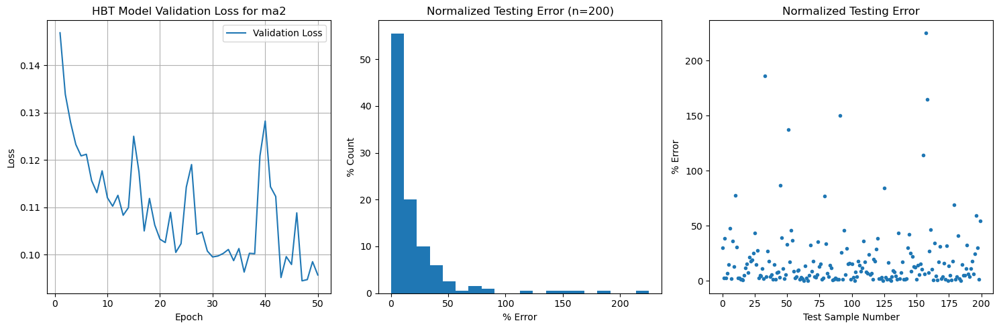

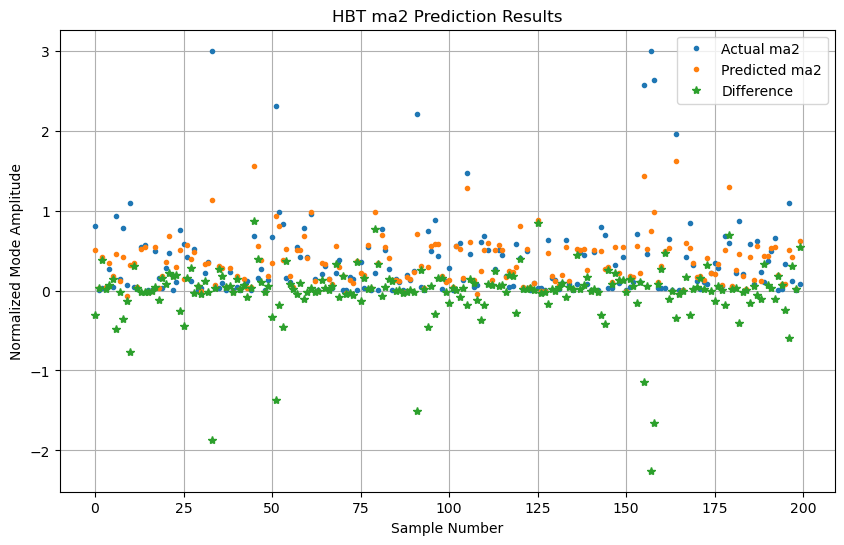

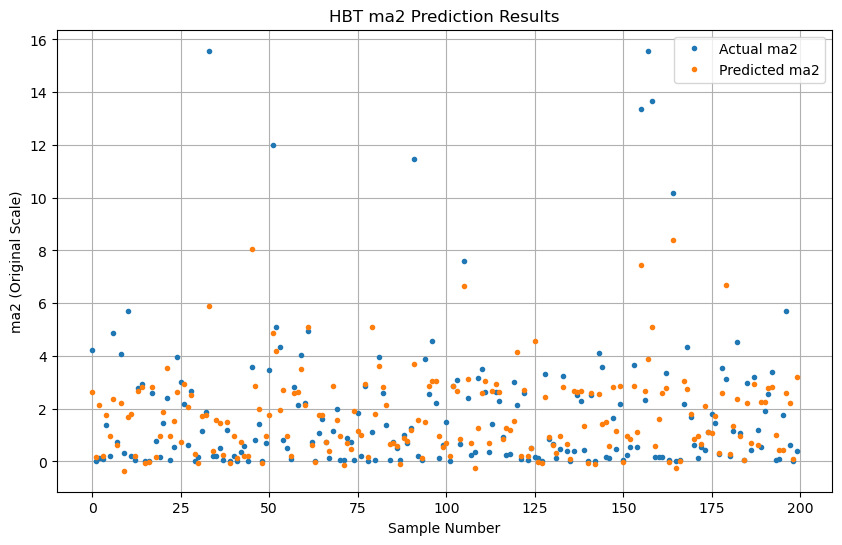

Maximum actual mode amplitude (normalized): 3.00
Maximum predicted mode amplitude (normalized): 1.62
Mean absolute percentage error: 19.03%


In [11]:
# Evaluate the model on test data
predictions = Model.predict(testing_inputs)

# Calculate prediction errors
prediction_errors = np.abs(testing_labels - predictions[:, 0]) * 100

# Create visualization plots
fig, axes = plt.subplots(figsize=(15, 5), ncols=3, nrows=1)

# Plot 1: Training History
axes[0].plot(range(1, len(history.history['val_loss']) + 1), 
             history.history['val_loss'], 
             label='Validation Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title(f'HBT Model Validation Loss for {selected_data_type}')
axes[0].legend()
axes[0].grid(True)

# Plot 2: Error Distribution
weights = np.ones_like(prediction_errors) / len(prediction_errors) * 100
axes[1].hist(prediction_errors, 20, weights=weights)
axes[1].set_xlabel('% Error')
axes[1].set_ylabel('% Count')
axes[1].set_title('Normalized Testing Error (n=200)')

# Plot 3: Error by Sample
axes[2].plot(prediction_errors, '.')
axes[2].set_xlabel('Test Sample Number')
axes[2].set_ylabel('% Error')
axes[2].set_title('Normalized Testing Error')
plt.tight_layout()
plt.show()

# Plot 4: Actual vs Predicted Values
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0], '.', label=f'Predicted {selected_data_type}')
plt.plot(-(testing_labels - predictions[:, 0]), '*', label='Difference')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

# Plot original scale predictions
plt.figure(figsize=(10, 6))
plt.plot(testing_labels * ma_norm, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0] * ma_norm, '.', label=f'Predicted {selected_data_type}')
plt.xlabel('Sample Number')
plt.ylabel(f'{selected_data_type} (Original Scale)')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

print(f"Maximum actual mode amplitude (normalized): {np.max(np.abs(testing_labels)):.2f}")
print(f"Maximum predicted mode amplitude (normalized): {np.max(np.abs(predictions[:, 0])):.2f}")
print(f"Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")

5.191251621246337
Shot 119671: Camera frames=800, HBT frames=800, Time frames=800
Shape of reserved_shot_cut_2d: (800, 32, 32)
Shape of camera_data: (800, 32, 32)
Input data shape: (800, 32, 32, 1)
Model output shape: (None, 1)


Predictions shape: (800,)


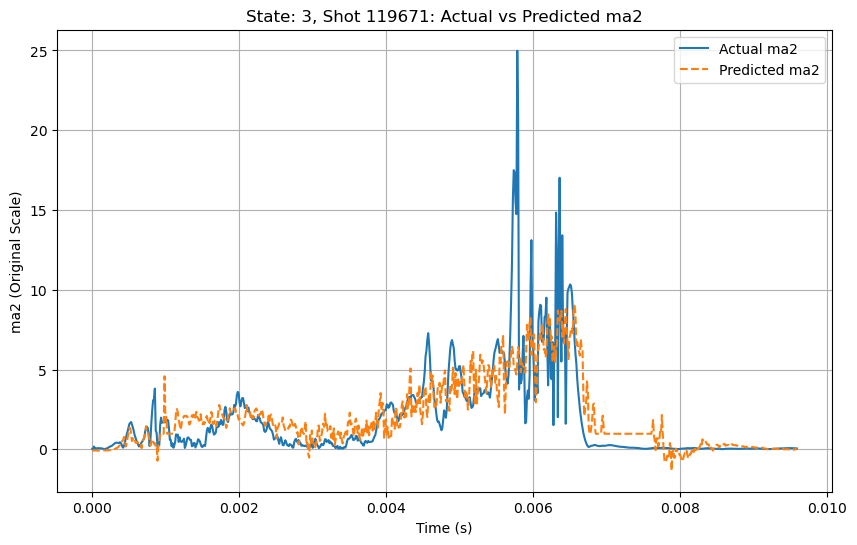

Shot 119671 - Mean absolute percentage error: 20.09%
Shot 119671 - Max actual ma2: 24.98
Shot 119671 - Max predicted ma2: 9.00


In [12]:
print(ma_norm)
def plot_RESERVED_SHOT_predictions(shot, shot_list, cut_training_data_2d, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, model, ma_norm):
    """Plot actual vs predicted Mode 2 amplitude for the reserved shot."""
    if reserved_shot_cut_2d is None:
        print(f"No data available for reserved shot {shot}. No plot generated.")
        return
    
    shot_idx = shot_list.index(shot)
    camera_data = reserved_shot_cut_2d
    hbt_data = hbt_dataType[shot_idx][:, 0]
    time_data = hbt_time_data[shot_idx]

    print(f"Shot {shot}: Camera frames={len(camera_data)}, HBT frames={len(hbt_data)}, Time frames={len(time_data)}")
    print(f"Shape of reserved_shot_cut_2d: {reserved_shot_cut_2d.shape}")
    print(f"Shape of camera_data: {np.array(camera_data).shape}")

    if len(camera_data) == 0:
        print(f"No camera data for shot {shot}. No plot generated.")
        return
    
    if len(camera_data) != len(hbt_data):
        print(f"Warning: Camera data ({len(camera_data)} frames) does not match HBT data ({len(hbt_data)} frames)")

    input_data = np.array(camera_data).reshape(-1, 32, 32, 1)
    print(f"Input data shape: {input_data.shape}")
    print(f"Model output shape: {model.output_shape}")

    predictions = []
    batch_size = 100
    for i in range(0, len(input_data), batch_size):
        batch = input_data[i:i+batch_size]
        batch_pred = model.predict(batch, verbose=0)[:, 0] * ma_norm
        predictions.extend(batch_pred)
    predictions = np.array(predictions)
    print(f"Predictions shape: {predictions.shape}")

    # Rest of the plotting code...
    
    # Plot actual vs predicted using time data
    plt.figure(figsize=(10, 6))
    plt.plot(time_data, hbt_data, label=f'Actual {selected_data_type}')
    plt.plot(time_data, predictions, '--', label=f'Predicted {selected_data_type}')
    plt.xlabel('Time (s)')  # Assuming time is in seconds; adjust if needed
    plt.ylabel(f'{selected_data_type} (Original Scale)')
    plt.title(f'State: {state}, Shot {shot}: Actual vs Predicted {selected_data_type}')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Print metrics
    prediction_errors = np.abs(hbt_data - predictions) / ma_norm * 100
    print(f"Shot {shot} - Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")
    print(f"Shot {shot} - Max actual {selected_data_type}: {np.max(np.abs(hbt_data)):.2f}")
    print(f"Shot {shot} - Max predicted {selected_data_type}: {np.max(np.abs(predictions)):.2f}")

    return predictions

reserved_predictions = plot_RESERVED_SHOT_predictions(
    RESERVED_SHOT, shot_list, cut_training_data_2D, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, william_model, ma_norm
)

In [13]:
# Save true ma2 data, predictions, and time data for reserved shot
time_data = hbt_time_data[shot_list.index(RESERVED_SHOT)]

print(f"Untrimmed: Saving results for state {state}, shot {RESERVED_SHOT}")
print(f"True data defined: {'hbt_dataType' in locals()}, {'shot_list' in locals()}, {'RESERVED_SHOT' in locals()}")
print(f"Predictions defined: {'predictions' in locals()}, shape: {reserved_predictions.shape if 'predictions' in locals() else 'N/A'}")
print(f"Time data defined: {'hbt_time_data' in locals()}, shape: {hbt_time_data[shot_list.index(RESERVED_SHOT)].shape if 'hbt_time_data' in locals() else 'N/A'}")
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_true.npy', hbt_dataType[shot_list.index(RESERVED_SHOT)][:, 0])
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_pred.npy', reserved_predictions)
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_time.npy', time_data)
print("Done")

Untrimmed: Saving results for state 3, shot 119671
True data defined: True, True, True
Predictions defined: True, shape: (800,)
Time data defined: True, shape: (800,)
Done
